In [212]:
import pandas as pd 
import numpy as np
import re

##LDA stuff
import gensim
from gensim.utils import simple_preprocess
import nltk
from nltk.corpus import words
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

##cleaning stuff
from sklearn.metrics.pairwise import cosine_similarity
from nltk.stem.porter import PorterStemmer
from nltk.stem import WordNetLemmatizer

import gensim.corpora as corpora
import pyLDAvis
import pyLDAvis.gensim

##plotting
from matplotlib import pyplot as plt
from matplotlib import colors as mcolors
import seaborn as sns

In [213]:
def preprocess_text(text):
    tokens = word_tokenize(text)
    tokens = [word for word in tokens if word.isalnum()]
    tokens = [word.lower() for word in tokens]
    tokens = [lemmatizer.lemmatize(word) for word in tokens]
    return tokens

In [214]:
def preprocess(text):
    tokens = word_tokenize(text)
    tokens = [word for word in tokens if word.isalnum()]
    tokens = [word.lower() for word in tokens]
    return tokens

In [215]:
def remove_non_english_words(text, valid_words):
    tokens = word_tokenize(text)
    ans = [w for w in tokens if w.lower() in valid_words]
    return ' '.join(ans)

def remove_stopwords(text):
    tokens = word_tokenize(text)
    ans = [w for w in tokens if w.lower() not in stop_words]
    return ' '.join(ans)

# Ibis

In [216]:
df = pd.read_csv('../data/processed/cleaned_ibis-sg-bencoolen.csv')
df.head()

,Unnamed: 0,traveller_username,review_title,review_text,travel_type,traveller_country_origin,traveller_total_contributions,traveller_total_helpful_contributions,rating,valid_rating,label,cleaned_review,combined_review,date,covid,year,stem_review,lem_review
0,0,Love_Life_Sydney,Clean and comfortable,Hotel rooms in Singapore are so expensive so t...,Trip type: Travelled as a couple,"Sydney, Australia",2302.0,871.0,4.0,True,Positive,clean comfortable hotel rooms singapore expens...,Clean and comfortable Hotel rooms in Singapore...,2023-08-01,PostCovid,2023,clean comfort hotel room singapor expens find ...,clean comfortable hotel room singapore expensi...
1,1,Bilal S,"Good hotel, great location",This is a great place! Location is great but t...,Trip type: Travelled with family,"Houston, Texas",4.0,NaN,5.0,True,Positive,good hotel great location great place location...,"Good hotel, great location This is a great pl...",2023-08-01,PostCovid,2023,good hotel great locat great place locat great...,good hotel great location great place location...
2,2,Anthony Fernando,Good place for a decent price.,Good place good price Easy access to the city...,Trip type: Travelled with friends,"Dubai, United Arab Emirates",39.0,38.0,5.0,True,Positive,good place decent price good place good price ...,Good place for a decent price. Good place good...,2022-10-01,PostCovid,2022,good place decent price good place good price ...,good place decent price good place good price ...
3,3,Mjkc204,Great Location and great staff.,The IBIS was a neat and tidy hotel in line wit...,Trip type: Travelled solo,"Ellenbrook, Australia",37.0,19.0,5.0,True,Positive,great location great staff ibis neat tidy hote...,Great Location and great staff. The IBIS was a...,2023-08-01,PostCovid,2023,great locat great staff ibi neat tidi hotel li...,great location great staff ibis neat tidy hote...
4,4,Aung Nanda,Good for budget stay.,I stayed there for 7 days. It was a nice locat...,Trip type: Travelled on business,"Dubai, United Arab Emirates",3.0,4.0,4.0,True,Positive,good budget stay stayed days nice location sev...,Good for budget stay. I stayed there for 7 day...,2022-08-01,PostCovid,2022,good budget stay stay day nice locat seven ele...,good budget stay stay day nice location seven ...


In [217]:
##filter for year >= 2015
df_filtered = df[df['year'] >= 2015]

##preprocess text
nltk.download('stopwords')
nltk.download('words')
# Get the list of valid English words
english_words = set(words.words())
# set stopwords
sw = stopwords.words('english')
sw.append('ibis')
sw.append('boss')
sw.append('village')
sw.append('ibis_bencoolen')
stop_words = set(sw)
lemmatizer = WordNetLemmatizer()

[nltk_data] Downloading package stopwords to C:\Users\Chen
[nltk_data]     Wei\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package words to C:\Users\Chen
[nltk_data]     Wei\AppData\Roaming\nltk_data...
[nltk_data]   Package words is already up-to-date!


## Stemmed

In [218]:
df_filtered['stem_review'] = df_filtered['stem_review'].apply(remove_stopwords)
df_filtered['stem_review'] = df_filtered['stem_review'].apply(remove_non_english_words, valid_words=english_words)
df_filtered['tokens'] = df_filtered['stem_review'].apply(preprocess)

In [219]:
df_precovid = df_filtered[df_filtered['covid'] == 'PreCovid']
df_precovid.head()

,Unnamed: 0,traveller_username,review_title,review_text,travel_type,traveller_country_origin,traveller_total_contributions,traveller_total_helpful_contributions,rating,valid_rating,label,cleaned_review,combined_review,date,covid,year,stem_review,lem_review,tokens
66,66,Beatrice,Cozy Hotel,I spent 2 night at this hotel and all the serv...,NaN,"Batam, Indonesia",8.0,13.0,5.0,True,Positive,cozy hotel spent night hotel service provided ...,Cozy Hotel I spent 2 night at this hotel and a...,2019-12-01,PreCovid,2019,hotel spent night hotel hotel tri breakfast ba...,cozy hotel spend night hotel service provide h...,"[hotel, spent, night, hotel, hotel, tri, break..."
67,67,dinu79,"Smart, Clean, Good Location, Value for money",This was my second stay at Ibis Bencoolen. B...,NaN,"Dubai, United Arab Emirates",212.0,53.0,4.0,True,Positive,smart clean good location value money second s...,"Smart, Clean, Good Location, Value for money T...",2020-01-01,PreCovid,2020,smart clean good money second stay gold member...,smart clean good location value money second s...,"[smart, clean, good, money, second, stay, gold..."
68,68,Marsha F,Wonderful experience,"This was our first time at this hotel, and won...",NaN,"Gatineau, Canada",32.0,45.0,4.0,True,Positive,wonderful experience first time hotel last fri...,Wonderful experience This was our first time a...,2019-10-01,PreCovid,2019,wonder first time hotel last check took bag he...,wonderful experience first time hotel last fri...,"[wonder, first, time, hotel, last, check, took..."
69,69,Geoff_and_Juls,Great Base for Tourists,"Firstly, the good points: Comfortable and clea...",NaN,"Mellieha, Malta",276.0,169.0,4.0,True,Positive,great base tourists firstly good points comfor...,"Great Base for Tourists Firstly, the good poin...",2019-10-01,PreCovid,2019,great base tourist good point comfort clean ro...,great base tourist firstly good point comforta...,"[great, base, tourist, good, point, comfort, c..."
70,70,Gianluca3008,BEST LOCATION,"Very comfortable hotel, nice staff, totally in...",NaN,"Rome, Italy",2192.0,280.0,4.0,True,Positive,best location comfortable hotel nice staff tot...,"BEST LOCATION Very comfortable hotel, nice sta...",2019-10-01,PreCovid,2019,best comfort hotel nice staff total downtown r...,good location comfortable hotel nice staff tot...,"[best, comfort, hotel, nice, staff, total, dow..."


In [220]:
df_postcovid = df_filtered[df_filtered['covid'] == 'PostCovid']
df_postcovid.head()

,Unnamed: 0,traveller_username,review_title,review_text,travel_type,traveller_country_origin,traveller_total_contributions,traveller_total_helpful_contributions,rating,valid_rating,label,cleaned_review,combined_review,date,covid,year,stem_review,lem_review,tokens
0,0,Love_Life_Sydney,Clean and comfortable,Hotel rooms in Singapore are so expensive so t...,Trip type: Travelled as a couple,"Sydney, Australia",2302.0,871.0,4.0,True,Positive,clean comfortable hotel rooms singapore expens...,Clean and comfortable Hotel rooms in Singapore...,2023-08-01,PostCovid,2023,clean comfort hotel room find decent hotel tra...,clean comfortable hotel room singapore expensi...,"[clean, comfort, hotel, room, find, decent, ho..."
1,1,Bilal S,"Good hotel, great location",This is a great place! Location is great but t...,Trip type: Travelled with family,"Houston, Texas",4.0,NaN,5.0,True,Positive,good hotel great location great place location...,"Good hotel, great location This is a great pl...",2023-08-01,PostCovid,2023,good hotel great great place great room small ...,good hotel great location great place location...,"[good, hotel, great, great, place, great, room..."
2,2,Anthony Fernando,Good place for a decent price.,Good place good price Easy access to the city...,Trip type: Travelled with friends,"Dubai, United Arab Emirates",39.0,38.0,5.0,True,Positive,good place decent price good place good price ...,Good place for a decent price. Good place good...,2022-10-01,PostCovid,2022,good place decent price good place good price ...,good place decent price good place good price ...,"[good, place, decent, price, good, place, good..."
3,3,Mjkc204,Great Location and great staff.,The IBIS was a neat and tidy hotel in line wit...,Trip type: Travelled solo,"Ellenbrook, Australia",37.0,19.0,5.0,True,Positive,great location great staff ibis neat tidy hote...,Great Location and great staff. The IBIS was a...,2023-08-01,PostCovid,2023,great great staff neat hotel line star rate st...,great location great staff ibis neat tidy hote...,"[great, great, staff, neat, hotel, line, star,..."
4,4,Aung Nanda,Good for budget stay.,I stayed there for 7 days. It was a nice locat...,Trip type: Travelled on business,"Dubai, United Arab Emirates",3.0,4.0,4.0,True,Positive,good budget stay stayed days nice location sev...,Good for budget stay. I stayed there for 7 day...,2022-08-01,PostCovid,2022,good budget stay stay day nice seven eleven ne...,good budget stay stay day nice location seven ...,"[good, budget, stay, stay, day, nice, seven, e..."


### Unigrams

In [221]:
##Generate LDA dictionary and corpus
pre_dict = corpora.Dictionary(df_precovid['tokens'])
pre_corpus = [pre_dict.doc2bow(text) for text in df_precovid['tokens']]

In [222]:
## Use 5 topics as baseline
lda = gensim.models.ldamodel.LdaModel
pre_ldamodel = lda(pre_corpus, num_topics=5, id2word=pre_dict, passes=15)

In [223]:
##Generate LDA dictionary and corpus
post_dict = corpora.Dictionary(df_postcovid['tokens'])
post_corpus = [post_dict.doc2bow(text) for text in df_postcovid['tokens']]

In [224]:
## Check optimal number of topics
lda = gensim.models.ldamodel.LdaModel
post_ldamodel = lda(post_corpus, num_topics=5, id2word=post_dict, passes=15)

In [225]:
# For Pre-COVID
topics_pre = pre_ldamodel.show_topics(formatted=False)
data_flat_pre = [word for word_list in df_precovid['tokens'] for word in word_list]

# For Post-COVID
topics_post = post_ldamodel.show_topics(formatted=False)
data_flat_post = [word for word_list in df_postcovid['tokens'] for word in word_list]

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_18508\2307337869.py:21: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(df_plot.loc[df_plot.topic_id == i, 'word'], rotation=30, horizontalalignment='right')


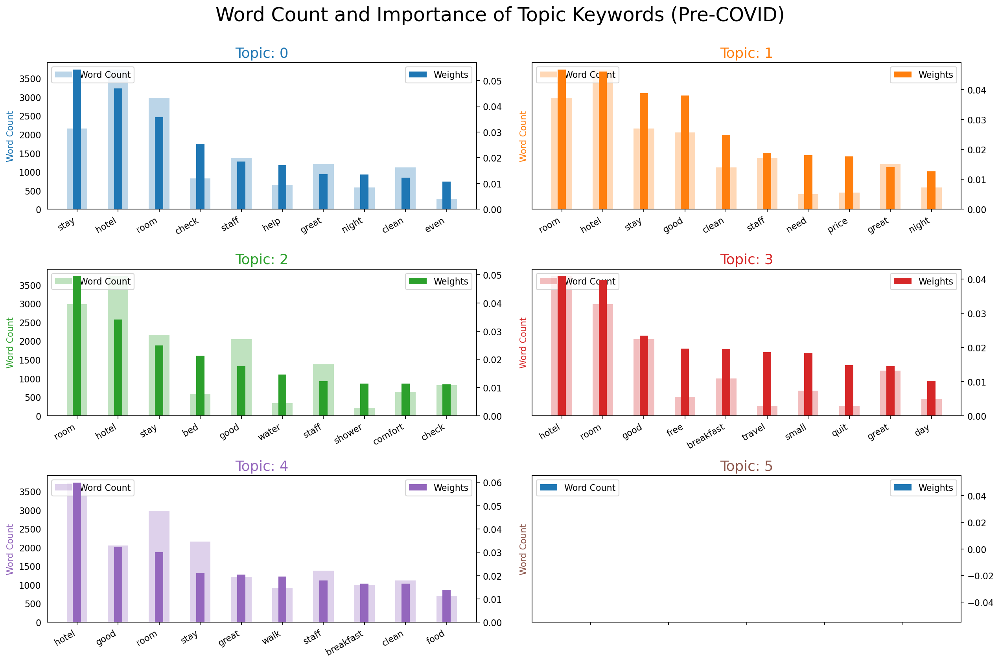

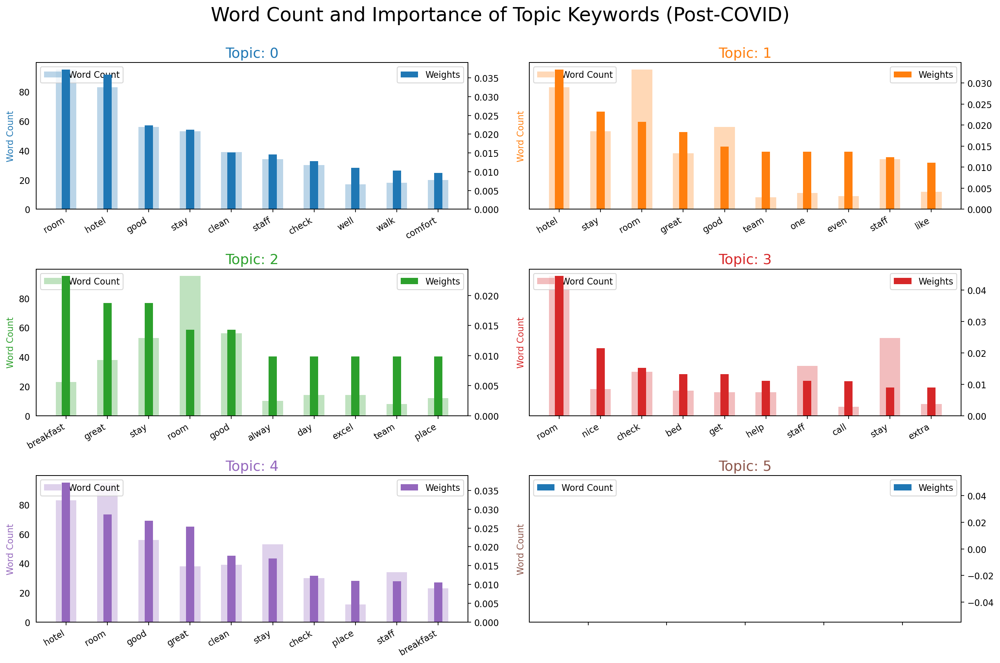

In [226]:
# Create a function to generate the plot
def plot_word_count_importance(topics, data_flat, title):
    out = []
    for i, topic in topics:
        for word, weight in topic:
            out.append([word, i, weight, data_flat.count(word)])

    df_plot = pd.DataFrame(out, columns=['word', 'topic_id', 'importance', 'word_count'])

    # Plot Word Count and Weights of Topic Keywords
    fig, axes = plt.subplots(3, 2, figsize=(16, 10), sharey=True, dpi=160)
    cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]

    for i, ax in enumerate(axes.flatten()):
        ax.bar(x='word', height='word_count', data=df_plot.loc[df_plot.topic_id == i, :], color=cols[i], width=0.5, alpha=0.3, label='Word Count')
        ax_twin = ax.twinx()
        ax_twin.bar(x='word', height='importance', data=df_plot.loc[df_plot.topic_id == i, :], color=cols[i], width=0.2, label='Weights')
        ax.set_ylabel('Word Count', color=cols[i])
        ax.set_title('Topic: ' + str(i), color=cols[i], fontsize=16)
        ax.tick_params(axis='y', left=False)
        ax.set_xticklabels(df_plot.loc[df_plot.topic_id == i, 'word'], rotation=30, horizontalalignment='right')
        ax.legend(loc='upper left')
        ax_twin.legend(loc='upper right')

    fig.tight_layout(w_pad=2)
    fig.suptitle(title, fontsize=22, y=1.05)
    plt.show()

# For Pre-COVID
plot_word_count_importance(topics_pre, data_flat_pre, 'Word Count and Importance of Topic Keywords (Pre-COVID)')

# For Post-COVID
plot_word_count_importance(topics_post, data_flat_post, 'Word Count and Importance of Topic Keywords (Post-COVID)')

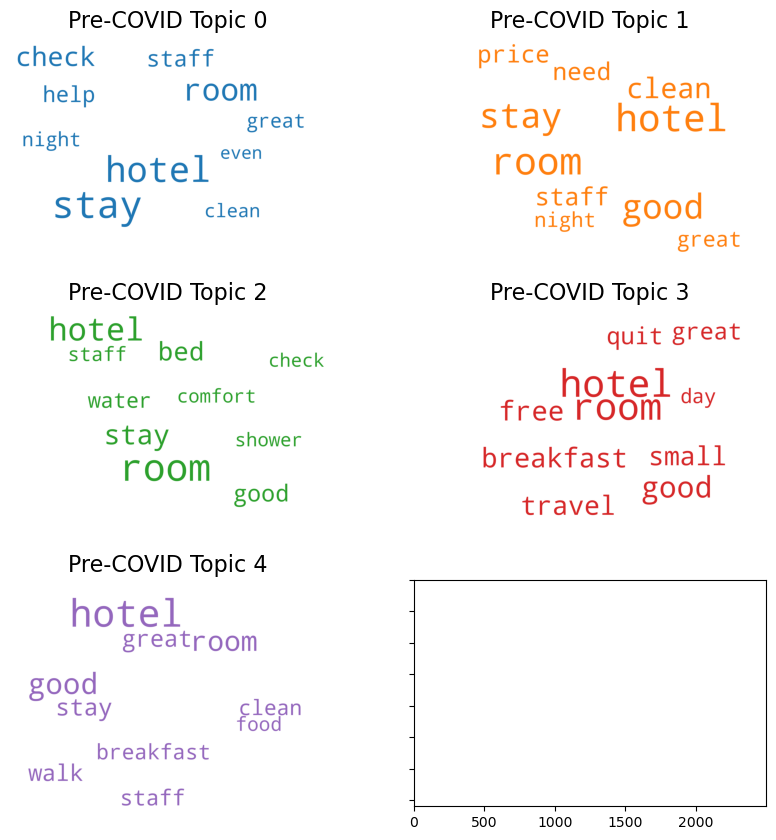

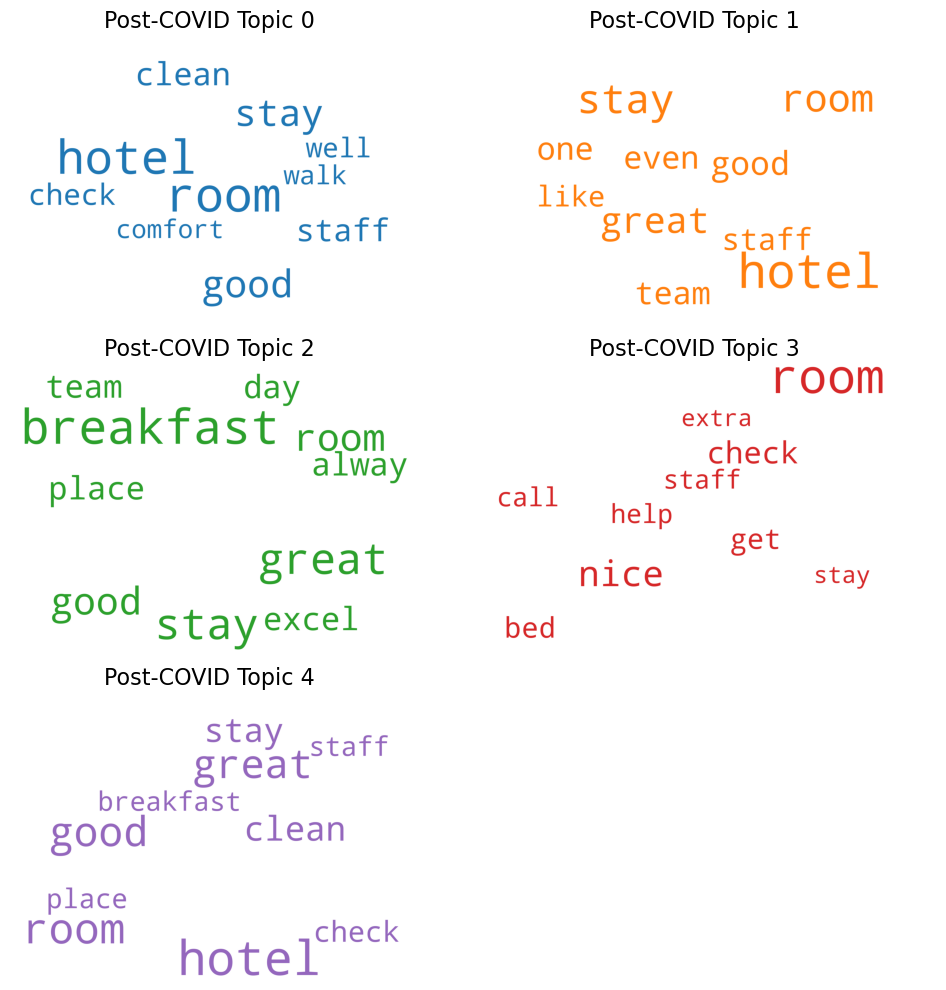

In [227]:
from wordcloud import WordCloud
import matplotlib.colors as mcolors

cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]

# Create WordClouds for each topic in the pre-COVID dataset
clouds_pre = []

for i in range(5):
    cloud = WordCloud(background_color='white',
                      width=2500,
                      height=1800,
                      max_words=10,
                      colormap='tab10',
                      color_func=lambda *args, **kwargs: cols[i],
                      prefer_horizontal=1.0)
    topic_words = dict(pre_ldamodel.show_topic(i, topn=10))
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    clouds_pre.append(cloud)

# Create WordClouds for each topic in the post-COVID dataset
clouds_post = []

for i in range(5):
    cloud = WordCloud(background_color='white',
                      width=2500,
                      height=1800,
                      max_words=10,
                      colormap='tab10',
                      color_func=lambda *args, **kwargs: cols[i],
                      prefer_horizontal=1.0)
    topic_words = dict(post_ldamodel.show_topic(i, topn=10))
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    clouds_post.append(cloud)

# Plot the WordClouds for pre-COVID topics
fig_pre, axes_pre = plt.subplots(3, 2, figsize=(10, 10), sharex=True, sharey=True)

for i, ax in enumerate(axes_pre.flatten()):
    fig_pre.add_subplot(ax)
    if i < len(clouds_pre):
        plt.gca().imshow(clouds_pre[i])
        plt.gca().set_title('Pre-COVID Topic ' + str(i), fontdict=dict(size=16))
        plt.gca().axis('off')

# Plot the WordClouds for post-COVID topics
fig_post, axes_post = plt.subplots(3, 2, figsize=(10, 10), sharex=True, sharey=True)

for i, ax in enumerate(axes_post.flatten()):
    fig_post.add_subplot(ax)
    if i < len(clouds_post):
        plt.gca().imshow(clouds_post[i])
        plt.gca().set_title('Post-COVID Topic ' + str(i), fontdict=dict(size=16))
        plt.gca().axis('off')

plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()

In [228]:
vis = pyLDAvis.gensim.prepare(topic_model=pre_ldamodel, corpus=pre_corpus, dictionary=pre_dict)
pyLDAvis.enable_notebook()
pyLDAvis.display(vis)

In [229]:
vis = pyLDAvis.gensim.prepare(topic_model=post_ldamodel, corpus=post_corpus, dictionary=post_dict)
pyLDAvis.enable_notebook()
pyLDAvis.display(vis)

### Bigrams

In [230]:
clean_precovid = df_precovid['cleaned_review'].apply(preprocess)
clean_precovid = clean_precovid.apply(lambda x: ' '.join(x))
clean_postcovid = df_postcovid['cleaned_review'].apply(preprocess)
clean_postcovid = clean_postcovid.apply(lambda x: ' '.join(x))

In [231]:
from nltk import ngrams
bigrams_precovid = []
bigrams_postcovid = []

for d in clean_precovid:
    tokens = word_tokenize(d)
    bigrams_precovid.append(["_".join(w) for w in ngrams(tokens, 2)])

for e in clean_postcovid:
    tokens = word_tokenize(e)
    bigrams_postcovid.append(['_'.join(w) for w in ngrams(tokens, 2)])


In [232]:
##Generate LDA dictionary and corpus
pre_dict = corpora.Dictionary(bigrams_precovid)
pre_corpus = [pre_dict.doc2bow(text) for text in bigrams_precovid]
## Check optimal number of topics
lda = gensim.models.ldamodel.LdaModel
pre_ldamodel = lda(pre_corpus, num_topics=5, id2word=pre_dict, passes=15)

In [233]:
##Generate LDA dictionary and corpus
post_dict = corpora.Dictionary(bigrams_postcovid)
post_corpus = [post_dict.doc2bow(text) for text in bigrams_postcovid]
## Check optimal number of topics
lda = gensim.models.ldamodel.LdaModel
post_ldamodel = lda(post_corpus, num_topics=5, id2word=post_dict, passes=15)

In [234]:
# For Pre-COVID
topics_pre = pre_ldamodel.show_topics(formatted=False)
data_flat_pre = [word for word_list in bigrams_precovid for word in word_list]

# For Post-COVID
topics_post = post_ldamodel.show_topics(formatted=False)
data_flat_post = [word for word_list in bigrams_postcovid for word in word_list]

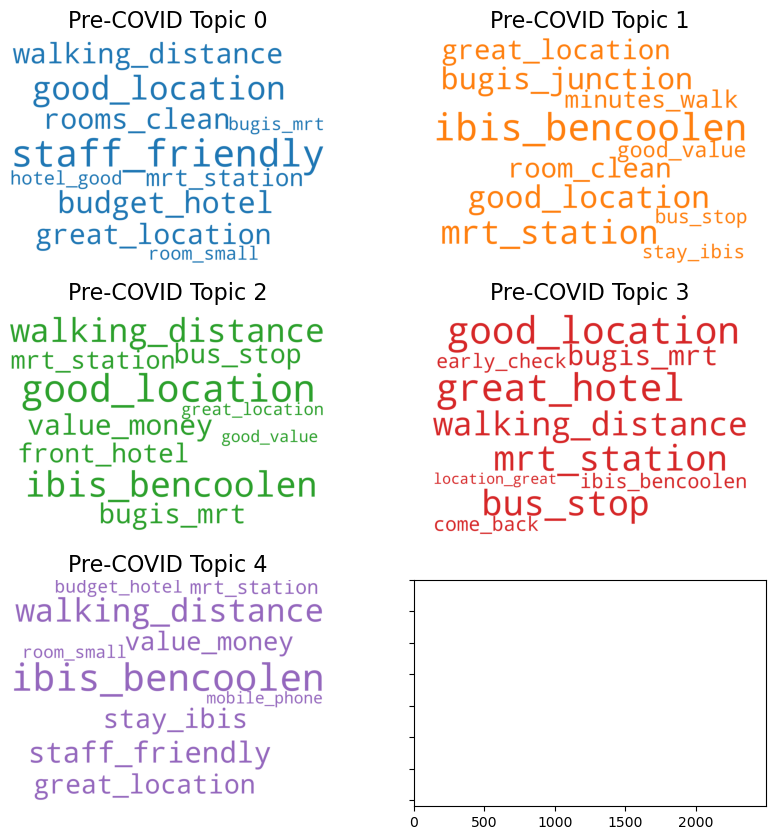

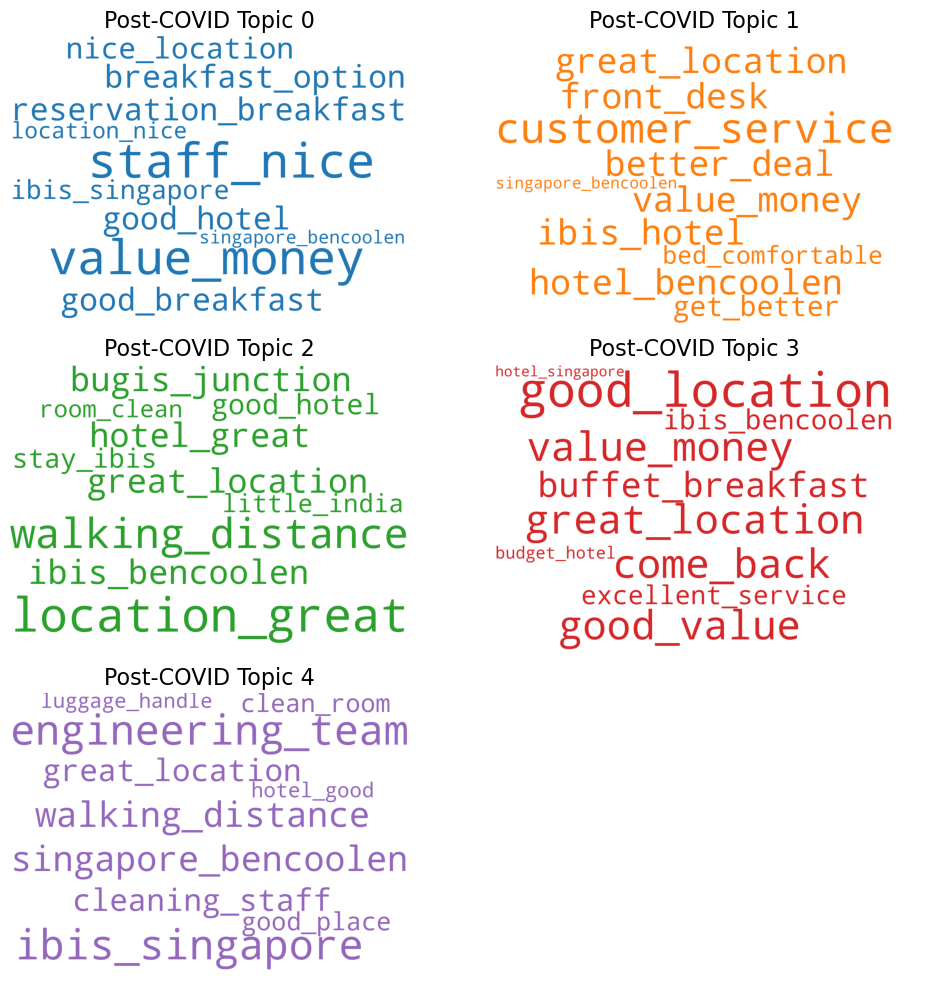

In [235]:
from wordcloud import WordCloud
import matplotlib.colors as mcolors

cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]

# Create WordClouds for each topic in the pre-COVID dataset
clouds_pre = []

for i in range(5):
    cloud = WordCloud(background_color='white',
                      width=2500,
                      height=1800,
                      max_words=10,
                      colormap='tab10',
                      color_func=lambda *args, **kwargs: cols[i],
                      prefer_horizontal=1.0)
    topic_words = dict(pre_ldamodel.show_topic(i, topn=10))
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    clouds_pre.append(cloud)

# Create WordClouds for each topic in the post-COVID dataset
clouds_post = []

for i in range(5):
    cloud = WordCloud(background_color='white',
                      width=2500,
                      height=1800,
                      max_words=10,
                      colormap='tab10',
                      color_func=lambda *args, **kwargs: cols[i],
                      prefer_horizontal=1.0)
    topic_words = dict(post_ldamodel.show_topic(i, topn=10))
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    clouds_post.append(cloud)

# Plot the WordClouds for pre-COVID topics
fig_pre, axes_pre = plt.subplots(3, 2, figsize=(10, 10), sharex=True, sharey=True)

for i, ax in enumerate(axes_pre.flatten()):
    fig_pre.add_subplot(ax)
    if i < len(clouds_pre):
        plt.gca().imshow(clouds_pre[i])
        plt.gca().set_title('Pre-COVID Topic ' + str(i), fontdict=dict(size=16))
        plt.gca().axis('off')

# Plot the WordClouds for post-COVID topics
fig_post, axes_post = plt.subplots(3, 2, figsize=(10, 10), sharex=True, sharey=True)

for i, ax in enumerate(axes_post.flatten()):
    fig_post.add_subplot(ax)
    if i < len(clouds_post):
        plt.gca().imshow(clouds_post[i])
        plt.gca().set_title('Post-COVID Topic ' + str(i), fontdict=dict(size=16))
        plt.gca().axis('off')

plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()

In [236]:
vis = pyLDAvis.gensim.prepare(topic_model=pre_ldamodel, corpus=pre_corpus, dictionary=pre_dict)
pyLDAvis.enable_notebook()
pyLDAvis.display(vis)

In [237]:
vis = pyLDAvis.gensim.prepare(topic_model=post_ldamodel, corpus=post_corpus, dictionary=post_dict)
pyLDAvis.enable_notebook()
pyLDAvis.display(vis)

## Lemmatized

In [238]:
df_filtered['lem_review'] = df_filtered['lem_review'].apply(remove_stopwords)
df_filtered['lem_review'] = df_filtered['lem_review'].apply(remove_non_english_words, valid_words=english_words)
df_filtered['tokens'] = df_filtered['lem_review'].apply(preprocess)

In [239]:
df_precovid = df_filtered[df_filtered['covid'] == 'PreCovid']
df_precovid.head()

,Unnamed: 0,traveller_username,review_title,review_text,travel_type,traveller_country_origin,traveller_total_contributions,traveller_total_helpful_contributions,rating,valid_rating,label,cleaned_review,combined_review,date,covid,year,stem_review,lem_review,tokens
66,66,Beatrice,Cozy Hotel,I spent 2 night at this hotel and all the serv...,NaN,"Batam, Indonesia",8.0,13.0,5.0,True,Positive,cozy hotel spent night hotel service provided ...,Cozy Hotel I spent 2 night at this hotel and a...,2019-12-01,PreCovid,2019,hotel spent night hotel hotel tri breakfast ba...,cozy hotel spend night hotel service provide h...,"[cozy, hotel, spend, night, hotel, service, pr..."
67,67,dinu79,"Smart, Clean, Good Location, Value for money",This was my second stay at Ibis Bencoolen. B...,NaN,"Dubai, United Arab Emirates",212.0,53.0,4.0,True,Positive,smart clean good location value money second s...,"Smart, Clean, Good Location, Value for money T...",2020-01-01,PreCovid,2020,smart clean good money second stay gold member...,smart clean good location value money second s...,"[smart, clean, good, location, value, money, s..."
68,68,Marsha F,Wonderful experience,"This was our first time at this hotel, and won...",NaN,"Gatineau, Canada",32.0,45.0,4.0,True,Positive,wonderful experience first time hotel last fri...,Wonderful experience This was our first time a...,2019-10-01,PreCovid,2019,wonder first time hotel last check took bag he...,wonderful experience first time hotel last fri...,"[wonderful, experience, first, time, hotel, la..."
69,69,Geoff_and_Juls,Great Base for Tourists,"Firstly, the good points: Comfortable and clea...",NaN,"Mellieha, Malta",276.0,169.0,4.0,True,Positive,great base tourists firstly good points comfor...,"Great Base for Tourists Firstly, the good poin...",2019-10-01,PreCovid,2019,great base tourist good point comfort clean ro...,great base tourist firstly good point comforta...,"[great, base, tourist, firstly, good, point, c..."
70,70,Gianluca3008,BEST LOCATION,"Very comfortable hotel, nice staff, totally in...",NaN,"Rome, Italy",2192.0,280.0,4.0,True,Positive,best location comfortable hotel nice staff tot...,"BEST LOCATION Very comfortable hotel, nice sta...",2019-10-01,PreCovid,2019,best comfort hotel nice staff total downtown r...,good location comfortable hotel nice staff tot...,"[good, location, comfortable, hotel, nice, sta..."


In [240]:
df_postcovid = df_filtered[df_filtered['covid'] == 'PostCovid']
df_postcovid.head()

,Unnamed: 0,traveller_username,review_title,review_text,travel_type,traveller_country_origin,traveller_total_contributions,traveller_total_helpful_contributions,rating,valid_rating,label,cleaned_review,combined_review,date,covid,year,stem_review,lem_review,tokens
0,0,Love_Life_Sydney,Clean and comfortable,Hotel rooms in Singapore are so expensive so t...,Trip type: Travelled as a couple,"Sydney, Australia",2302.0,871.0,4.0,True,Positive,clean comfortable hotel rooms singapore expens...,Clean and comfortable Hotel rooms in Singapore...,2023-08-01,PostCovid,2023,clean comfort hotel room find decent hotel tra...,clean comfortable hotel room expensive find de...,"[clean, comfortable, hotel, room, expensive, f..."
1,1,Bilal S,"Good hotel, great location",This is a great place! Location is great but t...,Trip type: Travelled with family,"Houston, Texas",4.0,NaN,5.0,True,Positive,good hotel great location great place location...,"Good hotel, great location This is a great pl...",2023-08-01,PostCovid,2023,good hotel great great place great room small ...,good hotel great location great place location...,"[good, hotel, great, location, great, place, l..."
2,2,Anthony Fernando,Good place for a decent price.,Good place good price Easy access to the city...,Trip type: Travelled with friends,"Dubai, United Arab Emirates",39.0,38.0,5.0,True,Positive,good place decent price good place good price ...,Good place for a decent price. Good place good...,2022-10-01,PostCovid,2022,good place decent price good place good price ...,good place decent price good place good price ...,"[good, place, decent, price, good, place, good..."
3,3,Mjkc204,Great Location and great staff.,The IBIS was a neat and tidy hotel in line wit...,Trip type: Travelled solo,"Ellenbrook, Australia",37.0,19.0,5.0,True,Positive,great location great staff ibis neat tidy hote...,Great Location and great staff. The IBIS was a...,2023-08-01,PostCovid,2023,great great staff neat hotel line star rate st...,great location great staff neat tidy hotel lin...,"[great, location, great, staff, neat, tidy, ho..."
4,4,Aung Nanda,Good for budget stay.,I stayed there for 7 days. It was a nice locat...,Trip type: Travelled on business,"Dubai, United Arab Emirates",3.0,4.0,4.0,True,Positive,good budget stay stayed days nice location sev...,Good for budget stay. I stayed there for 7 day...,2022-08-01,PostCovid,2022,good budget stay stay day nice seven eleven ne...,good budget stay stay day nice location seven ...,"[good, budget, stay, stay, day, nice, location..."


### Unigrams

In [241]:
##Generate LDA dictionary and corpus
pre_dict = corpora.Dictionary(df_precovid['tokens'])
pre_corpus = [pre_dict.doc2bow(text) for text in df_precovid['tokens']]

In [242]:
## Use 5 topics as baseline
lda = gensim.models.ldamodel.LdaModel
pre_ldamodel = lda(pre_corpus, num_topics=5, id2word=pre_dict, passes=15)

In [243]:
##Generate LDA dictionary and corpus
post_dict = corpora.Dictionary(df_postcovid['tokens'])
post_corpus = [post_dict.doc2bow(text) for text in df_postcovid['tokens']]

In [244]:
## Check optimal number of topics
lda = gensim.models.ldamodel.LdaModel
post_ldamodel = lda(post_corpus, num_topics=5, id2word=post_dict, passes=15)

In [245]:
# For Pre-COVID
topics_pre = pre_ldamodel.show_topics(formatted=False)
data_flat_pre = [word for word_list in df_precovid['tokens'] for word in word_list]

# For Post-COVID
topics_post = post_ldamodel.show_topics(formatted=False)
data_flat_post = [word for word_list in df_postcovid['tokens'] for word in word_list]

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_18508\2307337869.py:21: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(df_plot.loc[df_plot.topic_id == i, 'word'], rotation=30, horizontalalignment='right')


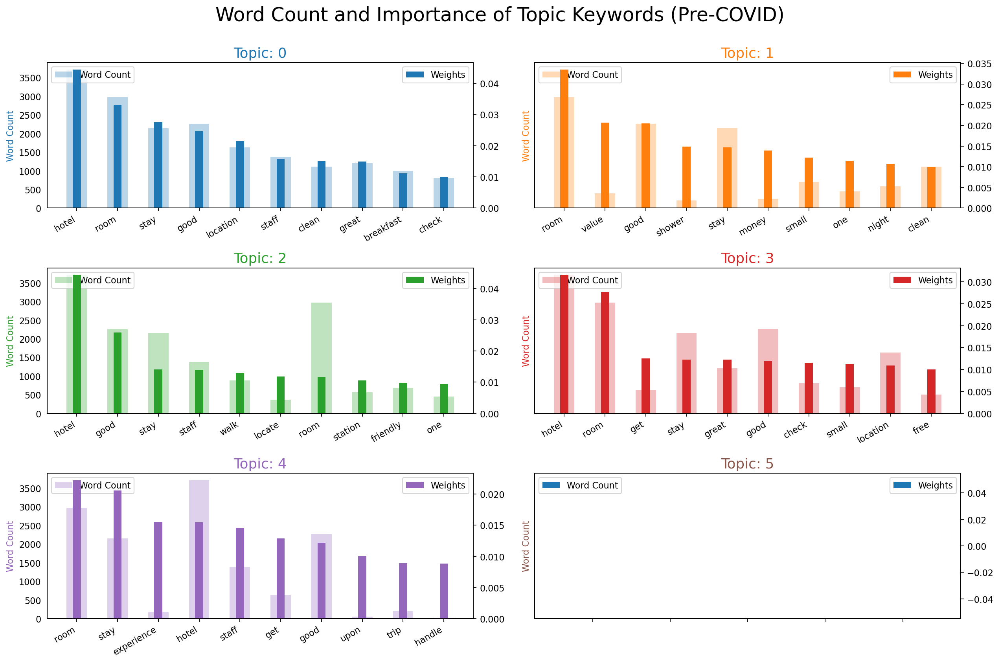

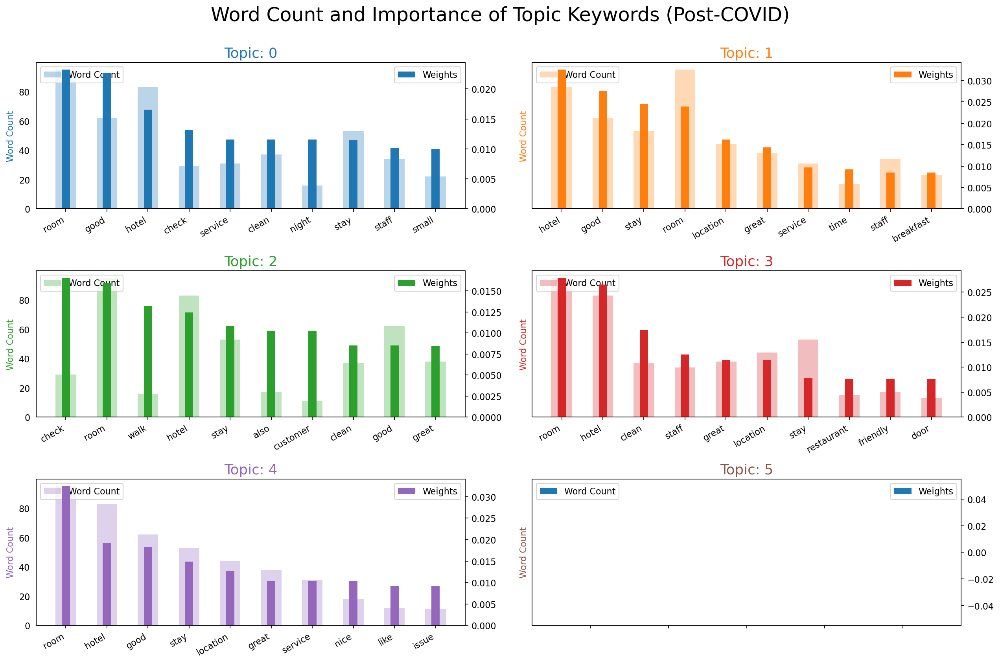

In [246]:
# Create a function to generate the plot
def plot_word_count_importance(topics, data_flat, title):
    out = []
    for i, topic in topics:
        for word, weight in topic:
            out.append([word, i, weight, data_flat.count(word)])

    df_plot = pd.DataFrame(out, columns=['word', 'topic_id', 'importance', 'word_count'])

    # Plot Word Count and Weights of Topic Keywords
    fig, axes = plt.subplots(3, 2, figsize=(16, 10), sharey=True, dpi=160)
    cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]

    for i, ax in enumerate(axes.flatten()):
        ax.bar(x='word', height='word_count', data=df_plot.loc[df_plot.topic_id == i, :], color=cols[i], width=0.5, alpha=0.3, label='Word Count')
        ax_twin = ax.twinx()
        ax_twin.bar(x='word', height='importance', data=df_plot.loc[df_plot.topic_id == i, :], color=cols[i], width=0.2, label='Weights')
        ax.set_ylabel('Word Count', color=cols[i])
        ax.set_title('Topic: ' + str(i), color=cols[i], fontsize=16)
        ax.tick_params(axis='y', left=False)
        ax.set_xticklabels(df_plot.loc[df_plot.topic_id == i, 'word'], rotation=30, horizontalalignment='right')
        ax.legend(loc='upper left')
        ax_twin.legend(loc='upper right')

    fig.tight_layout(w_pad=2)
    fig.suptitle(title, fontsize=22, y=1.05)
    plt.show()

# For Pre-COVID
plot_word_count_importance(topics_pre, data_flat_pre, 'Word Count and Importance of Topic Keywords (Pre-COVID)')

# For Post-COVID
plot_word_count_importance(topics_post, data_flat_post, 'Word Count and Importance of Topic Keywords (Post-COVID)')

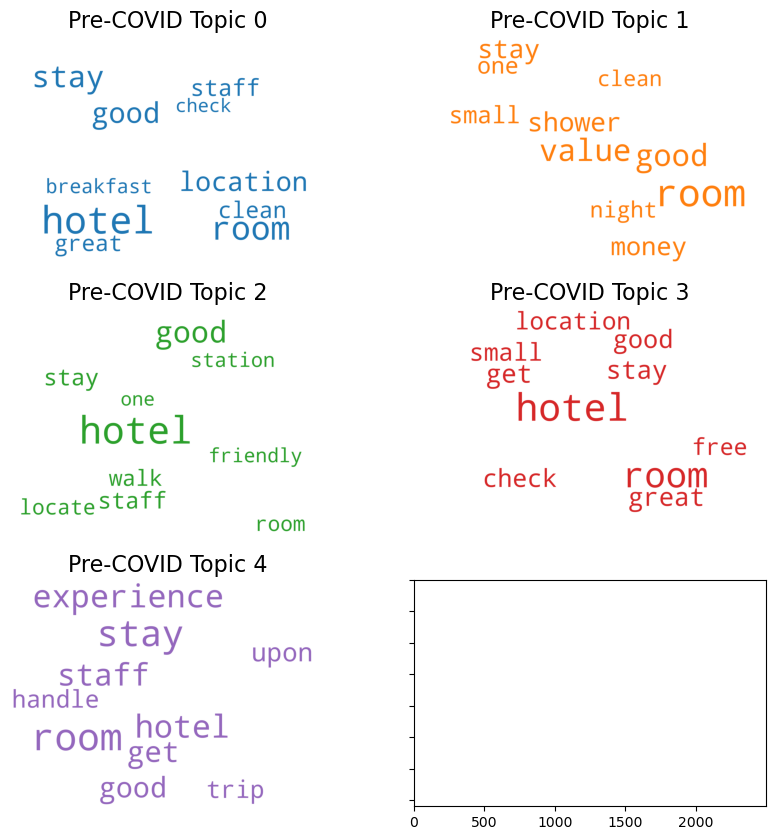

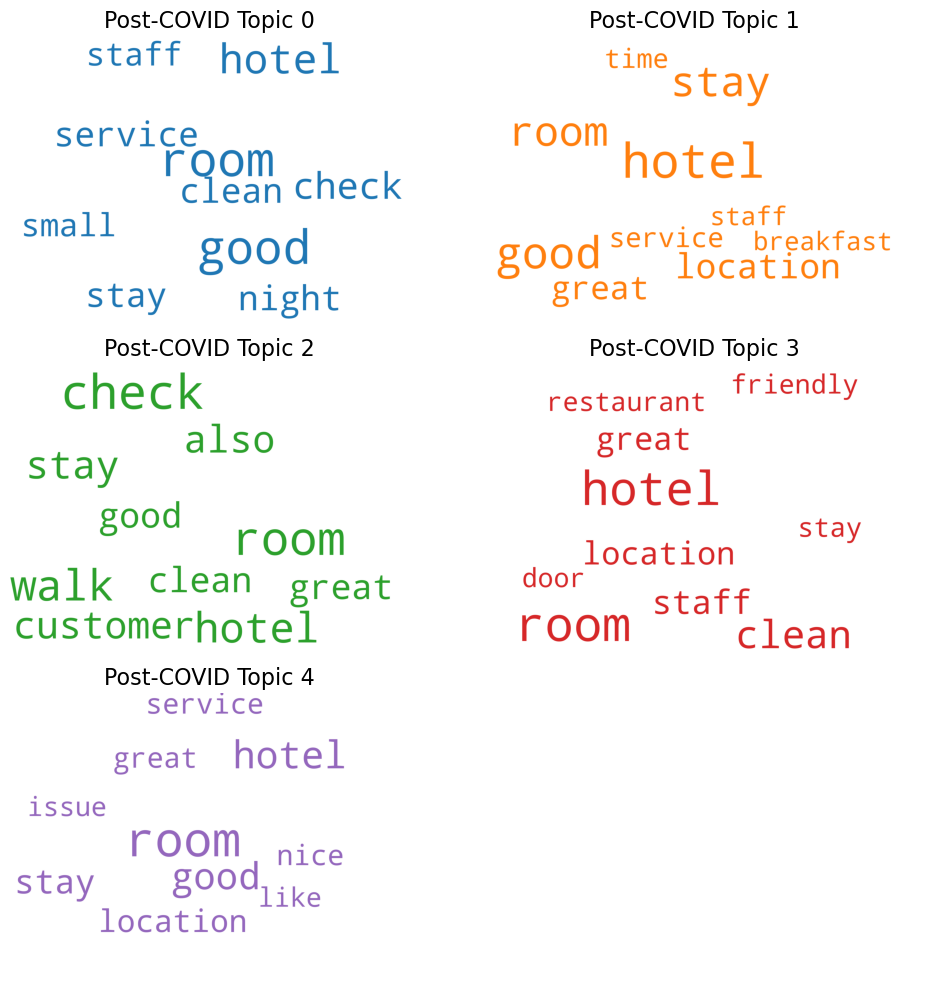

In [247]:
from wordcloud import WordCloud
import matplotlib.colors as mcolors

cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]

# Create WordClouds for each topic in the pre-COVID dataset
clouds_pre = []

for i in range(5):
    cloud = WordCloud(background_color='white',
                      width=2500,
                      height=1800,
                      max_words=10,
                      colormap='tab10',
                      color_func=lambda *args, **kwargs: cols[i],
                      prefer_horizontal=1.0)
    topic_words = dict(pre_ldamodel.show_topic(i, topn=10))
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    clouds_pre.append(cloud)

# Create WordClouds for each topic in the post-COVID dataset
clouds_post = []

for i in range(5):
    cloud = WordCloud(background_color='white',
                      width=2500,
                      height=1800,
                      max_words=10,
                      colormap='tab10',
                      color_func=lambda *args, **kwargs: cols[i],
                      prefer_horizontal=1.0)
    topic_words = dict(post_ldamodel.show_topic(i, topn=10))
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    clouds_post.append(cloud)

# Plot the WordClouds for pre-COVID topics
fig_pre, axes_pre = plt.subplots(3, 2, figsize=(10, 10), sharex=True, sharey=True)

for i, ax in enumerate(axes_pre.flatten()):
    fig_pre.add_subplot(ax)
    if i < len(clouds_pre):
        plt.gca().imshow(clouds_pre[i])
        plt.gca().set_title('Pre-COVID Topic ' + str(i), fontdict=dict(size=16))
        plt.gca().axis('off')

# Plot the WordClouds for post-COVID topics
fig_post, axes_post = plt.subplots(3, 2, figsize=(10, 10), sharex=True, sharey=True)

for i, ax in enumerate(axes_post.flatten()):
    fig_post.add_subplot(ax)
    if i < len(clouds_post):
        plt.gca().imshow(clouds_post[i])
        plt.gca().set_title('Post-COVID Topic ' + str(i), fontdict=dict(size=16))
        plt.gca().axis('off')

plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()

In [248]:
vis = pyLDAvis.gensim.prepare(topic_model=pre_ldamodel, corpus=pre_corpus, dictionary=pre_dict)
pyLDAvis.enable_notebook()
pyLDAvis.display(vis)

In [249]:
vis = pyLDAvis.gensim.prepare(topic_model=post_ldamodel, corpus=post_corpus, dictionary=post_dict)
pyLDAvis.enable_notebook()
pyLDAvis.display(vis)

### Bigrams

In [250]:
clean_precovid = df_precovid['cleaned_review'].apply(preprocess)
clean_precovid = clean_precovid.apply(lambda x: ' '.join(x))
clean_postcovid = df_postcovid['cleaned_review'].apply(preprocess)
clean_postcovid = clean_postcovid.apply(lambda x: ' '.join(x))

In [251]:
from nltk import ngrams
bigrams_precovid = []
bigrams_postcovid = []

for d in clean_precovid:
    tokens = word_tokenize(d)
    bigrams_precovid.append(["_".join(w) for w in ngrams(tokens, 2)])

for e in clean_postcovid:
    tokens = word_tokenize(e)
    bigrams_postcovid.append(['_'.join(w) for w in ngrams(tokens, 2)])


In [252]:
##Generate LDA dictionary and corpus
pre_dict = corpora.Dictionary(bigrams_precovid)
pre_corpus = [pre_dict.doc2bow(text) for text in bigrams_precovid]
## Check optimal number of topics
lda = gensim.models.ldamodel.LdaModel
pre_ldamodel = lda(pre_corpus, num_topics=5, id2word=pre_dict, passes=15)

In [253]:
##Generate LDA dictionary and corpus
post_dict = corpora.Dictionary(bigrams_postcovid)
post_corpus = [post_dict.doc2bow(text) for text in bigrams_postcovid]
## Check optimal number of topics
lda = gensim.models.ldamodel.LdaModel
post_ldamodel = lda(post_corpus, num_topics=5, id2word=post_dict, passes=15)

In [254]:
# For Pre-COVID
topics_pre = pre_ldamodel.show_topics(formatted=False)
data_flat_pre = [word for word_list in bigrams_precovid for word in word_list]

# For Post-COVID
topics_post = post_ldamodel.show_topics(formatted=False)
data_flat_post = [word for word_list in bigrams_postcovid for word in word_list]

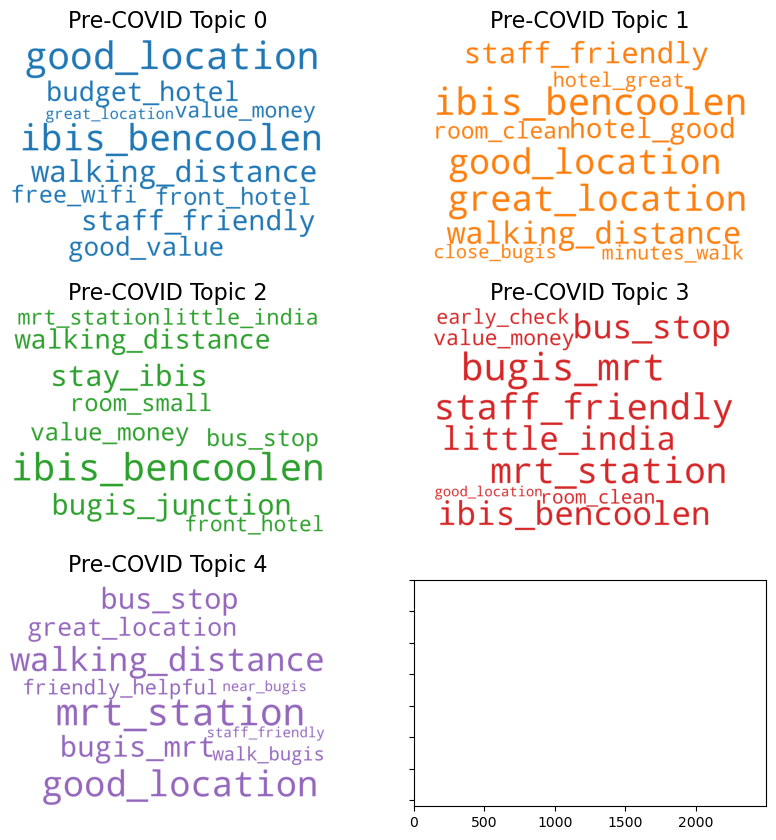

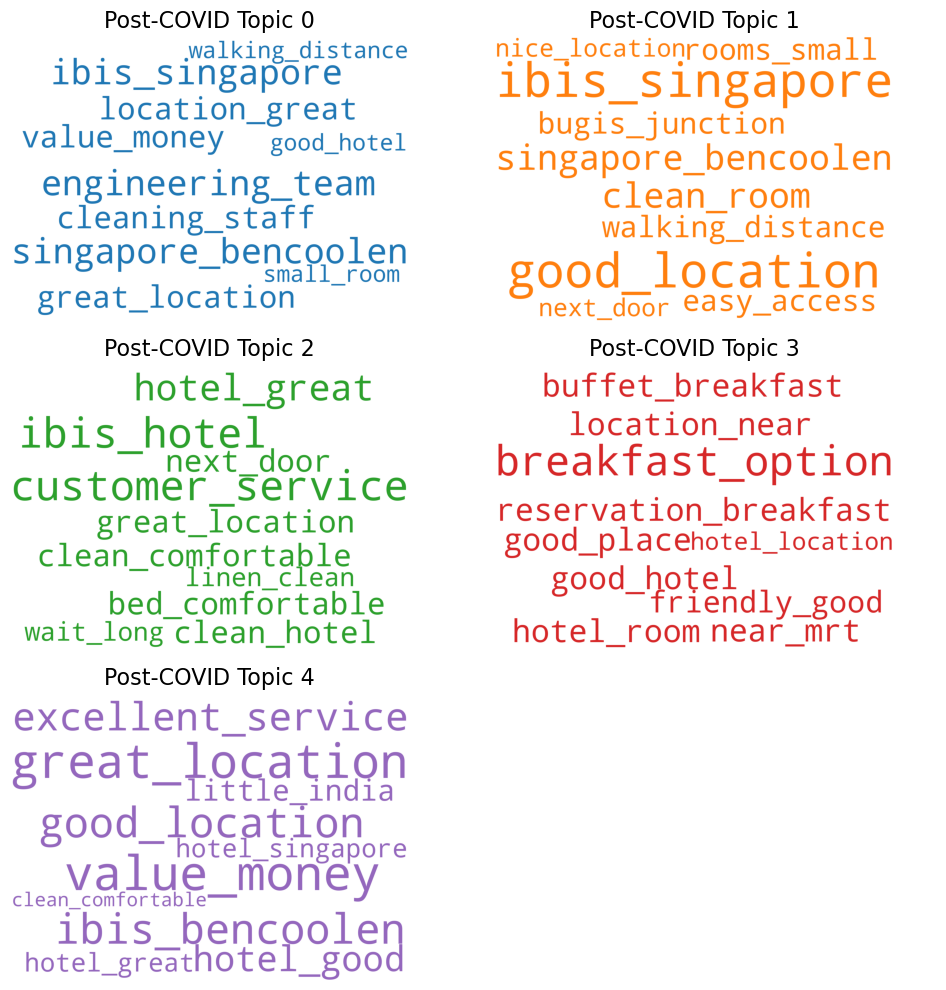

In [255]:
from wordcloud import WordCloud
import matplotlib.colors as mcolors

cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]

# Create WordClouds for each topic in the pre-COVID dataset
clouds_pre = []

for i in range(5):
    cloud = WordCloud(background_color='white',
                      width=2500,
                      height=1800,
                      max_words=10,
                      colormap='tab10',
                      color_func=lambda *args, **kwargs: cols[i],
                      prefer_horizontal=1.0)
    topic_words = dict(pre_ldamodel.show_topic(i, topn=10))
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    clouds_pre.append(cloud)

# Create WordClouds for each topic in the post-COVID dataset
clouds_post = []

for i in range(5):
    cloud = WordCloud(background_color='white',
                      width=2500,
                      height=1800,
                      max_words=10,
                      colormap='tab10',
                      color_func=lambda *args, **kwargs: cols[i],
                      prefer_horizontal=1.0)
    topic_words = dict(post_ldamodel.show_topic(i, topn=10))
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    clouds_post.append(cloud)

# Plot the WordClouds for pre-COVID topics
fig_pre, axes_pre = plt.subplots(3, 2, figsize=(10, 10), sharex=True, sharey=True)

for i, ax in enumerate(axes_pre.flatten()):
    fig_pre.add_subplot(ax)
    if i < len(clouds_pre):
        plt.gca().imshow(clouds_pre[i])
        plt.gca().set_title('Pre-COVID Topic ' + str(i), fontdict=dict(size=16))
        plt.gca().axis('off')

# Plot the WordClouds for post-COVID topics
fig_post, axes_post = plt.subplots(3, 2, figsize=(10, 10), sharex=True, sharey=True)

for i, ax in enumerate(axes_post.flatten()):
    fig_post.add_subplot(ax)
    if i < len(clouds_post):
        plt.gca().imshow(clouds_post[i])
        plt.gca().set_title('Post-COVID Topic ' + str(i), fontdict=dict(size=16))
        plt.gca().axis('off')

plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()

In [256]:
vis = pyLDAvis.gensim.prepare(topic_model=pre_ldamodel, corpus=pre_corpus, dictionary=pre_dict)
pyLDAvis.enable_notebook()
pyLDAvis.display(vis)

In [257]:
vis = pyLDAvis.gensim.prepare(topic_model=post_ldamodel, corpus=post_corpus, dictionary=post_dict)
pyLDAvis.enable_notebook()
pyLDAvis.display(vis)

# Hotel Boss

In [258]:
df = pd.read_csv('../data/processed/cleaned_hotel-boss.csv')
df.head()

,Unnamed: 0,traveller_username,review_title,review_text,travel_type,traveller_country_origin,traveller_total_contributions,traveller_total_helpful_contributions,rating,valid_rating,label,cleaned_review,combined_review,date,covid,year,stem_review,lem_review
0,0,Natasha simone pammen,Family holiday,Check is was easy Eric sia helped us and manag...,Trip type: Travelled with family,NaN,1,NaN,3.0,True,Neutral,family holiday check easy eric sia helped us m...,Family holiday Check is was easy Eric sia hel...,2023-08-01,PostCovid,2023,famili holiday check easi eric sia help us man...,family holiday check easy eric sia help we man...
1,1,Sightseer15459582505,Early check-in was a breeze!,Check-in was a breeze! Booked a room eith balc...,Trip type: Travelled as a couple,NaN,7,NaN,5.0,True,Positive,early check breeze check breeze booked room ei...,Early check-in was a breeze! Check-in was a br...,2023-09-01,PostCovid,2023,earli check breez check breez book room eith b...,early check breeze check breeze book room eith...
2,2,Georgia C,Nice facilities- very compact,"The hotel is generally clean, located near tra...",Trip type: Travelled as a couple,"London, United Kingdom",158,63.0,4.0,True,Positive,nice facilities compact hotel generally clean ...,Nice facilities- very compact The hotel is gen...,2023-09-01,PostCovid,2023,nice facil compact hotel gener clean locat nea...,nice facility compact hotel generally clean lo...
3,3,Wanderer59520264795,The worst part of our Singapore trip,Singapore is a lovely place with friendly peop...,Trip type: Travelled as a couple,NaN,4,NaN,3.0,True,Neutral,worst part singapore trip singapore lovely pla...,The worst part of our Singapore trip Singapore...,2023-09-01,PostCovid,2023,worst part singapor trip singapor love place f...,bad part singapore trip singapore lovely place...
4,4,Daniel T,Service with a smile,I arrive at the boss hotel and had Great servi...,Trip type: Travelled with friends,NaN,1,NaN,5.0,True,Positive,service smile arrive boss hotel great service ...,Service with a smile I arrive at the boss hote...,2023-09-01,PostCovid,2023,servic smile arriv boss hotel great servic vas...,service smile arrive boss hotel great service ...


In [259]:
##filter for year >= 2015
df_filtered = df[df['year'] >= 2015]

## Stemmed

In [260]:
df_filtered['stem_review'] = df_filtered['stem_review'].apply(remove_stopwords)
df_filtered['stem_review'] = df_filtered['stem_review'].apply(remove_non_english_words, valid_words=english_words)
df_filtered['tokens'] = df_filtered['stem_review'].apply(preprocess)

In [261]:
df_precovid = df_filtered[df_filtered['covid'] == 'PreCovid']
df_precovid.head()

,Unnamed: 0,traveller_username,review_title,review_text,travel_type,traveller_country_origin,traveller_total_contributions,traveller_total_helpful_contributions,rating,valid_rating,label,cleaned_review,combined_review,date,covid,year,stem_review,lem_review,tokens
459,459,Imran S,"Centrally located, Wonderful stay",After quite a bit of search and through scanni...,NaN,"Bengaluru, India",158,183.0,4.0,True,Positive,centrally located wonderful stay quite bit sea...,"Centrally located, Wonderful stay After quite ...",2020-01-01,PreCovid,2020,central wonder stay quit bit search scan hotel...,centrally locate wonderful stay quite bit sear...,"[central, wonder, stay, quit, bit, search, sca..."
484,484,amit,Excellent place to stay,Hotel boss's location is very good. Its close ...,NaN,NaN,2,4.0,5.0,True,Positive,excellent place stay hotel boss location good ...,Excellent place to stay Hotel boss's location ...,2019-12-01,PreCovid,2019,excel place stay hotel good close hotel neat c...,excellent place stay hotel boss location good ...,"[excel, place, stay, hotel, good, close, hotel..."
499,499,Kushal2687,Small rooms but surprisingly efficient,What is it with hotels in Singapore having ext...,NaN,"Sharjah, United Arab Emirates",694,133.0,4.0,True,Positive,small rooms surprisingly efficient hotels sing...,Small rooms but surprisingly efficient What is...,2019-07-01,PreCovid,2019,small room hotel cramp room room standard twin...,small room surprisingly efficient hotel singap...,"[small, room, hotel, cramp, room, room, standa..."
526,526,aljiem,Nice hotel and staff,"Friendly staff and nice hotel\r\nClean, comfor...",Trip type: Travelled as a couple,kuantan,3,2.0,5.0,True,Positive,nice hotel staff friendly staff nice hotel cle...,Nice hotel and staff Friendly staff and nice h...,2019-05-01,PreCovid,2019,nice hotel staff staff nice hotel clean comfor...,nice hotel staff friendly staff nice hotel cle...,"[nice, hotel, staff, staff, nice, hotel, clean..."
529,529,MUSKAN AGARWAL,Budget friendly,It's a budget friendly hotel located very near...,Trip type: Travelled with family,"Chennai (Madras), India",4,8.0,5.0,True,Positive,budget friendly budget friendly hotel located ...,Budget friendly It's a budget friendly hotel l...,2020-01-01,PreCovid,2020,budget budget hotel food market breakfast pure...,budget friendly budget friendly hotel locate n...,"[budget, budget, hotel, food, market, breakfas..."


In [262]:
df_postcovid = df_filtered[df_filtered['covid'] == 'PostCovid']
df_postcovid.head()

,Unnamed: 0,traveller_username,review_title,review_text,travel_type,traveller_country_origin,traveller_total_contributions,traveller_total_helpful_contributions,rating,valid_rating,label,cleaned_review,combined_review,date,covid,year,stem_review,lem_review,tokens
0,0,Natasha simone pammen,Family holiday,Check is was easy Eric sia helped us and manag...,Trip type: Travelled with family,NaN,1,NaN,3.0,True,Neutral,family holiday check easy eric sia helped us m...,Family holiday Check is was easy Eric sia hel...,2023-08-01,PostCovid,2023,holiday check eric help us get us check nice a...,family holiday check easy eric sia help we man...,"[holiday, check, eric, help, us, get, us, chec..."
1,1,Sightseer15459582505,Early check-in was a breeze!,Check-in was a breeze! Booked a room eith balc...,Trip type: Travelled as a couple,NaN,7,NaN,5.0,True,Positive,early check breeze check breeze booked room ei...,Early check-in was a breeze! Check-in was a br...,2023-09-01,PostCovid,2023,check check book room gave us room top floor w...,early check breeze check breeze book room eith...,"[check, check, book, room, gave, us, room, top..."
2,2,Georgia C,Nice facilities- very compact,"The hotel is generally clean, located near tra...",Trip type: Travelled as a couple,"London, United Kingdom",158,63.0,4.0,True,Positive,nice facilities compact hotel generally clean ...,Nice facilities- very compact The hotel is gen...,2023-09-01,PostCovid,2023,nice compact hotel clean near transport pool a...,nice facility compact hotel generally clean lo...,"[nice, compact, hotel, clean, near, transport,..."
3,3,Wanderer59520264795,The worst part of our Singapore trip,Singapore is a lovely place with friendly peop...,Trip type: Travelled as a couple,NaN,4,NaN,3.0,True,Neutral,worst part singapore trip singapore lovely pla...,The worst part of our Singapore trip Singapore...,2023-09-01,PostCovid,2023,worst part trip love place hotel let trip diff...,bad part singapore trip singapore lovely place...,"[worst, part, trip, love, place, hotel, let, t..."
4,4,Daniel T,Service with a smile,I arrive at the boss hotel and had Great servi...,Trip type: Travelled with friends,NaN,1,NaN,5.0,True,Positive,service smile arrive boss hotel great service ...,Service with a smile I arrive at the boss hote...,2023-09-01,PostCovid,2023,smile hotel great hotel got check straight awa...,service smile arrive boss hotel great service ...,"[smile, hotel, great, hotel, got, check, strai..."


### Unigrams

In [263]:
##Generate LDA dictionary and corpus
pre_dict = corpora.Dictionary(df_precovid['tokens'])
pre_corpus = [pre_dict.doc2bow(text) for text in df_precovid['tokens']]

In [264]:
## Use 5 topics as baseline
lda = gensim.models.ldamodel.LdaModel
pre_ldamodel = lda(pre_corpus, num_topics=5, id2word=pre_dict, passes=15)

In [265]:
##Generate LDA dictionary and corpus
post_dict = corpora.Dictionary(df_postcovid['tokens'])
post_corpus = [post_dict.doc2bow(text) for text in df_postcovid['tokens']]

In [266]:
## Check optimal number of topics
lda = gensim.models.ldamodel.LdaModel
post_ldamodel = lda(post_corpus, num_topics=5, id2word=post_dict, passes=15)

In [267]:
# For Pre-COVID
topics_pre = pre_ldamodel.show_topics(formatted=False)
data_flat_pre = [word for word_list in df_precovid['tokens'] for word in word_list]

# For Post-COVID
topics_post = post_ldamodel.show_topics(formatted=False)
data_flat_post = [word for word_list in df_postcovid['tokens'] for word in word_list]

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_18508\2307337869.py:21: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(df_plot.loc[df_plot.topic_id == i, 'word'], rotation=30, horizontalalignment='right')


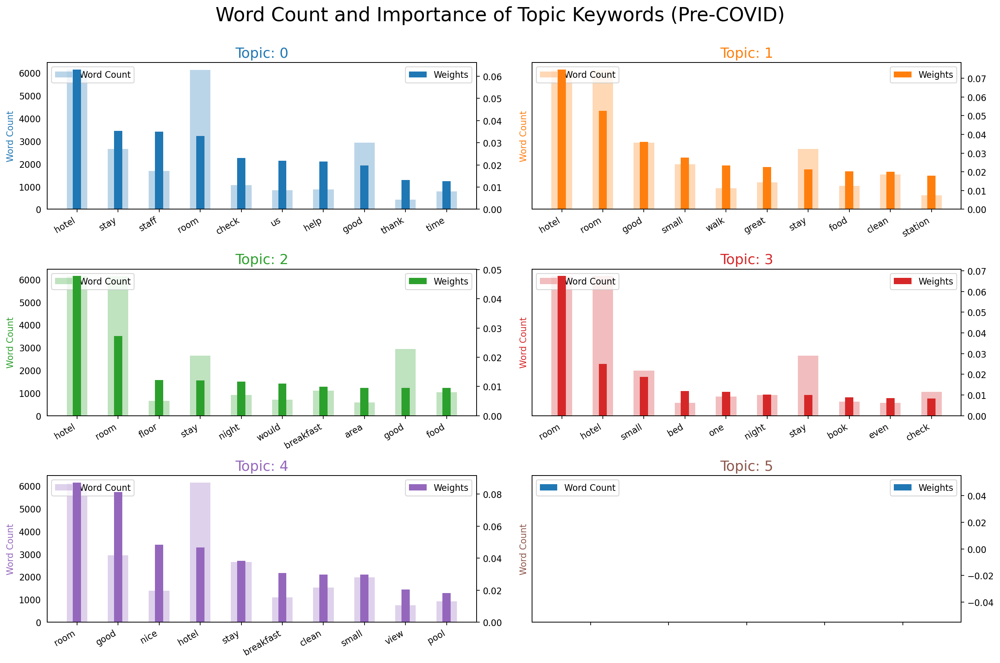

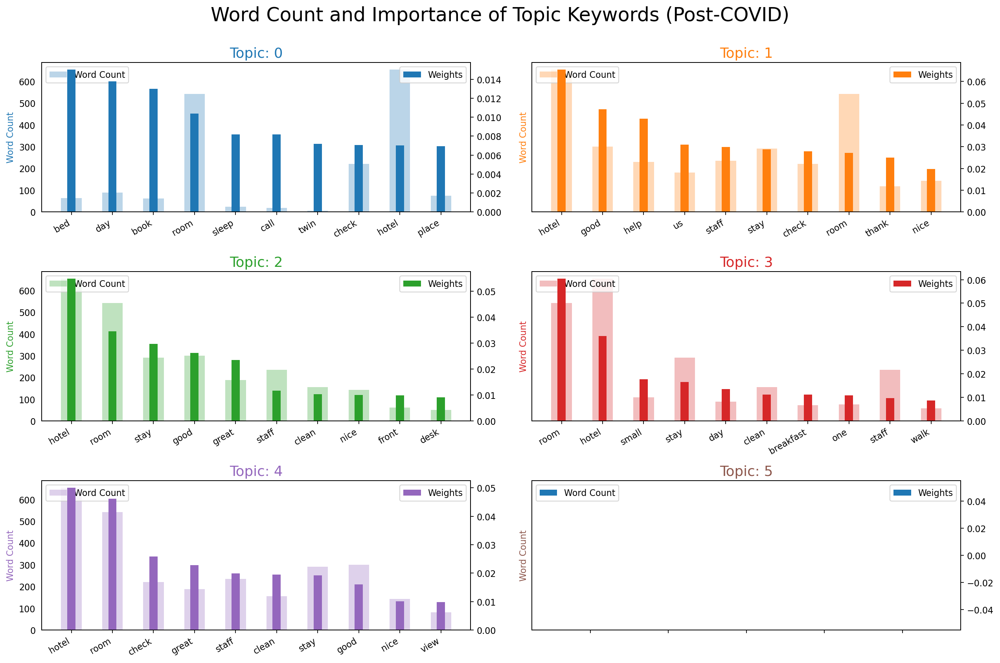

In [268]:
# Create a function to generate the plot
def plot_word_count_importance(topics, data_flat, title):
    out = []
    for i, topic in topics:
        for word, weight in topic:
            out.append([word, i, weight, data_flat.count(word)])

    df_plot = pd.DataFrame(out, columns=['word', 'topic_id', 'importance', 'word_count'])

    # Plot Word Count and Weights of Topic Keywords
    fig, axes = plt.subplots(3, 2, figsize=(16, 10), sharey=True, dpi=160)
    cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]

    for i, ax in enumerate(axes.flatten()):
        ax.bar(x='word', height='word_count', data=df_plot.loc[df_plot.topic_id == i, :], color=cols[i], width=0.5, alpha=0.3, label='Word Count')
        ax_twin = ax.twinx()
        ax_twin.bar(x='word', height='importance', data=df_plot.loc[df_plot.topic_id == i, :], color=cols[i], width=0.2, label='Weights')
        ax.set_ylabel('Word Count', color=cols[i])
        ax.set_title('Topic: ' + str(i), color=cols[i], fontsize=16)
        ax.tick_params(axis='y', left=False)
        ax.set_xticklabels(df_plot.loc[df_plot.topic_id == i, 'word'], rotation=30, horizontalalignment='right')
        ax.legend(loc='upper left')
        ax_twin.legend(loc='upper right')

    fig.tight_layout(w_pad=2)
    fig.suptitle(title, fontsize=22, y=1.05)
    plt.show()

# For Pre-COVID
plot_word_count_importance(topics_pre, data_flat_pre, 'Word Count and Importance of Topic Keywords (Pre-COVID)')

# For Post-COVID
plot_word_count_importance(topics_post, data_flat_post, 'Word Count and Importance of Topic Keywords (Post-COVID)')

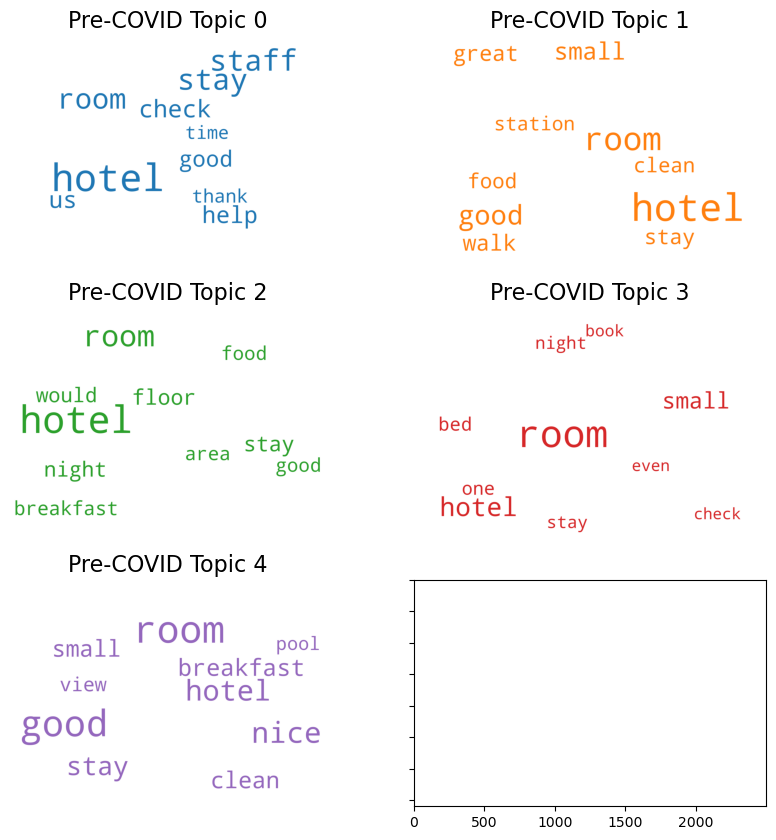

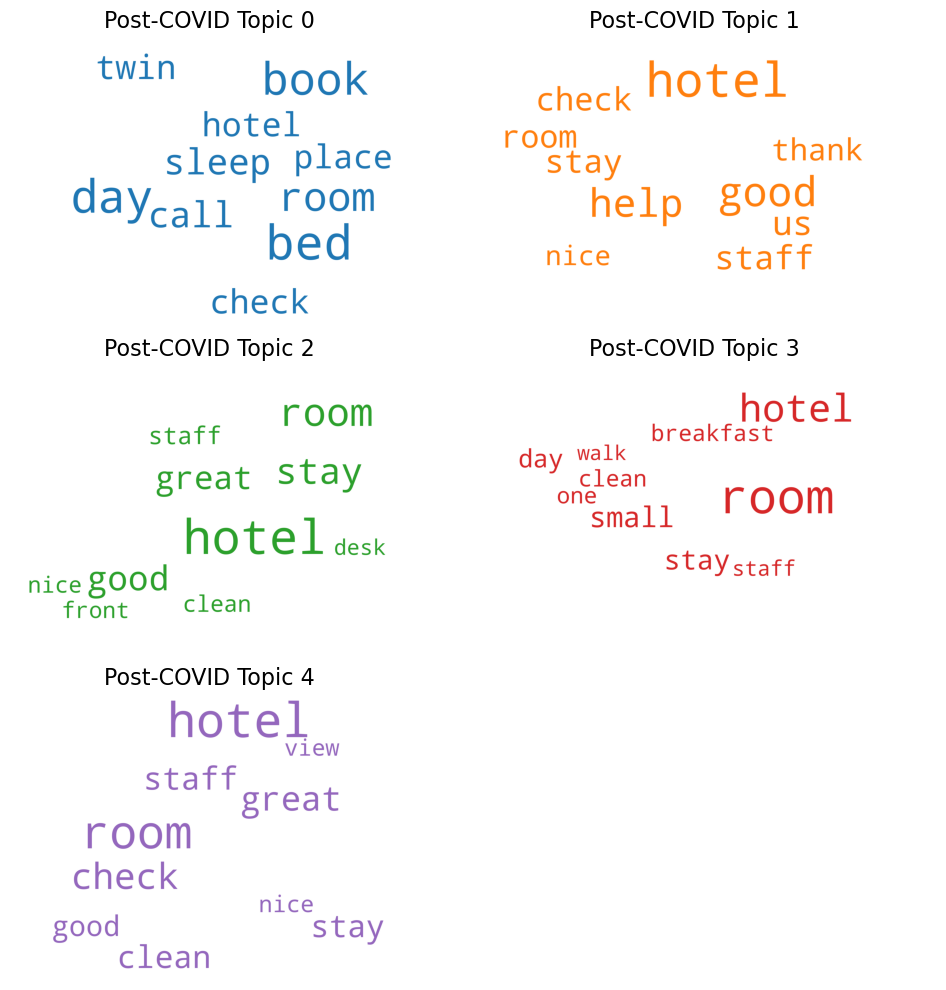

In [269]:
from wordcloud import WordCloud
import matplotlib.colors as mcolors

cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]

# Create WordClouds for each topic in the pre-COVID dataset
clouds_pre = []

for i in range(5):
    cloud = WordCloud(background_color='white',
                      width=2500,
                      height=1800,
                      max_words=10,
                      colormap='tab10',
                      color_func=lambda *args, **kwargs: cols[i],
                      prefer_horizontal=1.0)
    topic_words = dict(pre_ldamodel.show_topic(i, topn=10))
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    clouds_pre.append(cloud)

# Create WordClouds for each topic in the post-COVID dataset
clouds_post = []

for i in range(5):
    cloud = WordCloud(background_color='white',
                      width=2500,
                      height=1800,
                      max_words=10,
                      colormap='tab10',
                      color_func=lambda *args, **kwargs: cols[i],
                      prefer_horizontal=1.0)
    topic_words = dict(post_ldamodel.show_topic(i, topn=10))
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    clouds_post.append(cloud)

# Plot the WordClouds for pre-COVID topics
fig_pre, axes_pre = plt.subplots(3, 2, figsize=(10, 10), sharex=True, sharey=True)

for i, ax in enumerate(axes_pre.flatten()):
    fig_pre.add_subplot(ax)
    if i < len(clouds_pre):
        plt.gca().imshow(clouds_pre[i])
        plt.gca().set_title('Pre-COVID Topic ' + str(i), fontdict=dict(size=16))
        plt.gca().axis('off')

# Plot the WordClouds for post-COVID topics
fig_post, axes_post = plt.subplots(3, 2, figsize=(10, 10), sharex=True, sharey=True)

for i, ax in enumerate(axes_post.flatten()):
    fig_post.add_subplot(ax)
    if i < len(clouds_post):
        plt.gca().imshow(clouds_post[i])
        plt.gca().set_title('Post-COVID Topic ' + str(i), fontdict=dict(size=16))
        plt.gca().axis('off')

plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()

In [270]:
vis = pyLDAvis.gensim.prepare(topic_model=pre_ldamodel, corpus=pre_corpus, dictionary=pre_dict)
pyLDAvis.enable_notebook()
pyLDAvis.display(vis)

In [271]:
vis = pyLDAvis.gensim.prepare(topic_model=post_ldamodel, corpus=post_corpus, dictionary=post_dict)
pyLDAvis.enable_notebook()
pyLDAvis.display(vis)

### Bigrams

In [272]:
clean_precovid = df_precovid['cleaned_review'].apply(preprocess)
clean_precovid = clean_precovid.apply(lambda x: ' '.join(x))
clean_postcovid = df_postcovid['cleaned_review'].apply(preprocess)
clean_postcovid = clean_postcovid.apply(lambda x: ' '.join(x))

In [273]:
from nltk import ngrams
bigrams_precovid = []
bigrams_postcovid = []

for d in clean_precovid:
    tokens = word_tokenize(d)
    bigrams_precovid.append(["_".join(w) for w in ngrams(tokens, 2)])

for e in clean_postcovid:
    tokens = word_tokenize(e)
    bigrams_postcovid.append(['_'.join(w) for w in ngrams(tokens, 2)])


In [274]:
##Generate LDA dictionary and corpus
pre_dict = corpora.Dictionary(bigrams_precovid)
pre_corpus = [pre_dict.doc2bow(text) for text in bigrams_precovid]
## Check optimal number of topics
lda = gensim.models.ldamodel.LdaModel
pre_ldamodel = lda(pre_corpus, num_topics=5, id2word=pre_dict, passes=15)

In [275]:
##Generate LDA dictionary and corpus
post_dict = corpora.Dictionary(bigrams_postcovid)
post_corpus = [post_dict.doc2bow(text) for text in bigrams_postcovid]
## Check optimal number of topics
lda = gensim.models.ldamodel.LdaModel
post_ldamodel = lda(post_corpus, num_topics=5, id2word=post_dict, passes=15)

In [276]:
# For Pre-COVID
topics_pre = pre_ldamodel.show_topics(formatted=False)
data_flat_pre = [word for word_list in bigrams_precovid for word in word_list]

# For Post-COVID
topics_post = post_ldamodel.show_topics(formatted=False)
data_flat_post = [word for word_list in bigrams_postcovid for word in word_list]

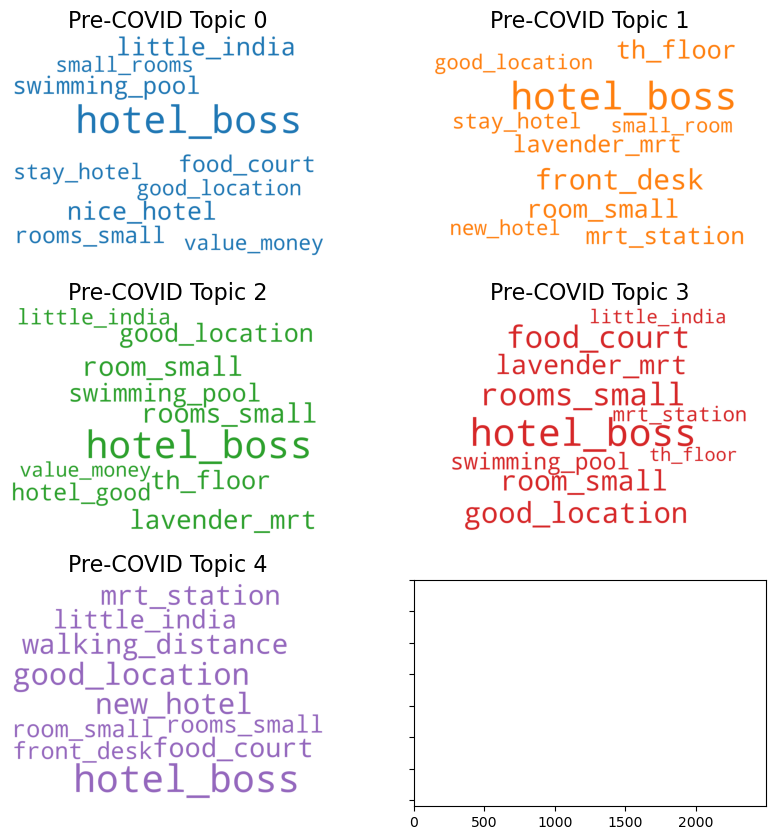

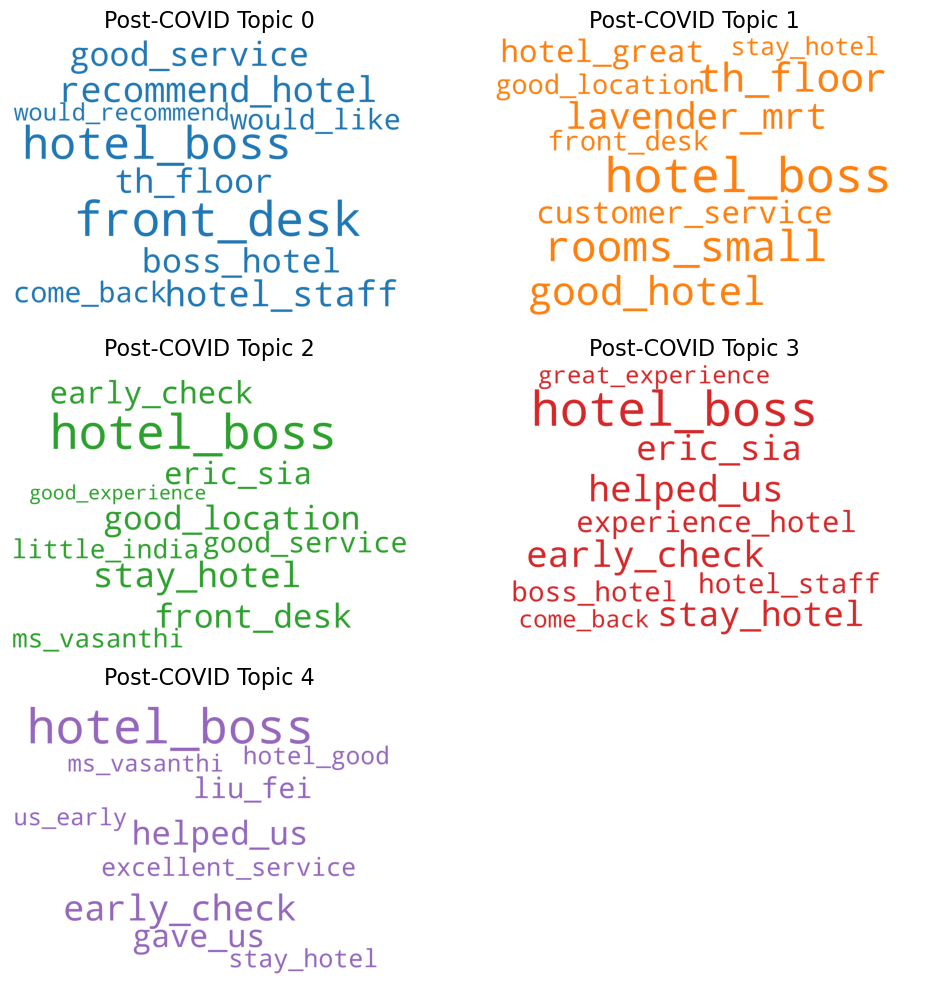

In [277]:
from wordcloud import WordCloud
import matplotlib.colors as mcolors

cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]

# Create WordClouds for each topic in the pre-COVID dataset
clouds_pre = []

for i in range(5):
    cloud = WordCloud(background_color='white',
                      width=2500,
                      height=1800,
                      max_words=10,
                      colormap='tab10',
                      color_func=lambda *args, **kwargs: cols[i],
                      prefer_horizontal=1.0)
    topic_words = dict(pre_ldamodel.show_topic(i, topn=10))
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    clouds_pre.append(cloud)

# Create WordClouds for each topic in the post-COVID dataset
clouds_post = []

for i in range(5):
    cloud = WordCloud(background_color='white',
                      width=2500,
                      height=1800,
                      max_words=10,
                      colormap='tab10',
                      color_func=lambda *args, **kwargs: cols[i],
                      prefer_horizontal=1.0)
    topic_words = dict(post_ldamodel.show_topic(i, topn=10))
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    clouds_post.append(cloud)

# Plot the WordClouds for pre-COVID topics
fig_pre, axes_pre = plt.subplots(3, 2, figsize=(10, 10), sharex=True, sharey=True)

for i, ax in enumerate(axes_pre.flatten()):
    fig_pre.add_subplot(ax)
    if i < len(clouds_pre):
        plt.gca().imshow(clouds_pre[i])
        plt.gca().set_title('Pre-COVID Topic ' + str(i), fontdict=dict(size=16))
        plt.gca().axis('off')

# Plot the WordClouds for post-COVID topics
fig_post, axes_post = plt.subplots(3, 2, figsize=(10, 10), sharex=True, sharey=True)

for i, ax in enumerate(axes_post.flatten()):
    fig_post.add_subplot(ax)
    if i < len(clouds_post):
        plt.gca().imshow(clouds_post[i])
        plt.gca().set_title('Post-COVID Topic ' + str(i), fontdict=dict(size=16))
        plt.gca().axis('off')

plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()

In [278]:
vis = pyLDAvis.gensim.prepare(topic_model=pre_ldamodel, corpus=pre_corpus, dictionary=pre_dict)
pyLDAvis.enable_notebook()
pyLDAvis.display(vis)

In [279]:
vis = pyLDAvis.gensim.prepare(topic_model=post_ldamodel, corpus=post_corpus, dictionary=post_dict)
pyLDAvis.enable_notebook()
pyLDAvis.display(vis)

## Lemmatized

In [280]:
df_filtered['lem_review'] = df_filtered['lem_review'].apply(remove_stopwords)
df_filtered['lem_review'] = df_filtered['lem_review'].apply(remove_non_english_words, valid_words=english_words)
df_filtered['tokens'] = df_filtered['lem_review'].apply(preprocess)

In [281]:
df_precovid = df_filtered[df_filtered['covid'] == 'PreCovid']
df_precovid.head()

,Unnamed: 0,traveller_username,review_title,review_text,travel_type,traveller_country_origin,traveller_total_contributions,traveller_total_helpful_contributions,rating,valid_rating,label,cleaned_review,combined_review,date,covid,year,stem_review,lem_review,tokens
459,459,Imran S,"Centrally located, Wonderful stay",After quite a bit of search and through scanni...,NaN,"Bengaluru, India",158,183.0,4.0,True,Positive,centrally located wonderful stay quite bit sea...,"Centrally located, Wonderful stay After quite ...",2020-01-01,PreCovid,2020,central wonder stay quit bit search scan hotel...,centrally locate wonderful stay quite bit sear...,"[centrally, locate, wonderful, stay, quite, bi..."
484,484,amit,Excellent place to stay,Hotel boss's location is very good. Its close ...,NaN,NaN,2,4.0,5.0,True,Positive,excellent place stay hotel boss location good ...,Excellent place to stay Hotel boss's location ...,2019-12-01,PreCovid,2019,excel place stay hotel good close hotel neat c...,excellent place stay hotel location good close...,"[excellent, place, stay, hotel, location, good..."
499,499,Kushal2687,Small rooms but surprisingly efficient,What is it with hotels in Singapore having ext...,NaN,"Sharjah, United Arab Emirates",694,133.0,4.0,True,Positive,small rooms surprisingly efficient hotels sing...,Small rooms but surprisingly efficient What is...,2019-07-01,PreCovid,2019,small room hotel cramp room room standard twin...,small room surprisingly efficient hotel extrem...,"[small, room, surprisingly, efficient, hotel, ..."
526,526,aljiem,Nice hotel and staff,"Friendly staff and nice hotel\r\nClean, comfor...",Trip type: Travelled as a couple,kuantan,3,2.0,5.0,True,Positive,nice hotel staff friendly staff nice hotel cle...,Nice hotel and staff Friendly staff and nice h...,2019-05-01,PreCovid,2019,nice hotel staff staff nice hotel clean comfor...,nice hotel staff friendly staff nice hotel cle...,"[nice, hotel, staff, friendly, staff, nice, ho..."
529,529,MUSKAN AGARWAL,Budget friendly,It's a budget friendly hotel located very near...,Trip type: Travelled with family,"Chennai (Madras), India",4,8.0,5.0,True,Positive,budget friendly budget friendly hotel located ...,Budget friendly It's a budget friendly hotel l...,2020-01-01,PreCovid,2020,budget budget hotel food market breakfast pure...,budget friendly budget friendly hotel locate n...,"[budget, friendly, budget, friendly, hotel, lo..."


In [282]:
df_postcovid = df_filtered[df_filtered['covid'] == 'PostCovid']
df_postcovid.head()

,Unnamed: 0,traveller_username,review_title,review_text,travel_type,traveller_country_origin,traveller_total_contributions,traveller_total_helpful_contributions,rating,valid_rating,label,cleaned_review,combined_review,date,covid,year,stem_review,lem_review,tokens
0,0,Natasha simone pammen,Family holiday,Check is was easy Eric sia helped us and manag...,Trip type: Travelled with family,NaN,1,NaN,3.0,True,Neutral,family holiday check easy eric sia helped us m...,Family holiday Check is was easy Eric sia hel...,2023-08-01,PostCovid,2023,holiday check eric help us get us check nice a...,family holiday check easy eric help manage get...,"[family, holiday, check, easy, eric, help, man..."
1,1,Sightseer15459582505,Early check-in was a breeze!,Check-in was a breeze! Booked a room eith balc...,Trip type: Travelled as a couple,NaN,7,NaN,5.0,True,Positive,early check breeze check breeze booked room ei...,Early check-in was a breeze! Check-in was a br...,2023-09-01,PostCovid,2023,check check book room gave us room top floor w...,early check breeze check breeze book room balc...,"[early, check, breeze, check, breeze, book, ro..."
2,2,Georgia C,Nice facilities- very compact,"The hotel is generally clean, located near tra...",Trip type: Travelled as a couple,"London, United Kingdom",158,63.0,4.0,True,Positive,nice facilities compact hotel generally clean ...,Nice facilities- very compact The hotel is gen...,2023-09-01,PostCovid,2023,nice compact hotel clean near transport pool a...,nice facility compact hotel generally clean lo...,"[nice, facility, compact, hotel, generally, cl..."
3,3,Wanderer59520264795,The worst part of our Singapore trip,Singapore is a lovely place with friendly peop...,Trip type: Travelled as a couple,NaN,4,NaN,3.0,True,Neutral,worst part singapore trip singapore lovely pla...,The worst part of our Singapore trip Singapore...,2023-09-01,PostCovid,2023,worst part trip love place hotel let trip diff...,bad part trip lovely place friendly people exp...,"[bad, part, trip, lovely, place, friendly, peo..."
4,4,Daniel T,Service with a smile,I arrive at the boss hotel and had Great servi...,Trip type: Travelled with friends,NaN,1,NaN,5.0,True,Positive,service smile arrive boss hotel great service ...,Service with a smile I arrive at the boss hote...,2023-09-01,PostCovid,2023,smile hotel great hotel got check straight awa...,service smile arrive hotel great service arriv...,"[service, smile, arrive, hotel, great, service..."


### Unigrams

In [283]:
##Generate LDA dictionary and corpus
pre_dict = corpora.Dictionary(df_precovid['tokens'])
pre_corpus = [pre_dict.doc2bow(text) for text in df_precovid['tokens']]

In [284]:
## Use 5 topics as baseline
lda = gensim.models.ldamodel.LdaModel
pre_ldamodel = lda(pre_corpus, num_topics=5, id2word=pre_dict, passes=15)

In [285]:
##Generate LDA dictionary and corpus
post_dict = corpora.Dictionary(df_postcovid['tokens'])
post_corpus = [post_dict.doc2bow(text) for text in df_postcovid['tokens']]

In [286]:
## Check optimal number of topics
lda = gensim.models.ldamodel.LdaModel
post_ldamodel = lda(post_corpus, num_topics=5, id2word=post_dict, passes=15)

In [287]:
# For Pre-COVID
topics_pre = pre_ldamodel.show_topics(formatted=False)
data_flat_pre = [word for word_list in df_precovid['tokens'] for word in word_list]

# For Post-COVID
topics_post = post_ldamodel.show_topics(formatted=False)
data_flat_post = [word for word_list in df_postcovid['tokens'] for word in word_list]

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_18508\2307337869.py:21: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(df_plot.loc[df_plot.topic_id == i, 'word'], rotation=30, horizontalalignment='right')


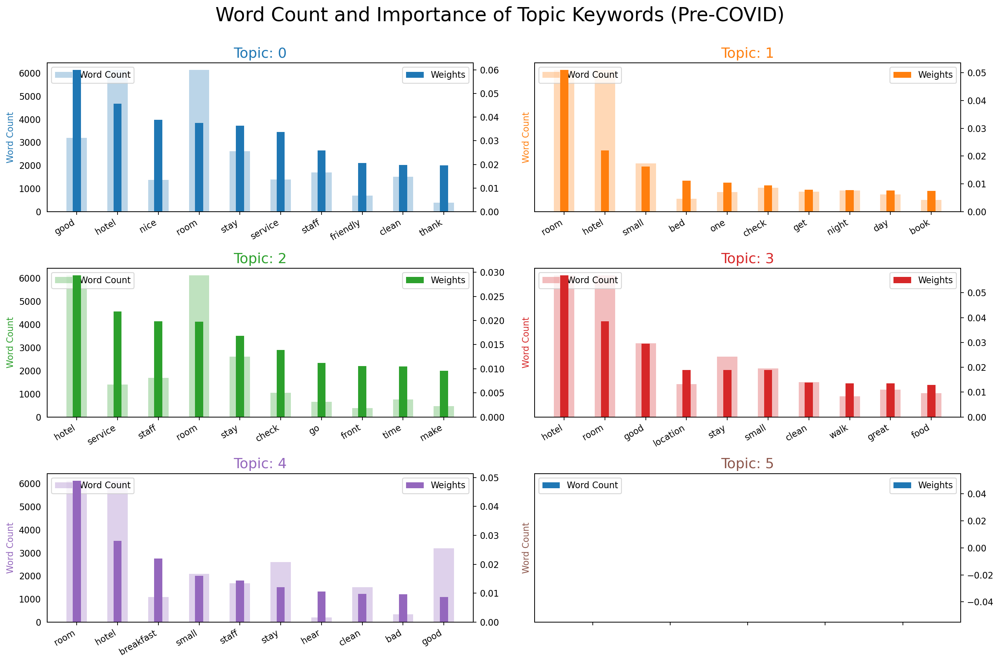

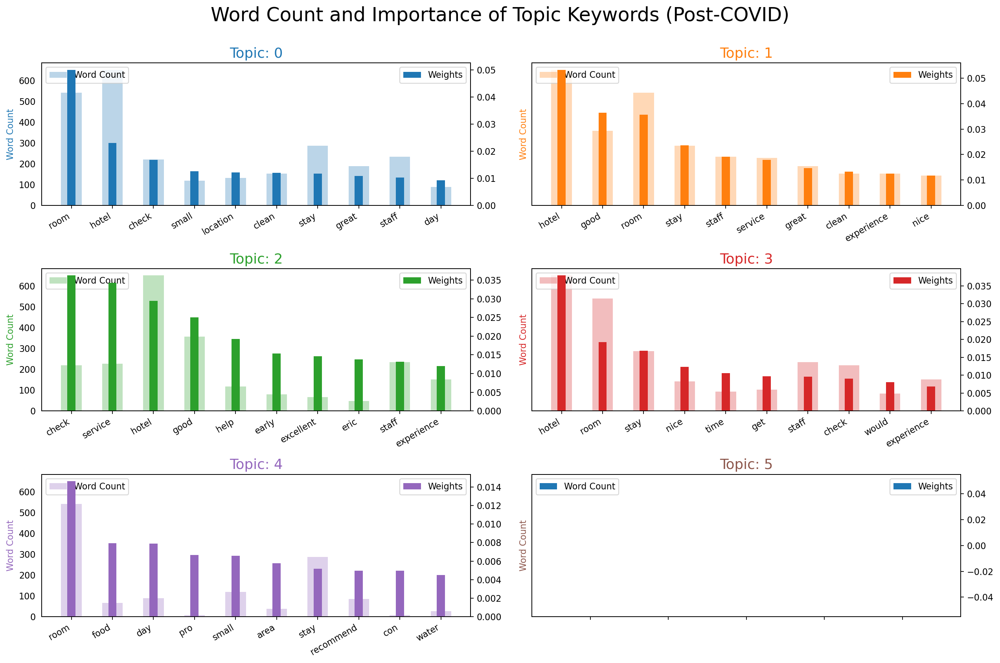

In [288]:
# Create a function to generate the plot
def plot_word_count_importance(topics, data_flat, title):
    out = []
    for i, topic in topics:
        for word, weight in topic:
            out.append([word, i, weight, data_flat.count(word)])

    df_plot = pd.DataFrame(out, columns=['word', 'topic_id', 'importance', 'word_count'])

    # Plot Word Count and Weights of Topic Keywords
    fig, axes = plt.subplots(3, 2, figsize=(16, 10), sharey=True, dpi=160)
    cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]

    for i, ax in enumerate(axes.flatten()):
        ax.bar(x='word', height='word_count', data=df_plot.loc[df_plot.topic_id == i, :], color=cols[i], width=0.5, alpha=0.3, label='Word Count')
        ax_twin = ax.twinx()
        ax_twin.bar(x='word', height='importance', data=df_plot.loc[df_plot.topic_id == i, :], color=cols[i], width=0.2, label='Weights')
        ax.set_ylabel('Word Count', color=cols[i])
        ax.set_title('Topic: ' + str(i), color=cols[i], fontsize=16)
        ax.tick_params(axis='y', left=False)
        ax.set_xticklabels(df_plot.loc[df_plot.topic_id == i, 'word'], rotation=30, horizontalalignment='right')
        ax.legend(loc='upper left')
        ax_twin.legend(loc='upper right')

    fig.tight_layout(w_pad=2)
    fig.suptitle(title, fontsize=22, y=1.05)
    plt.show()

# For Pre-COVID
plot_word_count_importance(topics_pre, data_flat_pre, 'Word Count and Importance of Topic Keywords (Pre-COVID)')

# For Post-COVID
plot_word_count_importance(topics_post, data_flat_post, 'Word Count and Importance of Topic Keywords (Post-COVID)')

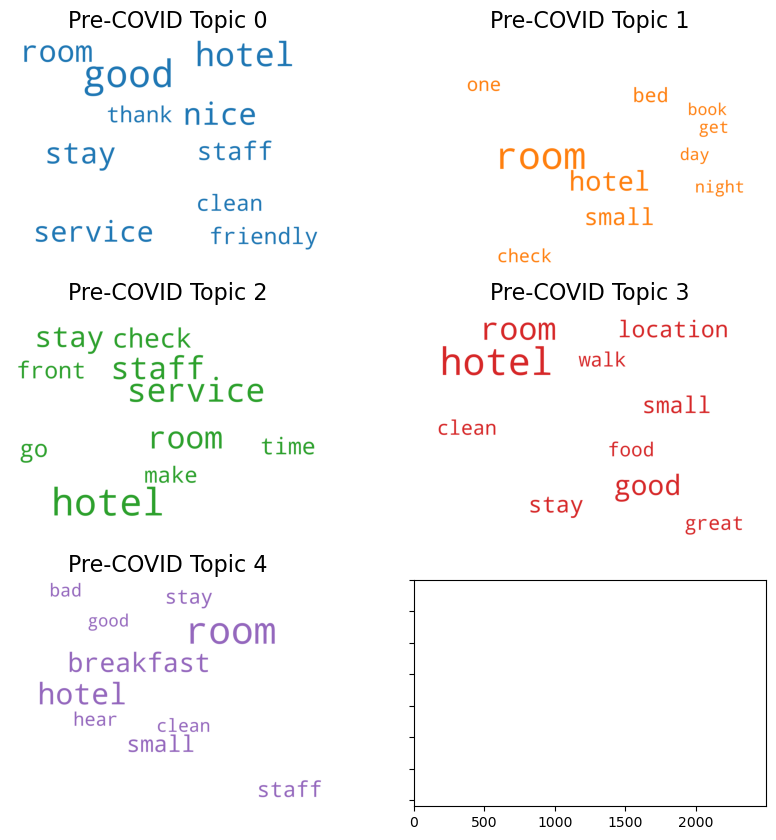

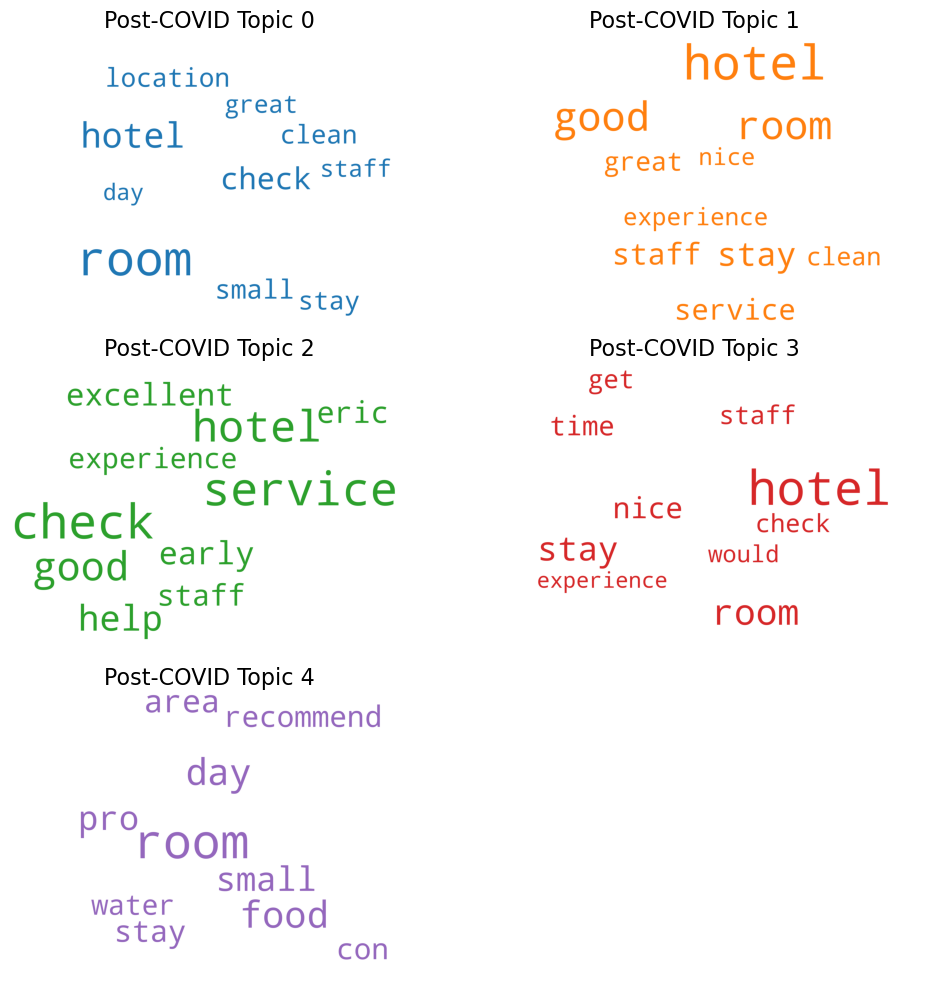

In [289]:
from wordcloud import WordCloud
import matplotlib.colors as mcolors

cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]

# Create WordClouds for each topic in the pre-COVID dataset
clouds_pre = []

for i in range(5):
    cloud = WordCloud(background_color='white',
                      width=2500,
                      height=1800,
                      max_words=10,
                      colormap='tab10',
                      color_func=lambda *args, **kwargs: cols[i],
                      prefer_horizontal=1.0)
    topic_words = dict(pre_ldamodel.show_topic(i, topn=10))
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    clouds_pre.append(cloud)

# Create WordClouds for each topic in the post-COVID dataset
clouds_post = []

for i in range(5):
    cloud = WordCloud(background_color='white',
                      width=2500,
                      height=1800,
                      max_words=10,
                      colormap='tab10',
                      color_func=lambda *args, **kwargs: cols[i],
                      prefer_horizontal=1.0)
    topic_words = dict(post_ldamodel.show_topic(i, topn=10))
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    clouds_post.append(cloud)

# Plot the WordClouds for pre-COVID topics
fig_pre, axes_pre = plt.subplots(3, 2, figsize=(10, 10), sharex=True, sharey=True)

for i, ax in enumerate(axes_pre.flatten()):
    fig_pre.add_subplot(ax)
    if i < len(clouds_pre):
        plt.gca().imshow(clouds_pre[i])
        plt.gca().set_title('Pre-COVID Topic ' + str(i), fontdict=dict(size=16))
        plt.gca().axis('off')

# Plot the WordClouds for post-COVID topics
fig_post, axes_post = plt.subplots(3, 2, figsize=(10, 10), sharex=True, sharey=True)

for i, ax in enumerate(axes_post.flatten()):
    fig_post.add_subplot(ax)
    if i < len(clouds_post):
        plt.gca().imshow(clouds_post[i])
        plt.gca().set_title('Post-COVID Topic ' + str(i), fontdict=dict(size=16))
        plt.gca().axis('off')

plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()

In [290]:
vis = pyLDAvis.gensim.prepare(topic_model=pre_ldamodel, corpus=pre_corpus, dictionary=pre_dict)
pyLDAvis.enable_notebook()
pyLDAvis.display(vis)

In [291]:
vis = pyLDAvis.gensim.prepare(topic_model=post_ldamodel, corpus=post_corpus, dictionary=post_dict)
pyLDAvis.enable_notebook()
pyLDAvis.display(vis)

### Bigrams

In [292]:
clean_precovid = df_precovid['cleaned_review'].apply(preprocess)
clean_precovid = clean_precovid.apply(lambda x: ' '.join(x))
clean_postcovid = df_postcovid['cleaned_review'].apply(preprocess)
clean_postcovid = clean_postcovid.apply(lambda x: ' '.join(x))

In [293]:
from nltk import ngrams
bigrams_precovid = []
bigrams_postcovid = []

for d in clean_precovid:
    tokens = word_tokenize(d)
    bigrams_precovid.append(["_".join(w) for w in ngrams(tokens, 2)])

for e in clean_postcovid:
    tokens = word_tokenize(e)
    bigrams_postcovid.append(['_'.join(w) for w in ngrams(tokens, 2)])


In [294]:
##Generate LDA dictionary and corpus
pre_dict = corpora.Dictionary(bigrams_precovid)
pre_corpus = [pre_dict.doc2bow(text) for text in bigrams_precovid]
## Check optimal number of topics
lda = gensim.models.ldamodel.LdaModel
pre_ldamodel = lda(pre_corpus, num_topics=5, id2word=pre_dict, passes=15)

In [295]:
##Generate LDA dictionary and corpus
post_dict = corpora.Dictionary(bigrams_postcovid)
post_corpus = [post_dict.doc2bow(text) for text in bigrams_postcovid]
## Check optimal number of topics
lda = gensim.models.ldamodel.LdaModel
post_ldamodel = lda(post_corpus, num_topics=5, id2word=post_dict, passes=15)

In [296]:
# For Pre-COVID
topics_pre = pre_ldamodel.show_topics(formatted=False)
data_flat_pre = [word for word_list in bigrams_precovid for word in word_list]

# For Post-COVID
topics_post = post_ldamodel.show_topics(formatted=False)
data_flat_post = [word for word_list in bigrams_postcovid for word in word_list]

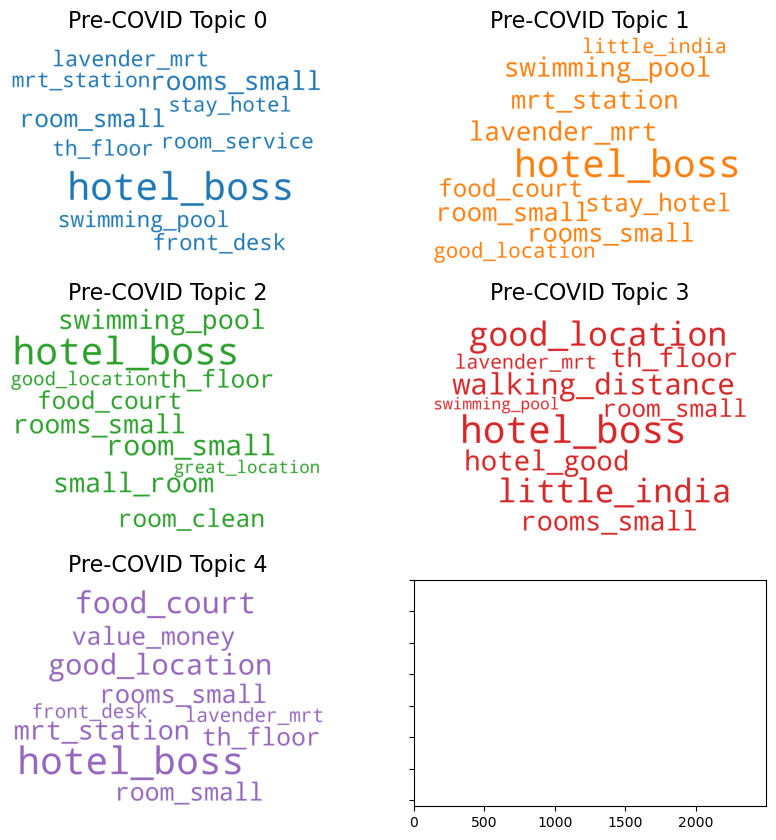

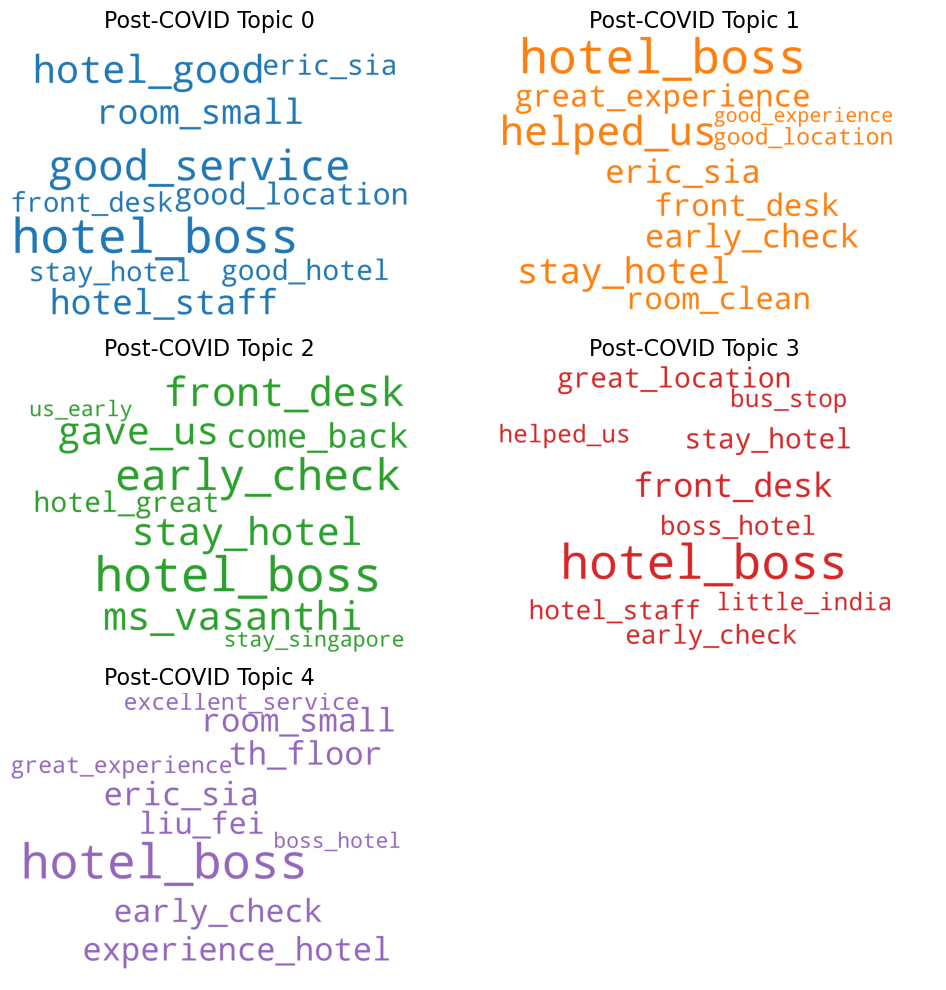

In [297]:
from wordcloud import WordCloud
import matplotlib.colors as mcolors

cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]

# Create WordClouds for each topic in the pre-COVID dataset
clouds_pre = []

for i in range(5):
    cloud = WordCloud(background_color='white',
                      width=2500,
                      height=1800,
                      max_words=10,
                      colormap='tab10',
                      color_func=lambda *args, **kwargs: cols[i],
                      prefer_horizontal=1.0)
    topic_words = dict(pre_ldamodel.show_topic(i, topn=10))
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    clouds_pre.append(cloud)

# Create WordClouds for each topic in the post-COVID dataset
clouds_post = []

for i in range(5):
    cloud = WordCloud(background_color='white',
                      width=2500,
                      height=1800,
                      max_words=10,
                      colormap='tab10',
                      color_func=lambda *args, **kwargs: cols[i],
                      prefer_horizontal=1.0)
    topic_words = dict(post_ldamodel.show_topic(i, topn=10))
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    clouds_post.append(cloud)

# Plot the WordClouds for pre-COVID topics
fig_pre, axes_pre = plt.subplots(3, 2, figsize=(10, 10), sharex=True, sharey=True)

for i, ax in enumerate(axes_pre.flatten()):
    fig_pre.add_subplot(ax)
    if i < len(clouds_pre):
        plt.gca().imshow(clouds_pre[i])
        plt.gca().set_title('Pre-COVID Topic ' + str(i), fontdict=dict(size=16))
        plt.gca().axis('off')

# Plot the WordClouds for post-COVID topics
fig_post, axes_post = plt.subplots(3, 2, figsize=(10, 10), sharex=True, sharey=True)

for i, ax in enumerate(axes_post.flatten()):
    fig_post.add_subplot(ax)
    if i < len(clouds_post):
        plt.gca().imshow(clouds_post[i])
        plt.gca().set_title('Post-COVID Topic ' + str(i), fontdict=dict(size=16))
        plt.gca().axis('off')

plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()

In [298]:
vis = pyLDAvis.gensim.prepare(topic_model=pre_ldamodel, corpus=pre_corpus, dictionary=pre_dict)
pyLDAvis.enable_notebook()
pyLDAvis.display(vis)

In [299]:
vis = pyLDAvis.gensim.prepare(topic_model=post_ldamodel, corpus=post_corpus, dictionary=post_dict)
pyLDAvis.enable_notebook()
pyLDAvis.display(vis)

## Hotel G

In [300]:
df = pd.read_csv('../data/processed/cleaned_hotel-G.csv')
df.head()

,Unnamed: 0,traveller_username,review_title,review_text,travel_type,traveller_country_origin,traveller_total_contributions,traveller_total_helpful_contributions,rating,valid_rating,label,cleaned_review,combined_review,date,covid,year,stem_review,lem_review
0,0,Wander38368066856,The best service I have ever experienced,Forgot my phone in the taxi upon arrival. Shaw...,Trip type: Travelled with friends,NaN,1,NaN,5.0,True,Positive,best service ever experienced forgot phone tax...,The best service I have ever experienced Forgo...,2023-09-01,PostCovid,2023,best servic ever experienc forgot phone taxi u...,good service ever experience forgot phone taxi...
1,1,Relax20093101942,Nice stay,I had a pleasant 4 days 3 nights stay here. Up...,Trip type: Travelled with family,NaN,1,NaN,5.0,True,Positive,nice stay pleasant days nights stay upon check...,Nice stay I had a pleasant 4 days 3 nights sta...,2023-09-01,PostCovid,2023,nice stay pleasant day night stay upon check c...,nice stay pleasant day night stay upon check c...
2,2,Ann,Good experience in Hotel G,Hotel location is very convenient to travel ar...,Trip type: Travelled with family,NaN,2,NaN,5.0,True,Positive,good experience hotel g hotel location conveni...,Good experience in Hotel G Hotel location is ...,2023-09-01,PostCovid,2023,good experi hotel g hotel locat conveni travel...,good experience hotel g hotel location conveni...
3,3,Donna l,Superb location of location & great service fr...,Hotel location are few steps to the bus stop a...,Trip type: Travelled with friends,NaN,1,NaN,5.0,True,Positive,superb location location great service hotel s...,Superb location of location & great service fr...,2023-09-01,PostCovid,2023,superb locat locat great servic hotel staff ho...,superb location location great service hotel s...
4,4,Phongsuda S,Nice staff and quick solve prpblem,After Check-in I found my room it same have th...,Trip type: Travelled on business,"Bangkok, Thailand",3,NaN,5.0,True,Positive,nice staff quick solve prpblem check found roo...,Nice staff and quick solve prpblem After Check...,2023-09-01,PostCovid,2023,nice staff quick solv prpblem check found room...,nice staff quick solve prpblem check find room...


In [301]:
##filter for year >= 2015
df_filtered = df[df['year'] >= 2015]

## Stemmed

In [302]:
df_filtered['stem_review'] = df_filtered['stem_review'].apply(remove_stopwords)
df_filtered['stem_review'] = df_filtered['stem_review'].apply(remove_non_english_words, valid_words=english_words)
df_filtered['tokens'] = df_filtered['stem_review'].apply(preprocess)

In [303]:
df_precovid = df_filtered[df_filtered['covid'] == 'PreCovid']
df_precovid.head()

,Unnamed: 0,traveller_username,review_title,review_text,travel_type,traveller_country_origin,traveller_total_contributions,traveller_total_helpful_contributions,rating,valid_rating,label,cleaned_review,combined_review,date,covid,year,stem_review,lem_review,tokens
736,739,Chelcie R,Quick city break,I stayed at Hotel G for 2 nights for a bit of ...,NaN,NaN,5,10.0,4.0,True,Positive,quick city break stayed hotel g nights bit tou...,Quick city break I stayed at Hotel G for 2 nig...,2019-09-01,PreCovid,2019,quick break stay hotel g night bit tourism wor...,quick city break stay hotel g night bit touris...,"[quick, break, stay, hotel, g, night, bit, tou..."
744,747,Filareti V,Bad!😠,"Very small room, without ventilation in the ba...",NaN,"Edessa, Greece",47,50.0,2.0,True,Negative,bad small room without ventilation bathroom re...,"Bad!😠 Very small room, without ventilation in ...",2020-01-01,PreCovid,2020,bad small room without ventil bathroom stay da...,bad small room without ventilation bathroom re...,"[bad, small, room, without, ventil, bathroom, ..."
745,748,Ms_Shopper,Good for value,Our family of 3 adults stayed at Hotel G for 2...,NaN,"Markham, Canada",15,30.0,4.0,True,Positive,good value family adults stayed hotel g nights...,Good for value Our family of 3 adults stayed a...,2019-12-01,PreCovid,2019,good adult stay hotel g night book room intere...,good value family adult stay hotel g night boo...,"[good, adult, stay, hotel, g, night, book, roo..."
746,749,Keith,A small animal would have problems moving abou...,Look elsewhere. Staff friendly. Thats about it...,NaN,NaN,1,3.0,1.0,True,Negative,small animal would problems moving rooms small...,A small animal would have problems moving abou...,2020-01-01,PreCovid,2020,small would problem move room small inde look ...,small animal would problem move room small ind...,"[small, would, problem, move, room, small, ind..."
747,750,DaniBudapest,Nitty-gritty issues spoiling our stay,Have been travelling for 20 hours with 3 kids ...,NaN,"Budapest, Hungary",21,48.0,2.0,True,Negative,nitty gritty issues spoiling stay travelling h...,Nitty-gritty issues spoiling our stay Have bee...,2020-01-01,PreCovid,2020,spoil stay travel hour prior hotel selfish wan...,nitty gritty issue spoil stay travel hour kid ...,"[spoil, stay, travel, hour, prior, hotel, self..."


In [304]:
df_postcovid = df_filtered[df_filtered['covid'] == 'PostCovid']
df_postcovid.head()

,Unnamed: 0,traveller_username,review_title,review_text,travel_type,traveller_country_origin,traveller_total_contributions,traveller_total_helpful_contributions,rating,valid_rating,label,cleaned_review,combined_review,date,covid,year,stem_review,lem_review,tokens
0,0,Wander38368066856,The best service I have ever experienced,Forgot my phone in the taxi upon arrival. Shaw...,Trip type: Travelled with friends,NaN,1,NaN,5.0,True,Positive,best service ever experienced forgot phone tax...,The best service I have ever experienced Forgo...,2023-09-01,PostCovid,2023,best ever forgot phone taxi upon made sure bac...,good service ever experience forgot phone taxi...,"[best, ever, forgot, phone, taxi, upon, made, ..."
1,1,Relax20093101942,Nice stay,I had a pleasant 4 days 3 nights stay here. Up...,Trip type: Travelled with family,NaN,1,NaN,5.0,True,Positive,nice stay pleasant days nights stay upon check...,Nice stay I had a pleasant 4 days 3 nights sta...,2023-09-01,PostCovid,2023,nice stay pleasant day night stay upon check c...,nice stay pleasant day night stay upon check c...,"[nice, stay, pleasant, day, night, stay, upon,..."
2,2,Ann,Good experience in Hotel G,Hotel location is very convenient to travel ar...,Trip type: Travelled with family,NaN,2,NaN,5.0,True,Positive,good experience hotel g hotel location conveni...,Good experience in Hotel G Hotel location is ...,2023-09-01,PostCovid,2023,good hotel g hotel travel around area train st...,good experience hotel g hotel location conveni...,"[good, hotel, g, hotel, travel, around, area, ..."
3,3,Donna l,Superb location of location & great service fr...,Hotel location are few steps to the bus stop a...,Trip type: Travelled with friends,NaN,1,NaN,5.0,True,Positive,superb location location great service hotel s...,Superb location of location & great service fr...,2023-09-01,PostCovid,2023,superb great hotel staff hotel step bu stop st...,superb location location great service hotel s...,"[superb, great, hotel, staff, hotel, step, bu,..."
4,4,Phongsuda S,Nice staff and quick solve prpblem,After Check-in I found my room it same have th...,Trip type: Travelled on business,"Bangkok, Thailand",3,NaN,5.0,True,Positive,nice staff quick solve prpblem check found roo...,Nice staff and quick solve prpblem After Check...,2023-09-01,PostCovid,2023,nice staff quick check found room leak water t...,nice staff quick solve prpblem check find room...,"[nice, staff, quick, check, found, room, leak,..."


### Unigrams

In [305]:
##Generate LDA dictionary and corpus
pre_dict = corpora.Dictionary(df_precovid['tokens'])
pre_corpus = [pre_dict.doc2bow(text) for text in df_precovid['tokens']]

In [306]:
## Use 5 topics as baseline
lda = gensim.models.ldamodel.LdaModel
pre_ldamodel = lda(pre_corpus, num_topics=5, id2word=pre_dict, passes=15)

In [307]:
##Generate LDA dictionary and corpus
post_dict = corpora.Dictionary(df_postcovid['tokens'])
post_corpus = [post_dict.doc2bow(text) for text in df_postcovid['tokens']]

In [308]:
## Check optimal number of topics
lda = gensim.models.ldamodel.LdaModel
post_ldamodel = lda(post_corpus, num_topics=5, id2word=post_dict, passes=15)

In [309]:
# For Pre-COVID
topics_pre = pre_ldamodel.show_topics(formatted=False)
data_flat_pre = [word for word_list in df_precovid['tokens'] for word in word_list]

# For Post-COVID
topics_post = post_ldamodel.show_topics(formatted=False)
data_flat_post = [word for word_list in df_postcovid['tokens'] for word in word_list]

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_18508\2307337869.py:21: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(df_plot.loc[df_plot.topic_id == i, 'word'], rotation=30, horizontalalignment='right')


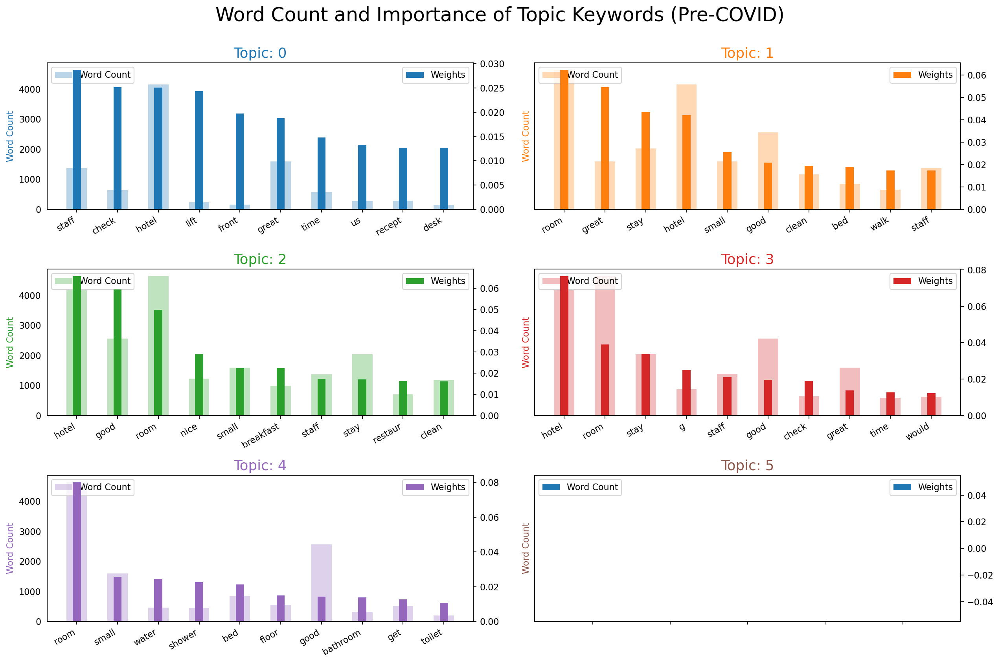

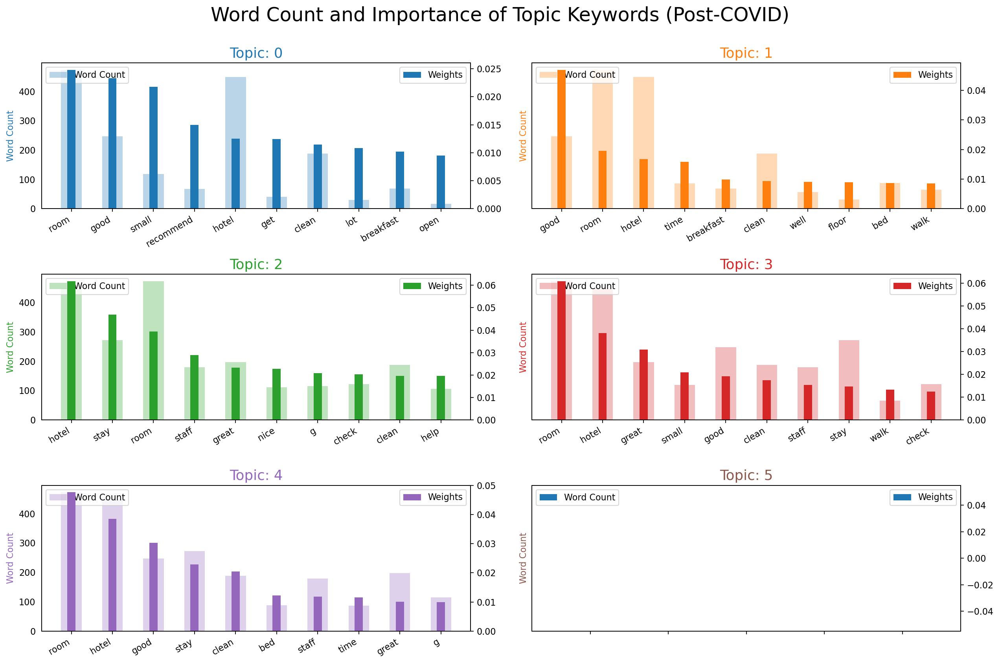

In [310]:
# Create a function to generate the plot
def plot_word_count_importance(topics, data_flat, title):
    out = []
    for i, topic in topics:
        for word, weight in topic:
            out.append([word, i, weight, data_flat.count(word)])

    df_plot = pd.DataFrame(out, columns=['word', 'topic_id', 'importance', 'word_count'])

    # Plot Word Count and Weights of Topic Keywords
    fig, axes = plt.subplots(3, 2, figsize=(16, 10), sharey=True, dpi=160)
    cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]

    for i, ax in enumerate(axes.flatten()):
        ax.bar(x='word', height='word_count', data=df_plot.loc[df_plot.topic_id == i, :], color=cols[i], width=0.5, alpha=0.3, label='Word Count')
        ax_twin = ax.twinx()
        ax_twin.bar(x='word', height='importance', data=df_plot.loc[df_plot.topic_id == i, :], color=cols[i], width=0.2, label='Weights')
        ax.set_ylabel('Word Count', color=cols[i])
        ax.set_title('Topic: ' + str(i), color=cols[i], fontsize=16)
        ax.tick_params(axis='y', left=False)
        ax.set_xticklabels(df_plot.loc[df_plot.topic_id == i, 'word'], rotation=30, horizontalalignment='right')
        ax.legend(loc='upper left')
        ax_twin.legend(loc='upper right')

    fig.tight_layout(w_pad=2)
    fig.suptitle(title, fontsize=22, y=1.05)
    plt.show()

# For Pre-COVID
plot_word_count_importance(topics_pre, data_flat_pre, 'Word Count and Importance of Topic Keywords (Pre-COVID)')

# For Post-COVID
plot_word_count_importance(topics_post, data_flat_post, 'Word Count and Importance of Topic Keywords (Post-COVID)')

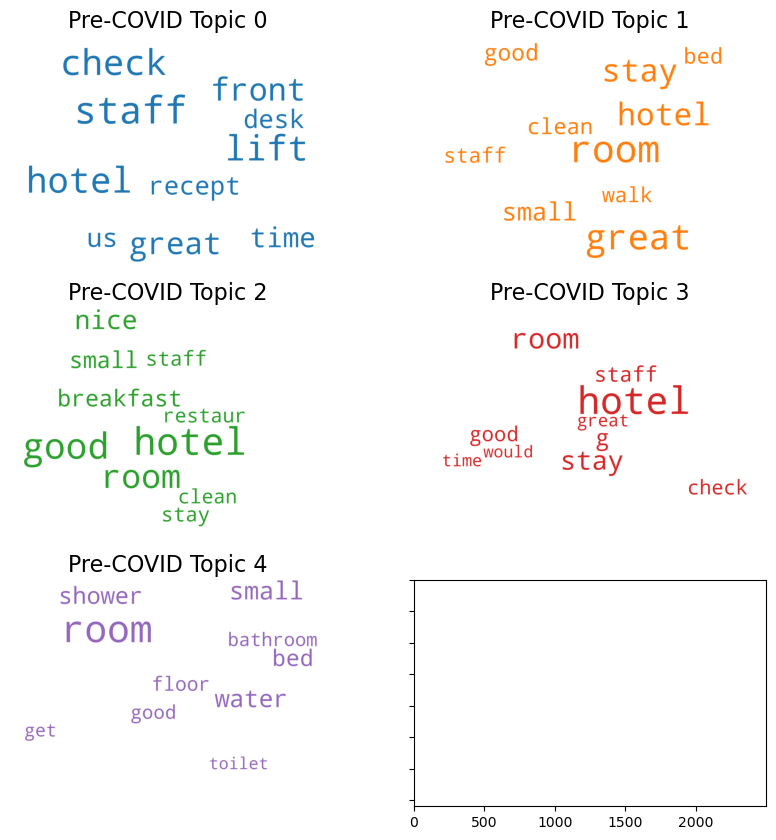

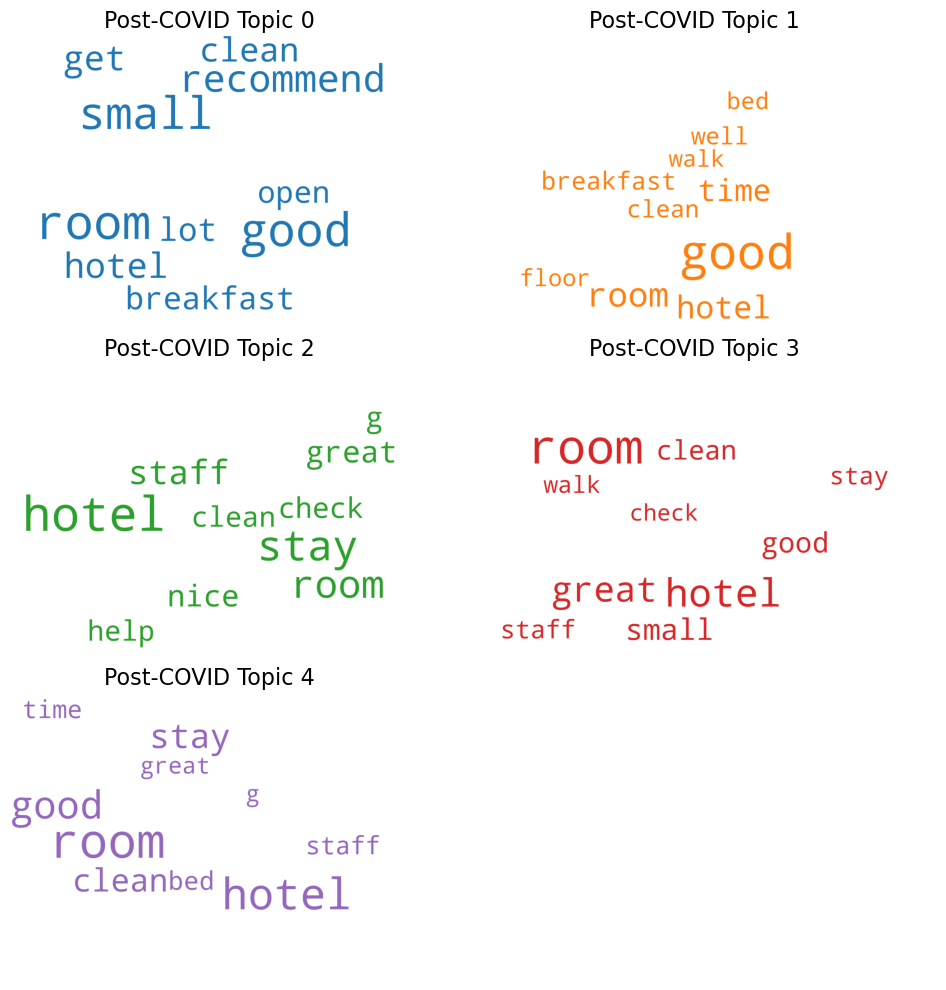

In [311]:
from wordcloud import WordCloud
import matplotlib.colors as mcolors

cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]

# Create WordClouds for each topic in the pre-COVID dataset
clouds_pre = []

for i in range(5):
    cloud = WordCloud(background_color='white',
                      width=2500,
                      height=1800,
                      max_words=10,
                      colormap='tab10',
                      color_func=lambda *args, **kwargs: cols[i],
                      prefer_horizontal=1.0)
    topic_words = dict(pre_ldamodel.show_topic(i, topn=10))
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    clouds_pre.append(cloud)

# Create WordClouds for each topic in the post-COVID dataset
clouds_post = []

for i in range(5):
    cloud = WordCloud(background_color='white',
                      width=2500,
                      height=1800,
                      max_words=10,
                      colormap='tab10',
                      color_func=lambda *args, **kwargs: cols[i],
                      prefer_horizontal=1.0)
    topic_words = dict(post_ldamodel.show_topic(i, topn=10))
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    clouds_post.append(cloud)

# Plot the WordClouds for pre-COVID topics
fig_pre, axes_pre = plt.subplots(3, 2, figsize=(10, 10), sharex=True, sharey=True)

for i, ax in enumerate(axes_pre.flatten()):
    fig_pre.add_subplot(ax)
    if i < len(clouds_pre):
        plt.gca().imshow(clouds_pre[i])
        plt.gca().set_title('Pre-COVID Topic ' + str(i), fontdict=dict(size=16))
        plt.gca().axis('off')

# Plot the WordClouds for post-COVID topics
fig_post, axes_post = plt.subplots(3, 2, figsize=(10, 10), sharex=True, sharey=True)

for i, ax in enumerate(axes_post.flatten()):
    fig_post.add_subplot(ax)
    if i < len(clouds_post):
        plt.gca().imshow(clouds_post[i])
        plt.gca().set_title('Post-COVID Topic ' + str(i), fontdict=dict(size=16))
        plt.gca().axis('off')

plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()

In [312]:
vis = pyLDAvis.gensim.prepare(topic_model=pre_ldamodel, corpus=pre_corpus, dictionary=pre_dict)
pyLDAvis.enable_notebook()
pyLDAvis.display(vis)

In [313]:
vis = pyLDAvis.gensim.prepare(topic_model=post_ldamodel, corpus=post_corpus, dictionary=post_dict)
pyLDAvis.enable_notebook()
pyLDAvis.display(vis)

### Bigrams

In [314]:
clean_precovid = df_precovid['cleaned_review'].apply(preprocess)
clean_precovid = clean_precovid.apply(lambda x: ' '.join(x))
clean_postcovid = df_postcovid['cleaned_review'].apply(preprocess)
clean_postcovid = clean_postcovid.apply(lambda x: ' '.join(x))

In [315]:
from nltk import ngrams
bigrams_precovid = []
bigrams_postcovid = []

for d in clean_precovid:
    tokens = word_tokenize(d)
    bigrams_precovid.append(["_".join(w) for w in ngrams(tokens, 2)])

for e in clean_postcovid:
    tokens = word_tokenize(e)
    bigrams_postcovid.append(['_'.join(w) for w in ngrams(tokens, 2)])


In [316]:
##Generate LDA dictionary and corpus
pre_dict = corpora.Dictionary(bigrams_precovid)
pre_corpus = [pre_dict.doc2bow(text) for text in bigrams_precovid]
## Check optimal number of topics
lda = gensim.models.ldamodel.LdaModel
pre_ldamodel = lda(pre_corpus, num_topics=5, id2word=pre_dict, passes=15)

In [317]:
##Generate LDA dictionary and corpus
post_dict = corpora.Dictionary(bigrams_postcovid)
post_corpus = [post_dict.doc2bow(text) for text in bigrams_postcovid]
## Check optimal number of topics
lda = gensim.models.ldamodel.LdaModel
post_ldamodel = lda(post_corpus, num_topics=5, id2word=post_dict, passes=15)

In [318]:
# For Pre-COVID
topics_pre = pre_ldamodel.show_topics(formatted=False)
data_flat_pre = [word for word_list in bigrams_precovid for word in word_list]

# For Post-COVID
topics_post = post_ldamodel.show_topics(formatted=False)
data_flat_post = [word for word_list in bigrams_postcovid for word in word_list]

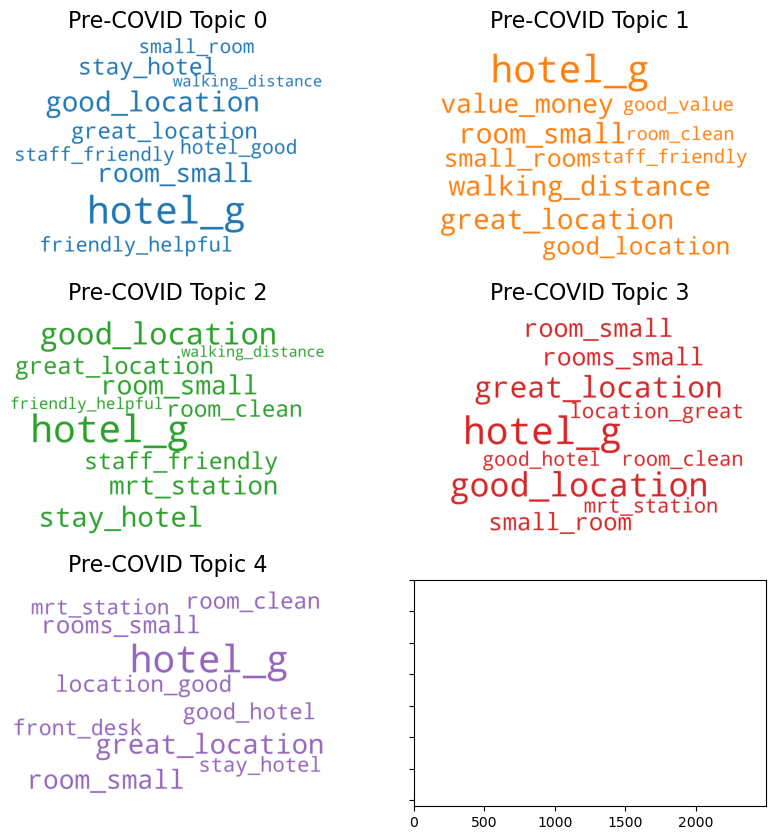

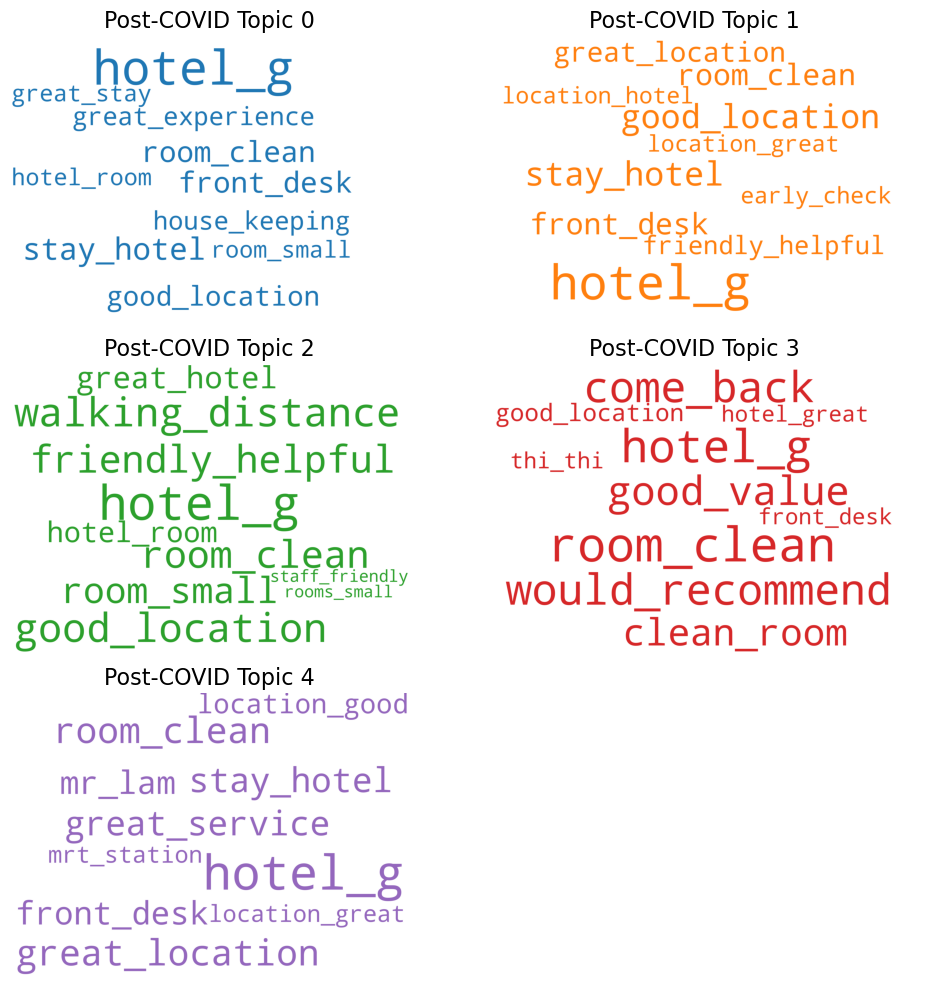

In [319]:
from wordcloud import WordCloud
import matplotlib.colors as mcolors

cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]

# Create WordClouds for each topic in the pre-COVID dataset
clouds_pre = []

for i in range(5):
    cloud = WordCloud(background_color='white',
                      width=2500,
                      height=1800,
                      max_words=10,
                      colormap='tab10',
                      color_func=lambda *args, **kwargs: cols[i],
                      prefer_horizontal=1.0)
    topic_words = dict(pre_ldamodel.show_topic(i, topn=10))
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    clouds_pre.append(cloud)

# Create WordClouds for each topic in the post-COVID dataset
clouds_post = []

for i in range(5):
    cloud = WordCloud(background_color='white',
                      width=2500,
                      height=1800,
                      max_words=10,
                      colormap='tab10',
                      color_func=lambda *args, **kwargs: cols[i],
                      prefer_horizontal=1.0)
    topic_words = dict(post_ldamodel.show_topic(i, topn=10))
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    clouds_post.append(cloud)

# Plot the WordClouds for pre-COVID topics
fig_pre, axes_pre = plt.subplots(3, 2, figsize=(10, 10), sharex=True, sharey=True)

for i, ax in enumerate(axes_pre.flatten()):
    fig_pre.add_subplot(ax)
    if i < len(clouds_pre):
        plt.gca().imshow(clouds_pre[i])
        plt.gca().set_title('Pre-COVID Topic ' + str(i), fontdict=dict(size=16))
        plt.gca().axis('off')

# Plot the WordClouds for post-COVID topics
fig_post, axes_post = plt.subplots(3, 2, figsize=(10, 10), sharex=True, sharey=True)

for i, ax in enumerate(axes_post.flatten()):
    fig_post.add_subplot(ax)
    if i < len(clouds_post):
        plt.gca().imshow(clouds_post[i])
        plt.gca().set_title('Post-COVID Topic ' + str(i), fontdict=dict(size=16))
        plt.gca().axis('off')

plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()

In [320]:
vis = pyLDAvis.gensim.prepare(topic_model=pre_ldamodel, corpus=pre_corpus, dictionary=pre_dict)
pyLDAvis.enable_notebook()
pyLDAvis.display(vis)

In [321]:
vis = pyLDAvis.gensim.prepare(topic_model=post_ldamodel, corpus=post_corpus, dictionary=post_dict)
pyLDAvis.enable_notebook()
pyLDAvis.display(vis)

## Lemmatized

In [322]:
df_filtered['lem_review'] = df_filtered['lem_review'].apply(remove_stopwords)
df_filtered['lem_review'] = df_filtered['lem_review'].apply(remove_non_english_words, valid_words=english_words)
df_filtered['tokens'] = df_filtered['lem_review'].apply(preprocess)

In [323]:
df_precovid = df_filtered[df_filtered['covid'] == 'PreCovid']
df_precovid.head()

,Unnamed: 0,traveller_username,review_title,review_text,travel_type,traveller_country_origin,traveller_total_contributions,traveller_total_helpful_contributions,rating,valid_rating,label,cleaned_review,combined_review,date,covid,year,stem_review,lem_review,tokens
736,739,Chelcie R,Quick city break,I stayed at Hotel G for 2 nights for a bit of ...,NaN,NaN,5,10.0,4.0,True,Positive,quick city break stayed hotel g nights bit tou...,Quick city break I stayed at Hotel G for 2 nig...,2019-09-01,PreCovid,2019,quick break stay hotel g night bit tourism wor...,quick city break stay hotel g night bit touris...,"[quick, city, break, stay, hotel, g, night, bi..."
744,747,Filareti V,Bad!😠,"Very small room, without ventilation in the ba...",NaN,"Edessa, Greece",47,50.0,2.0,True,Negative,bad small room without ventilation bathroom re...,"Bad!😠 Very small room, without ventilation in ...",2020-01-01,PreCovid,2020,bad small room without ventil bathroom stay da...,bad small room without ventilation bathroom re...,"[bad, small, room, without, ventilation, bathr..."
745,748,Ms_Shopper,Good for value,Our family of 3 adults stayed at Hotel G for 2...,NaN,"Markham, Canada",15,30.0,4.0,True,Positive,good value family adults stayed hotel g nights...,Good for value Our family of 3 adults stayed a...,2019-12-01,PreCovid,2019,good adult stay hotel g night book room intere...,good value family adult stay hotel g night boo...,"[good, value, family, adult, stay, hotel, g, n..."
746,749,Keith,A small animal would have problems moving abou...,Look elsewhere. Staff friendly. Thats about it...,NaN,NaN,1,3.0,1.0,True,Negative,small animal would problems moving rooms small...,A small animal would have problems moving abou...,2020-01-01,PreCovid,2020,small would problem move room small inde look ...,small animal would problem move room small ind...,"[small, animal, would, problem, move, room, sm..."
747,750,DaniBudapest,Nitty-gritty issues spoiling our stay,Have been travelling for 20 hours with 3 kids ...,NaN,"Budapest, Hungary",21,48.0,2.0,True,Negative,nitty gritty issues spoiling stay travelling h...,Nitty-gritty issues spoiling our stay Have bee...,2020-01-01,PreCovid,2020,spoil stay travel hour prior hotel selfish wan...,nitty gritty issue spoil stay travel hour prio...,"[nitty, gritty, issue, spoil, stay, travel, ho..."


In [324]:
df_postcovid = df_filtered[df_filtered['covid'] == 'PostCovid']
df_postcovid.head()

,Unnamed: 0,traveller_username,review_title,review_text,travel_type,traveller_country_origin,traveller_total_contributions,traveller_total_helpful_contributions,rating,valid_rating,label,cleaned_review,combined_review,date,covid,year,stem_review,lem_review,tokens
0,0,Wander38368066856,The best service I have ever experienced,Forgot my phone in the taxi upon arrival. Shaw...,Trip type: Travelled with friends,NaN,1,NaN,5.0,True,Positive,best service ever experienced forgot phone tax...,The best service I have ever experienced Forgo...,2023-09-01,PostCovid,2023,best ever forgot phone taxi upon made sure bac...,good service ever experience forgot phone taxi...,"[good, service, ever, experience, forgot, phon..."
1,1,Relax20093101942,Nice stay,I had a pleasant 4 days 3 nights stay here. Up...,Trip type: Travelled with family,NaN,1,NaN,5.0,True,Positive,nice stay pleasant days nights stay upon check...,Nice stay I had a pleasant 4 days 3 nights sta...,2023-09-01,PostCovid,2023,nice stay pleasant day night stay upon check c...,nice stay pleasant day night stay upon check c...,"[nice, stay, pleasant, day, night, stay, upon,..."
2,2,Ann,Good experience in Hotel G,Hotel location is very convenient to travel ar...,Trip type: Travelled with family,NaN,2,NaN,5.0,True,Positive,good experience hotel g hotel location conveni...,Good experience in Hotel G Hotel location is ...,2023-09-01,PostCovid,2023,good hotel g hotel travel around area train st...,good experience hotel g hotel location conveni...,"[good, experience, hotel, g, hotel, location, ..."
3,3,Donna l,Superb location of location & great service fr...,Hotel location are few steps to the bus stop a...,Trip type: Travelled with friends,NaN,1,NaN,5.0,True,Positive,superb location location great service hotel s...,Superb location of location & great service fr...,2023-09-01,PostCovid,2023,superb great hotel staff hotel step bu stop st...,superb location location great service hotel s...,"[superb, location, location, great, service, h..."
4,4,Phongsuda S,Nice staff and quick solve prpblem,After Check-in I found my room it same have th...,Trip type: Travelled on business,"Bangkok, Thailand",3,NaN,5.0,True,Positive,nice staff quick solve prpblem check found roo...,Nice staff and quick solve prpblem After Check...,2023-09-01,PostCovid,2023,nice staff quick check found room leak water t...,nice staff quick solve check find room leak wa...,"[nice, staff, quick, solve, check, find, room,..."


### Unigrams

In [325]:
##Generate LDA dictionary and corpus
pre_dict = corpora.Dictionary(df_precovid['tokens'])
pre_corpus = [pre_dict.doc2bow(text) for text in df_precovid['tokens']]

In [326]:
## Use 5 topics as baseline
lda = gensim.models.ldamodel.LdaModel
pre_ldamodel = lda(pre_corpus, num_topics=5, id2word=pre_dict, passes=15)

In [327]:
##Generate LDA dictionary and corpus
post_dict = corpora.Dictionary(df_postcovid['tokens'])
post_corpus = [post_dict.doc2bow(text) for text in df_postcovid['tokens']]

In [328]:
## Check optimal number of topics
lda = gensim.models.ldamodel.LdaModel
post_ldamodel = lda(post_corpus, num_topics=5, id2word=post_dict, passes=15)

In [329]:
# For Pre-COVID
topics_pre = pre_ldamodel.show_topics(formatted=False)
data_flat_pre = [word for word_list in df_precovid['tokens'] for word in word_list]

# For Post-COVID
topics_post = post_ldamodel.show_topics(formatted=False)
data_flat_post = [word for word_list in df_postcovid['tokens'] for word in word_list]

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_18508\2307337869.py:21: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(df_plot.loc[df_plot.topic_id == i, 'word'], rotation=30, horizontalalignment='right')


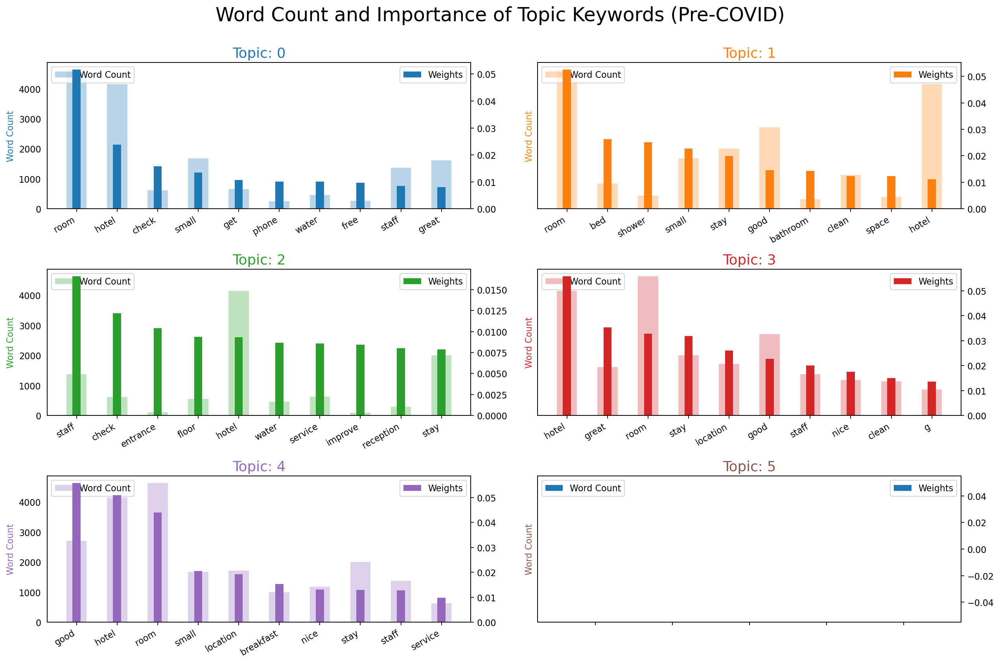

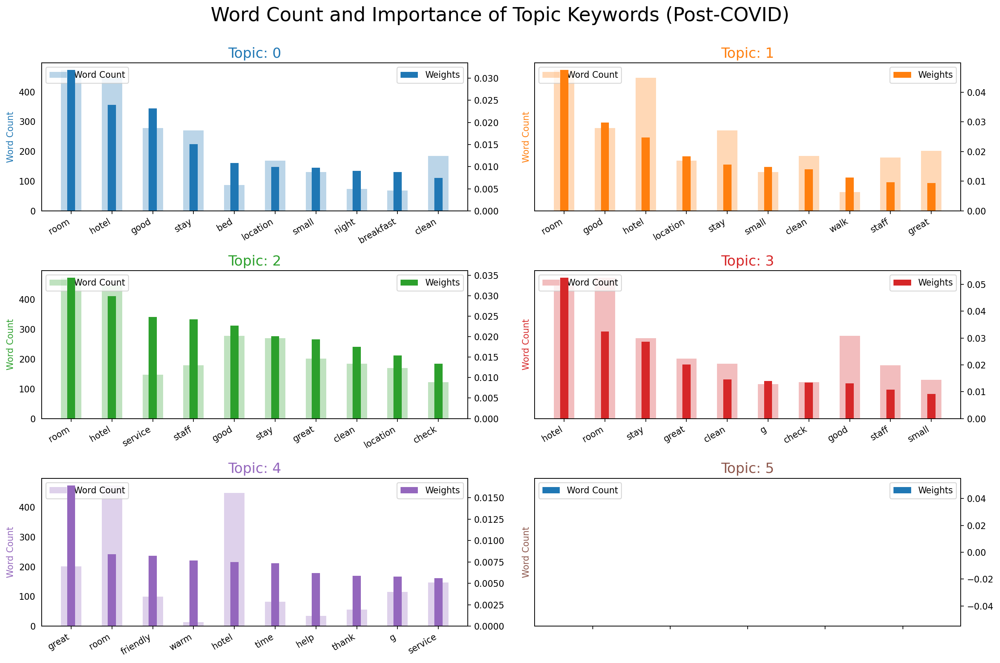

In [330]:
# Create a function to generate the plot
def plot_word_count_importance(topics, data_flat, title):
    out = []
    for i, topic in topics:
        for word, weight in topic:
            out.append([word, i, weight, data_flat.count(word)])

    df_plot = pd.DataFrame(out, columns=['word', 'topic_id', 'importance', 'word_count'])

    # Plot Word Count and Weights of Topic Keywords
    fig, axes = plt.subplots(3, 2, figsize=(16, 10), sharey=True, dpi=160)
    cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]

    for i, ax in enumerate(axes.flatten()):
        ax.bar(x='word', height='word_count', data=df_plot.loc[df_plot.topic_id == i, :], color=cols[i], width=0.5, alpha=0.3, label='Word Count')
        ax_twin = ax.twinx()
        ax_twin.bar(x='word', height='importance', data=df_plot.loc[df_plot.topic_id == i, :], color=cols[i], width=0.2, label='Weights')
        ax.set_ylabel('Word Count', color=cols[i])
        ax.set_title('Topic: ' + str(i), color=cols[i], fontsize=16)
        ax.tick_params(axis='y', left=False)
        ax.set_xticklabels(df_plot.loc[df_plot.topic_id == i, 'word'], rotation=30, horizontalalignment='right')
        ax.legend(loc='upper left')
        ax_twin.legend(loc='upper right')

    fig.tight_layout(w_pad=2)
    fig.suptitle(title, fontsize=22, y=1.05)
    plt.show()

# For Pre-COVID
plot_word_count_importance(topics_pre, data_flat_pre, 'Word Count and Importance of Topic Keywords (Pre-COVID)')

# For Post-COVID
plot_word_count_importance(topics_post, data_flat_post, 'Word Count and Importance of Topic Keywords (Post-COVID)')

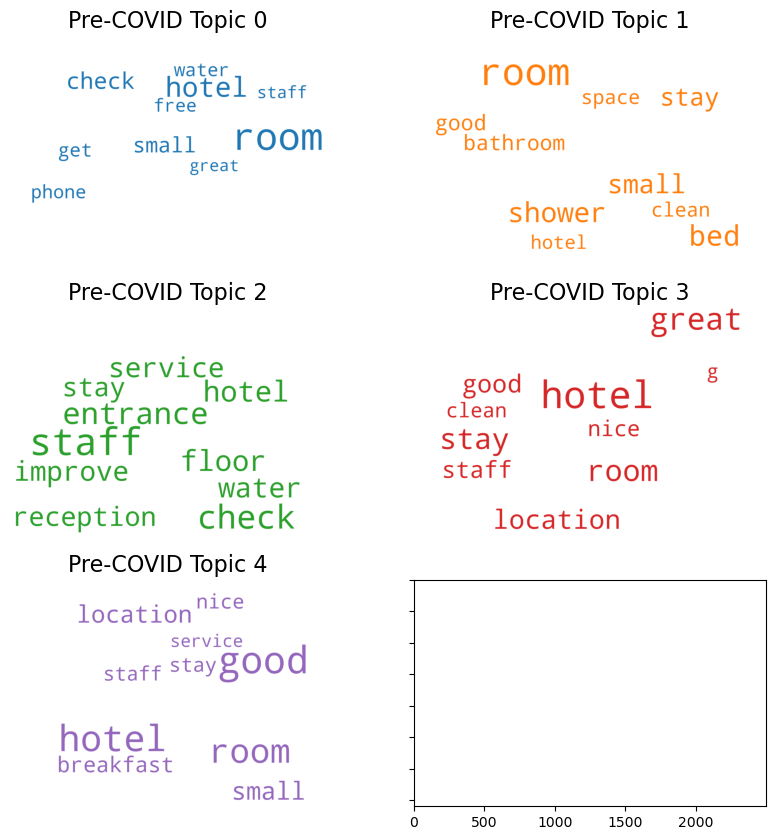

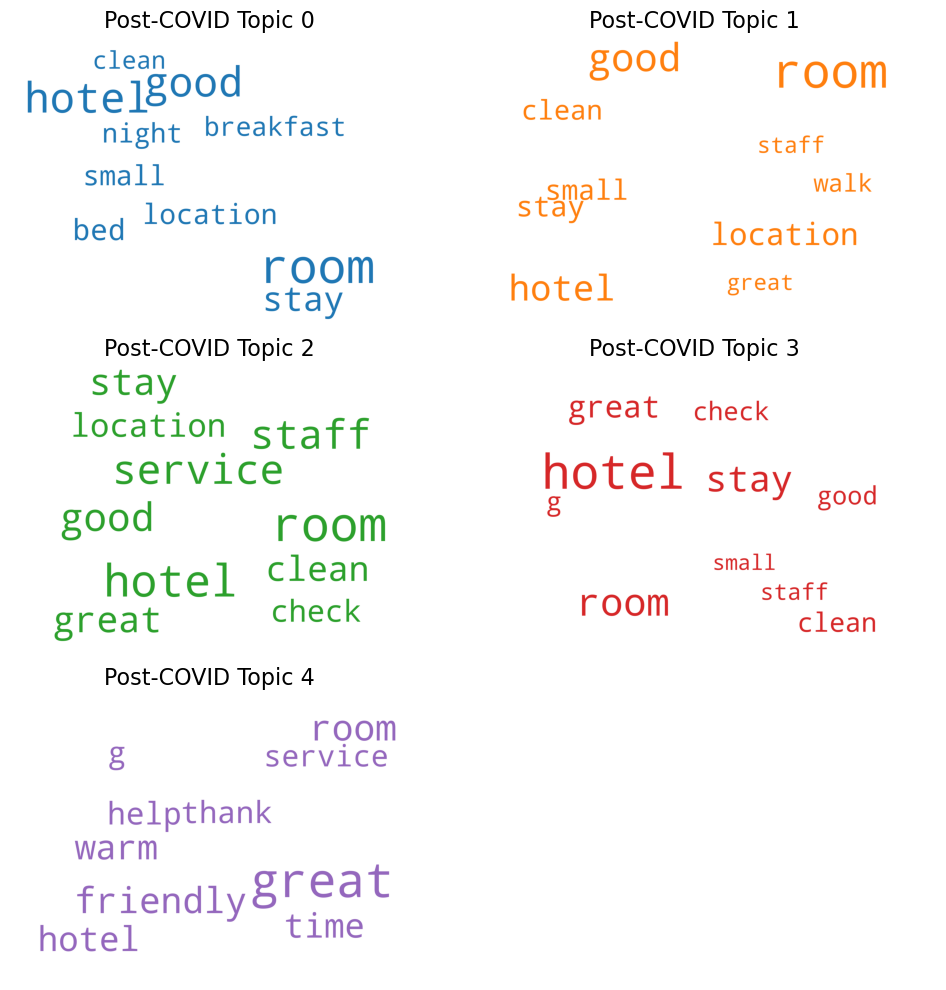

In [331]:
from wordcloud import WordCloud
import matplotlib.colors as mcolors

cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]

# Create WordClouds for each topic in the pre-COVID dataset
clouds_pre = []

for i in range(5):
    cloud = WordCloud(background_color='white',
                      width=2500,
                      height=1800,
                      max_words=10,
                      colormap='tab10',
                      color_func=lambda *args, **kwargs: cols[i],
                      prefer_horizontal=1.0)
    topic_words = dict(pre_ldamodel.show_topic(i, topn=10))
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    clouds_pre.append(cloud)

# Create WordClouds for each topic in the post-COVID dataset
clouds_post = []

for i in range(5):
    cloud = WordCloud(background_color='white',
                      width=2500,
                      height=1800,
                      max_words=10,
                      colormap='tab10',
                      color_func=lambda *args, **kwargs: cols[i],
                      prefer_horizontal=1.0)
    topic_words = dict(post_ldamodel.show_topic(i, topn=10))
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    clouds_post.append(cloud)

# Plot the WordClouds for pre-COVID topics
fig_pre, axes_pre = plt.subplots(3, 2, figsize=(10, 10), sharex=True, sharey=True)

for i, ax in enumerate(axes_pre.flatten()):
    fig_pre.add_subplot(ax)
    if i < len(clouds_pre):
        plt.gca().imshow(clouds_pre[i])
        plt.gca().set_title('Pre-COVID Topic ' + str(i), fontdict=dict(size=16))
        plt.gca().axis('off')

# Plot the WordClouds for post-COVID topics
fig_post, axes_post = plt.subplots(3, 2, figsize=(10, 10), sharex=True, sharey=True)

for i, ax in enumerate(axes_post.flatten()):
    fig_post.add_subplot(ax)
    if i < len(clouds_post):
        plt.gca().imshow(clouds_post[i])
        plt.gca().set_title('Post-COVID Topic ' + str(i), fontdict=dict(size=16))
        plt.gca().axis('off')

plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()

In [332]:
vis = pyLDAvis.gensim.prepare(topic_model=pre_ldamodel, corpus=pre_corpus, dictionary=pre_dict)
pyLDAvis.enable_notebook()
pyLDAvis.display(vis)

In [333]:
vis = pyLDAvis.gensim.prepare(topic_model=post_ldamodel, corpus=post_corpus, dictionary=post_dict)
pyLDAvis.enable_notebook()
pyLDAvis.display(vis)

### Bigrams

In [334]:
clean_precovid = df_precovid['cleaned_review'].apply(preprocess)
clean_precovid = clean_precovid.apply(lambda x: ' '.join(x))
clean_postcovid = df_postcovid['cleaned_review'].apply(preprocess)
clean_postcovid = clean_postcovid.apply(lambda x: ' '.join(x))

In [335]:
from nltk import ngrams
bigrams_precovid = []
bigrams_postcovid = []

for d in clean_precovid:
    tokens = word_tokenize(d)
    bigrams_precovid.append(["_".join(w) for w in ngrams(tokens, 2)])

for e in clean_postcovid:
    tokens = word_tokenize(e)
    bigrams_postcovid.append(['_'.join(w) for w in ngrams(tokens, 2)])


In [336]:
##Generate LDA dictionary and corpus
pre_dict = corpora.Dictionary(bigrams_precovid)
pre_corpus = [pre_dict.doc2bow(text) for text in bigrams_precovid]
## Check optimal number of topics
lda = gensim.models.ldamodel.LdaModel
pre_ldamodel = lda(pre_corpus, num_topics=5, id2word=pre_dict, passes=15)

In [337]:
##Generate LDA dictionary and corpus
post_dict = corpora.Dictionary(bigrams_postcovid)
post_corpus = [post_dict.doc2bow(text) for text in bigrams_postcovid]
## Check optimal number of topics
lda = gensim.models.ldamodel.LdaModel
post_ldamodel = lda(post_corpus, num_topics=5, id2word=post_dict, passes=15)

In [338]:
# For Pre-COVID
topics_pre = pre_ldamodel.show_topics(formatted=False)
data_flat_pre = [word for word_list in bigrams_precovid for word in word_list]

# For Post-COVID
topics_post = post_ldamodel.show_topics(formatted=False)
data_flat_post = [word for word_list in bigrams_postcovid for word in word_list]

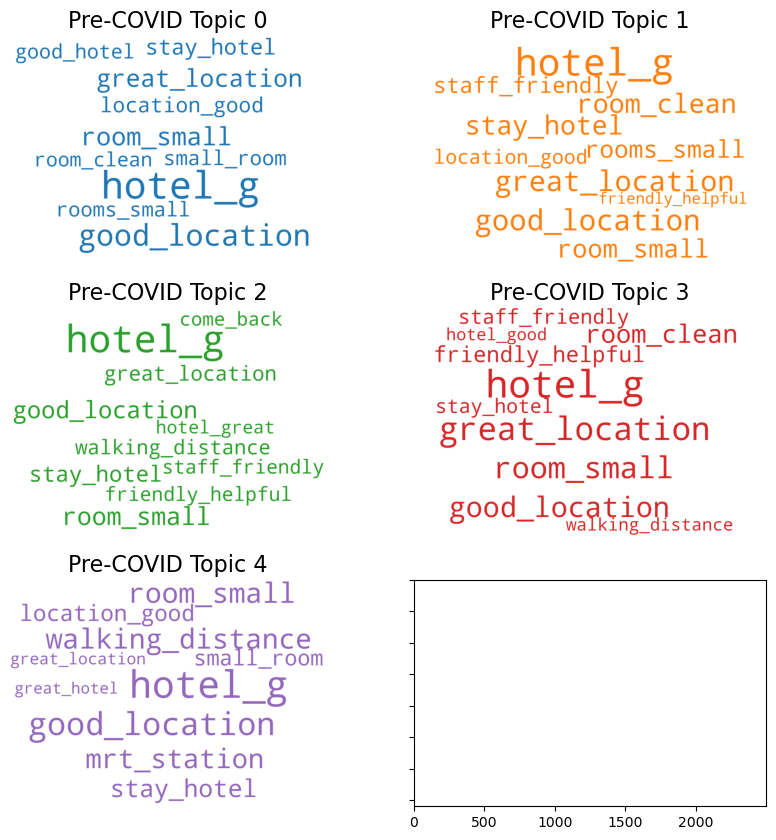

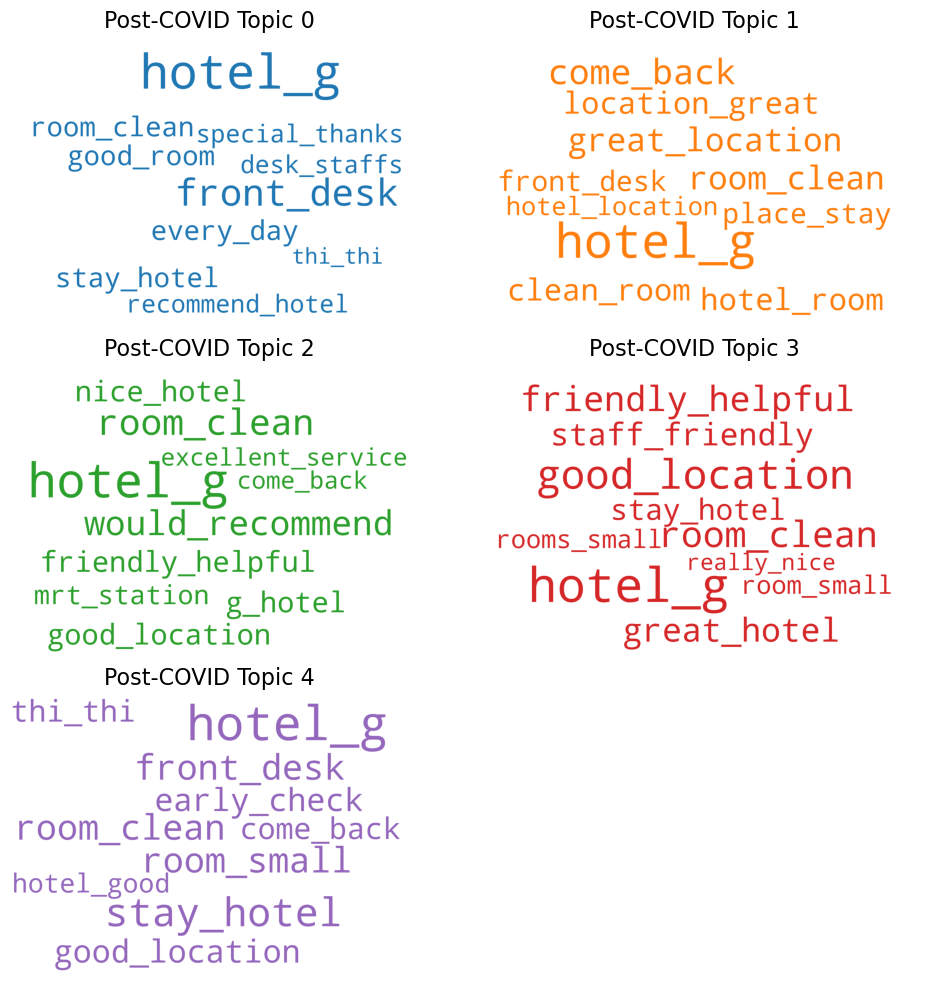

In [339]:
from wordcloud import WordCloud
import matplotlib.colors as mcolors

cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]

# Create WordClouds for each topic in the pre-COVID dataset
clouds_pre = []

for i in range(5):
    cloud = WordCloud(background_color='white',
                      width=2500,
                      height=1800,
                      max_words=10,
                      colormap='tab10',
                      color_func=lambda *args, **kwargs: cols[i],
                      prefer_horizontal=1.0)
    topic_words = dict(pre_ldamodel.show_topic(i, topn=10))
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    clouds_pre.append(cloud)

# Create WordClouds for each topic in the post-COVID dataset
clouds_post = []

for i in range(5):
    cloud = WordCloud(background_color='white',
                      width=2500,
                      height=1800,
                      max_words=10,
                      colormap='tab10',
                      color_func=lambda *args, **kwargs: cols[i],
                      prefer_horizontal=1.0)
    topic_words = dict(post_ldamodel.show_topic(i, topn=10))
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    clouds_post.append(cloud)

# Plot the WordClouds for pre-COVID topics
fig_pre, axes_pre = plt.subplots(3, 2, figsize=(10, 10), sharex=True, sharey=True)

for i, ax in enumerate(axes_pre.flatten()):
    fig_pre.add_subplot(ax)
    if i < len(clouds_pre):
        plt.gca().imshow(clouds_pre[i])
        plt.gca().set_title('Pre-COVID Topic ' + str(i), fontdict=dict(size=16))
        plt.gca().axis('off')

# Plot the WordClouds for post-COVID topics
fig_post, axes_post = plt.subplots(3, 2, figsize=(10, 10), sharex=True, sharey=True)

for i, ax in enumerate(axes_post.flatten()):
    fig_post.add_subplot(ax)
    if i < len(clouds_post):
        plt.gca().imshow(clouds_post[i])
        plt.gca().set_title('Post-COVID Topic ' + str(i), fontdict=dict(size=16))
        plt.gca().axis('off')

plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()

In [340]:
vis = pyLDAvis.gensim.prepare(topic_model=pre_ldamodel, corpus=pre_corpus, dictionary=pre_dict)
pyLDAvis.enable_notebook()
pyLDAvis.display(vis)

In [341]:
vis = pyLDAvis.gensim.prepare(topic_model=post_ldamodel, corpus=post_corpus, dictionary=post_dict)
pyLDAvis.enable_notebook()
pyLDAvis.display(vis)

## Village Hotel Albert Court

In [342]:
df = pd.read_csv('../data/processed/cleaned_village-hotel-albert-court-by-far-east-hospitality.csv')
df.head()

,Unnamed: 0,traveller_username,review_title,review_text,travel_type,traveller_country_origin,traveller_total_contributions,traveller_total_helpful_contributions,rating,valid_rating,label,cleaned_review,combined_review,date,covid,year,stem_review,lem_review
0,0,gpark,Disappointed stay,Came here 'cos of good reviews but now i reall...,NaN,Singapore,1.0,NaN,1.0,True,Negative,disappointed stay came cos good reviews really...,Disappointed stay Came here 'cos of good revie...,2023-09-01,PostCovid,2023,disappoint stay came co good review realli won...,disappoint stay come cos good review really wo...
1,1,Footprints489688,"Village Hotel, Singapore","hotel address is Albert Road, but Albert Road ...",NaN,NaN,1.0,NaN,3.0,True,Neutral,village hotel singapore hotel address albert r...,"Village Hotel, Singapore hotel address is Albe...",2023-08-01,PostCovid,2023,villag hotel singapor hotel address albert roa...,village hotel singapore hotel address albert r...
2,2,Himanshu,Value for Money,"Prompt Check In, special mention and thanks to...",NaN,"Noida, India",1.0,NaN,4.0,True,Positive,value money prompt check special mention thank...,"Value for Money Prompt Check In, special menti...",2023-09-01,PostCovid,2023,valu money prompt check special mention thank ...,value money prompt check special mention thank...
3,3,Kenny H,Worth the price,The hotel is well located and offers great val...,NaN,NaN,1.0,NaN,5.0,True,Positive,worth price hotel well located offers great va...,Worth the price The hotel is well located and ...,2023-07-01,PostCovid,2023,worth price hotel well locat offer great valu ...,worth price hotel well locate offer great valu...
4,4,Sara Wong T,"Value for money, great front of desk staff",We had a good stay at Village Hotel. The room ...,NaN,"London, Malaysia",7.0,1.0,4.0,True,Positive,value money great front desk staff good stay v...,"Value for money, great front of desk staff We ...",2023-08-01,PostCovid,2023,valu money great front desk staff good stay vi...,value money great front desk staff good stay v...


In [343]:
##filter for year >= 2015
df_filtered = df[df['year'] >= 2015]

## Stemmed

In [344]:
df_filtered['stem_review'] = df_filtered['stem_review'].apply(remove_stopwords)
df_filtered['stem_review'] = df_filtered['stem_review'].apply(remove_non_english_words, valid_words=english_words)
df_filtered['tokens'] = df_filtered['stem_review'].apply(preprocess)

In [345]:
df_precovid = df_filtered[df_filtered['covid'] == 'PreCovid']
df_precovid.head()

,Unnamed: 0,traveller_username,review_title,review_text,travel_type,traveller_country_origin,traveller_total_contributions,traveller_total_helpful_contributions,rating,valid_rating,label,cleaned_review,combined_review,date,covid,year,stem_review,lem_review,tokens
286,286,Ange L,An Excellent value for money hotel in Singapore,I had 2 stays at the Village Hotel Albert Cour...,NaN,"Auckland Central, New Zealand",25.0,37.0,4.0,True,Positive,excellent value money hotel singapore stays vi...,An Excellent value for money hotel in Singapor...,2020-01-01,PreCovid,2020,excel money hotel stay hotel court hotel great...,excellent value money hotel singapore stay vil...,"[excel, money, hotel, stay, hotel, court, hote..."
287,287,SIMONA C,Good to stay!,Well connected closed to the metro to reach th...,NaN,"Naples, Italy",28.0,30.0,3.0,True,Neutral,good stay well connected closed metro reach ma...,Good to stay! Well connected closed to the met...,2019-08-01,PreCovid,2019,good stay well connect close reach main point ...,good stay well connected closed metro reach ma...,"[good, stay, well, connect, close, reach, main..."
288,288,dinu79,"Comfortable, Value for Money, Good Location",Enjoyed my stay at this Hotel for 5 nights. ...,NaN,"Dubai, United Arab Emirates",212.0,53.0,4.0,True,Positive,comfortable value money good location enjoyed ...,"Comfortable, Value for Money, Good Location En...",2020-01-01,PreCovid,2020,comfort money good enjoy stay hotel night mone...,comfortable value money good location enjoy st...,"[comfort, money, good, enjoy, stay, hotel, nig..."
294,294,SantoshPalakkal,Good Budget Hotel,"We were in Albert court during Christmas 2019,...",NaN,"Mumbai, India",10.0,29.0,4.0,True,Positive,good budget hotel albert court christmas nice ...,Good Budget Hotel We were in Albert court duri...,2019-12-01,PreCovid,2019,good budget hotel court nice budget hotel near...,good budget hotel albert court christmas nice ...,"[good, budget, hotel, court, nice, budget, hot..."
305,305,alanhoverd,My Stay,Great ole hotel but starting to show its age r...,NaN,NaN,1.0,2.0,4.0,True,Positive,stay great ole hotel starting show age round e...,My Stay Great ole hotel but starting to show i...,2020-01-01,PreCovid,2020,stay great hotel start show age round good sta...,stay great ole hotel start show age round edge...,"[stay, great, hotel, start, show, age, round, ..."


In [346]:
df_postcovid = df_filtered[df_filtered['covid'] == 'PostCovid']
df_postcovid.head()

,Unnamed: 0,traveller_username,review_title,review_text,travel_type,traveller_country_origin,traveller_total_contributions,traveller_total_helpful_contributions,rating,valid_rating,label,cleaned_review,combined_review,date,covid,year,stem_review,lem_review,tokens
0,0,gpark,Disappointed stay,Came here 'cos of good reviews but now i reall...,NaN,Singapore,1.0,NaN,1.0,True,Negative,disappointed stay came cos good reviews really...,Disappointed stay Came here 'cos of good revie...,2023-09-01,PostCovid,2023,disappoint stay came good review wonder good r...,disappoint stay come cos good review really wo...,"[disappoint, stay, came, good, review, wonder,..."
1,1,Footprints489688,"Village Hotel, Singapore","hotel address is Albert Road, but Albert Road ...",NaN,NaN,1.0,NaN,3.0,True,Neutral,village hotel singapore hotel address albert r...,"Village Hotel, Singapore hotel address is Albe...",2023-08-01,PostCovid,2023,hotel hotel address road road hotel actual hot...,village hotel singapore hotel address albert r...,"[hotel, hotel, address, road, road, hotel, act..."
2,2,Himanshu,Value for Money,"Prompt Check In, special mention and thanks to...",NaN,"Noida, India",1.0,NaN,4.0,True,Positive,value money prompt check special mention thank...,"Value for Money Prompt Check In, special menti...",2023-09-01,PostCovid,2023,money prompt check special mention thank front...,value money prompt check special mention thank...,"[money, prompt, check, special, mention, thank..."
3,3,Kenny H,Worth the price,The hotel is well located and offers great val...,NaN,NaN,1.0,NaN,5.0,True,Positive,worth price hotel well located offers great va...,Worth the price The hotel is well located and ...,2023-07-01,PostCovid,2023,worth price hotel well offer great money come ...,worth price hotel well locate offer great valu...,"[worth, price, hotel, well, offer, great, mone..."
4,4,Sara Wong T,"Value for money, great front of desk staff",We had a good stay at Village Hotel. The room ...,NaN,"London, Malaysia",7.0,1.0,4.0,True,Positive,value money great front desk staff good stay v...,"Value for money, great front of desk staff We ...",2023-08-01,PostCovid,2023,money great front desk staff good stay hotel r...,value money great front desk staff good stay v...,"[money, great, front, desk, staff, good, stay,..."


### Unigrams

In [347]:
##Generate LDA dictionary and corpus
pre_dict = corpora.Dictionary(df_precovid['tokens'])
pre_corpus = [pre_dict.doc2bow(text) for text in df_precovid['tokens']]

In [348]:
## Use 5 topics as baseline
lda = gensim.models.ldamodel.LdaModel
pre_ldamodel = lda(pre_corpus, num_topics=5, id2word=pre_dict, passes=15)

In [349]:
##Generate LDA dictionary and corpus
post_dict = corpora.Dictionary(df_postcovid['tokens'])
post_corpus = [post_dict.doc2bow(text) for text in df_postcovid['tokens']]

In [350]:
## Check optimal number of topics
lda = gensim.models.ldamodel.LdaModel
post_ldamodel = lda(post_corpus, num_topics=5, id2word=post_dict, passes=15)

In [351]:
# For Pre-COVID
topics_pre = pre_ldamodel.show_topics(formatted=False)
data_flat_pre = [word for word_list in df_precovid['tokens'] for word in word_list]

# For Post-COVID
topics_post = post_ldamodel.show_topics(formatted=False)
data_flat_post = [word for word_list in df_postcovid['tokens'] for word in word_list]

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_18508\2307337869.py:21: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(df_plot.loc[df_plot.topic_id == i, 'word'], rotation=30, horizontalalignment='right')


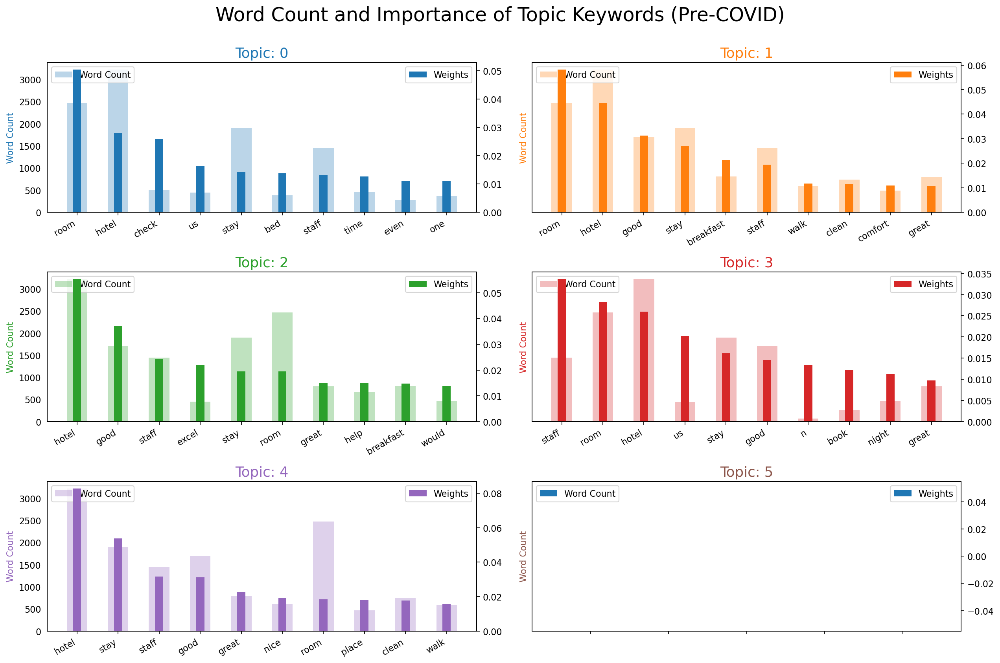

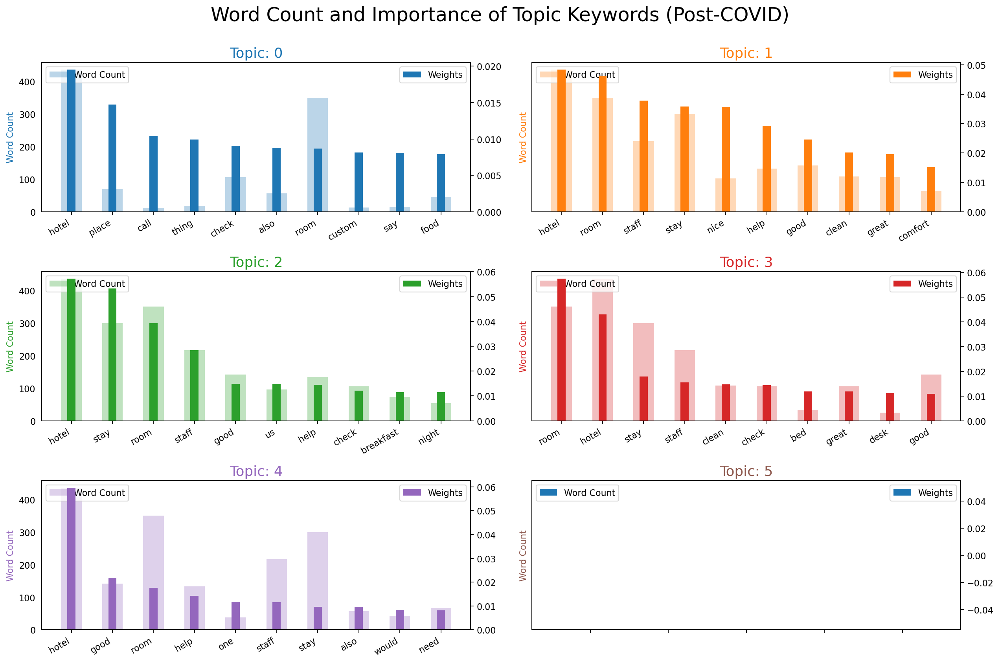

In [352]:
# Create a function to generate the plot
def plot_word_count_importance(topics, data_flat, title):
    out = []
    for i, topic in topics:
        for word, weight in topic:
            out.append([word, i, weight, data_flat.count(word)])

    df_plot = pd.DataFrame(out, columns=['word', 'topic_id', 'importance', 'word_count'])

    # Plot Word Count and Weights of Topic Keywords
    fig, axes = plt.subplots(3, 2, figsize=(16, 10), sharey=True, dpi=160)
    cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]

    for i, ax in enumerate(axes.flatten()):
        ax.bar(x='word', height='word_count', data=df_plot.loc[df_plot.topic_id == i, :], color=cols[i], width=0.5, alpha=0.3, label='Word Count')
        ax_twin = ax.twinx()
        ax_twin.bar(x='word', height='importance', data=df_plot.loc[df_plot.topic_id == i, :], color=cols[i], width=0.2, label='Weights')
        ax.set_ylabel('Word Count', color=cols[i])
        ax.set_title('Topic: ' + str(i), color=cols[i], fontsize=16)
        ax.tick_params(axis='y', left=False)
        ax.set_xticklabels(df_plot.loc[df_plot.topic_id == i, 'word'], rotation=30, horizontalalignment='right')
        ax.legend(loc='upper left')
        ax_twin.legend(loc='upper right')

    fig.tight_layout(w_pad=2)
    fig.suptitle(title, fontsize=22, y=1.05)
    plt.show()

# For Pre-COVID
plot_word_count_importance(topics_pre, data_flat_pre, 'Word Count and Importance of Topic Keywords (Pre-COVID)')

# For Post-COVID
plot_word_count_importance(topics_post, data_flat_post, 'Word Count and Importance of Topic Keywords (Post-COVID)')

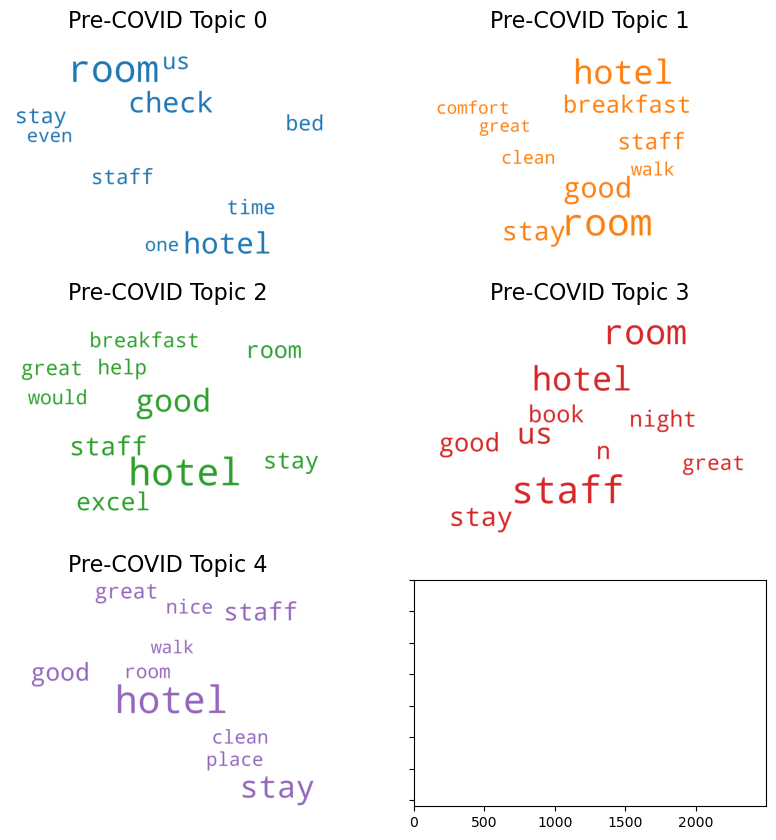

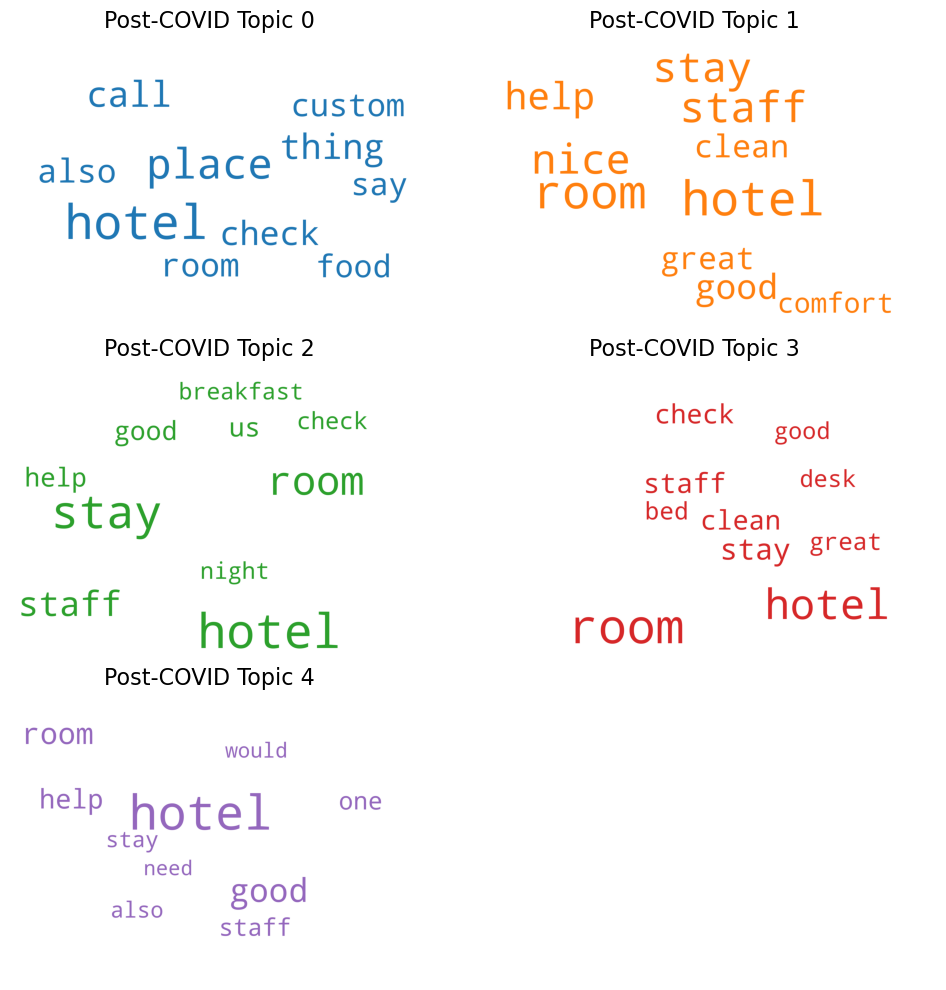

In [353]:
from wordcloud import WordCloud
import matplotlib.colors as mcolors

cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]

# Create WordClouds for each topic in the pre-COVID dataset
clouds_pre = []

for i in range(5):
    cloud = WordCloud(background_color='white',
                      width=2500,
                      height=1800,
                      max_words=10,
                      colormap='tab10',
                      color_func=lambda *args, **kwargs: cols[i],
                      prefer_horizontal=1.0)
    topic_words = dict(pre_ldamodel.show_topic(i, topn=10))
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    clouds_pre.append(cloud)

# Create WordClouds for each topic in the post-COVID dataset
clouds_post = []

for i in range(5):
    cloud = WordCloud(background_color='white',
                      width=2500,
                      height=1800,
                      max_words=10,
                      colormap='tab10',
                      color_func=lambda *args, **kwargs: cols[i],
                      prefer_horizontal=1.0)
    topic_words = dict(post_ldamodel.show_topic(i, topn=10))
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    clouds_post.append(cloud)

# Plot the WordClouds for pre-COVID topics
fig_pre, axes_pre = plt.subplots(3, 2, figsize=(10, 10), sharex=True, sharey=True)

for i, ax in enumerate(axes_pre.flatten()):
    fig_pre.add_subplot(ax)
    if i < len(clouds_pre):
        plt.gca().imshow(clouds_pre[i])
        plt.gca().set_title('Pre-COVID Topic ' + str(i), fontdict=dict(size=16))
        plt.gca().axis('off')

# Plot the WordClouds for post-COVID topics
fig_post, axes_post = plt.subplots(3, 2, figsize=(10, 10), sharex=True, sharey=True)

for i, ax in enumerate(axes_post.flatten()):
    fig_post.add_subplot(ax)
    if i < len(clouds_post):
        plt.gca().imshow(clouds_post[i])
        plt.gca().set_title('Post-COVID Topic ' + str(i), fontdict=dict(size=16))
        plt.gca().axis('off')

plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()

In [354]:
vis = pyLDAvis.gensim.prepare(topic_model=pre_ldamodel, corpus=pre_corpus, dictionary=pre_dict)
pyLDAvis.enable_notebook()
pyLDAvis.display(vis)

In [355]:
vis = pyLDAvis.gensim.prepare(topic_model=post_ldamodel, corpus=post_corpus, dictionary=post_dict)
pyLDAvis.enable_notebook()
pyLDAvis.display(vis)

### Bigrams

In [356]:
clean_precovid = df_precovid['cleaned_review'].apply(preprocess)
clean_precovid = clean_precovid.apply(lambda x: ' '.join(x))
clean_postcovid = df_postcovid['cleaned_review'].apply(preprocess)
clean_postcovid = clean_postcovid.apply(lambda x: ' '.join(x))

In [357]:
from nltk import ngrams
bigrams_precovid = []
bigrams_postcovid = []

for d in clean_precovid:
    tokens = word_tokenize(d)
    bigrams_precovid.append(["_".join(w) for w in ngrams(tokens, 2)])

for e in clean_postcovid:
    tokens = word_tokenize(e)
    bigrams_postcovid.append(['_'.join(w) for w in ngrams(tokens, 2)])


In [358]:
##Generate LDA dictionary and corpus
pre_dict = corpora.Dictionary(bigrams_precovid)
pre_corpus = [pre_dict.doc2bow(text) for text in bigrams_precovid]
## Check optimal number of topics
lda = gensim.models.ldamodel.LdaModel
pre_ldamodel = lda(pre_corpus, num_topics=5, id2word=pre_dict, passes=15)

In [359]:
##Generate LDA dictionary and corpus
post_dict = corpora.Dictionary(bigrams_postcovid)
post_corpus = [post_dict.doc2bow(text) for text in bigrams_postcovid]
## Check optimal number of topics
lda = gensim.models.ldamodel.LdaModel
post_ldamodel = lda(post_corpus, num_topics=5, id2word=post_dict, passes=15)

In [360]:
# For Pre-COVID
topics_pre = pre_ldamodel.show_topics(formatted=False)
data_flat_pre = [word for word_list in bigrams_precovid for word in word_list]

# For Post-COVID
topics_post = post_ldamodel.show_topics(formatted=False)
data_flat_post = [word for word_list in bigrams_postcovid for word in word_list]

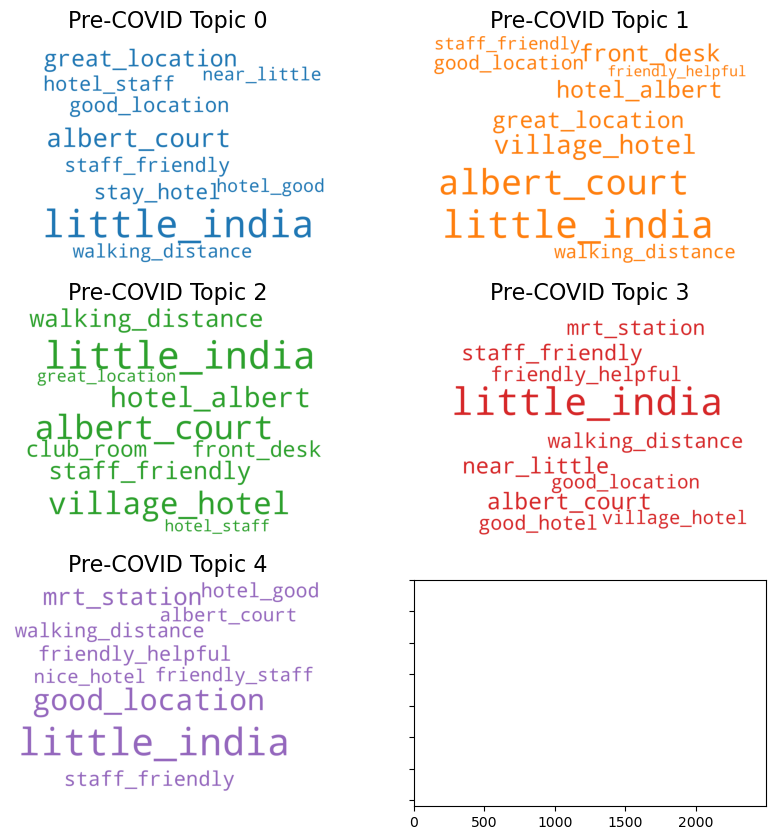

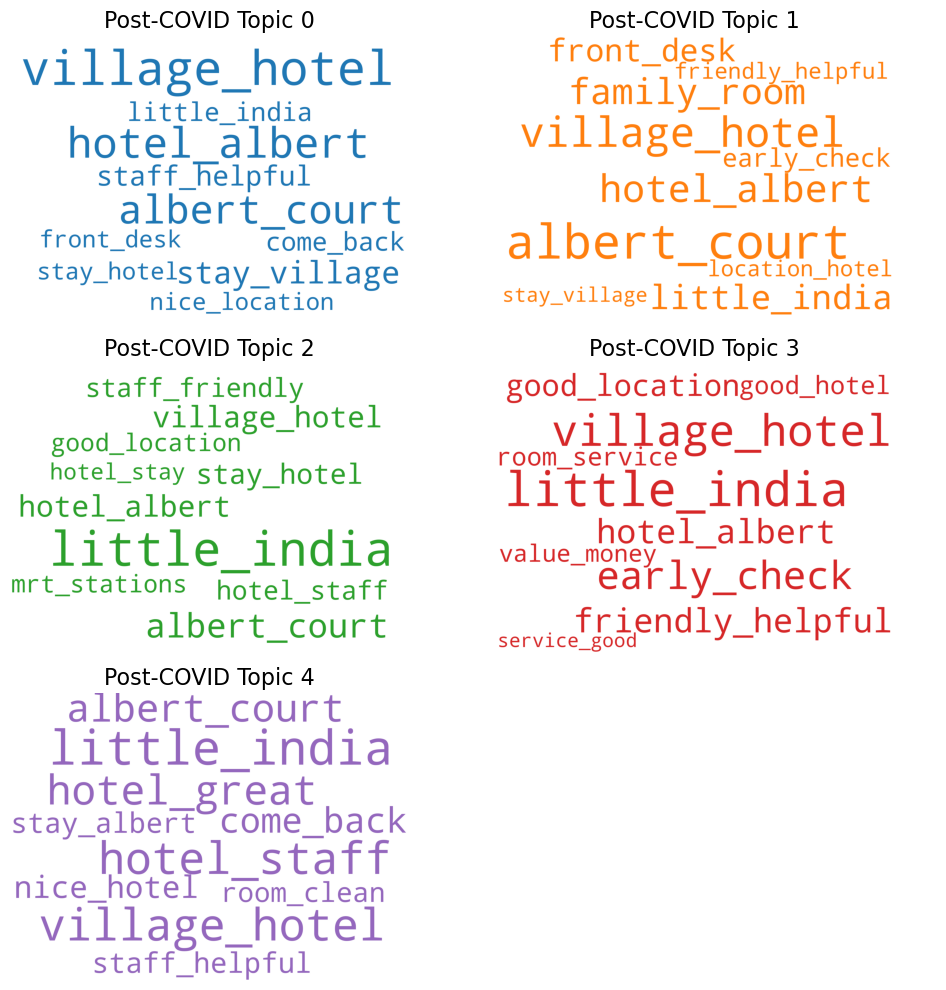

In [361]:
from wordcloud import WordCloud
import matplotlib.colors as mcolors

cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]

# Create WordClouds for each topic in the pre-COVID dataset
clouds_pre = []

for i in range(5):
    cloud = WordCloud(background_color='white',
                      width=2500,
                      height=1800,
                      max_words=10,
                      colormap='tab10',
                      color_func=lambda *args, **kwargs: cols[i],
                      prefer_horizontal=1.0)
    topic_words = dict(pre_ldamodel.show_topic(i, topn=10))
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    clouds_pre.append(cloud)

# Create WordClouds for each topic in the post-COVID dataset
clouds_post = []

for i in range(5):
    cloud = WordCloud(background_color='white',
                      width=2500,
                      height=1800,
                      max_words=10,
                      colormap='tab10',
                      color_func=lambda *args, **kwargs: cols[i],
                      prefer_horizontal=1.0)
    topic_words = dict(post_ldamodel.show_topic(i, topn=10))
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    clouds_post.append(cloud)

# Plot the WordClouds for pre-COVID topics
fig_pre, axes_pre = plt.subplots(3, 2, figsize=(10, 10), sharex=True, sharey=True)

for i, ax in enumerate(axes_pre.flatten()):
    fig_pre.add_subplot(ax)
    if i < len(clouds_pre):
        plt.gca().imshow(clouds_pre[i])
        plt.gca().set_title('Pre-COVID Topic ' + str(i), fontdict=dict(size=16))
        plt.gca().axis('off')

# Plot the WordClouds for post-COVID topics
fig_post, axes_post = plt.subplots(3, 2, figsize=(10, 10), sharex=True, sharey=True)

for i, ax in enumerate(axes_post.flatten()):
    fig_post.add_subplot(ax)
    if i < len(clouds_post):
        plt.gca().imshow(clouds_post[i])
        plt.gca().set_title('Post-COVID Topic ' + str(i), fontdict=dict(size=16))
        plt.gca().axis('off')

plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()

In [362]:
vis = pyLDAvis.gensim.prepare(topic_model=pre_ldamodel, corpus=pre_corpus, dictionary=pre_dict)
pyLDAvis.enable_notebook()
pyLDAvis.display(vis)

In [363]:
vis = pyLDAvis.gensim.prepare(topic_model=post_ldamodel, corpus=post_corpus, dictionary=post_dict)
pyLDAvis.enable_notebook()
pyLDAvis.display(vis)

## Lemmatized

In [364]:
df_filtered['lem_review'] = df_filtered['lem_review'].apply(remove_stopwords)
df_filtered['lem_review'] = df_filtered['lem_review'].apply(remove_non_english_words, valid_words=english_words)
df_filtered['tokens'] = df_filtered['lem_review'].apply(preprocess)

In [365]:
df_precovid = df_filtered[df_filtered['covid'] == 'PreCovid']
df_precovid.head()

,Unnamed: 0,traveller_username,review_title,review_text,travel_type,traveller_country_origin,traveller_total_contributions,traveller_total_helpful_contributions,rating,valid_rating,label,cleaned_review,combined_review,date,covid,year,stem_review,lem_review,tokens
286,286,Ange L,An Excellent value for money hotel in Singapore,I had 2 stays at the Village Hotel Albert Cour...,NaN,"Auckland Central, New Zealand",25.0,37.0,4.0,True,Positive,excellent value money hotel singapore stays vi...,An Excellent value for money hotel in Singapor...,2020-01-01,PreCovid,2020,excel money hotel stay hotel court hotel great...,excellent value money hotel stay hotel court h...,"[excellent, value, money, hotel, stay, hotel, ..."
287,287,SIMONA C,Good to stay!,Well connected closed to the metro to reach th...,NaN,"Naples, Italy",28.0,30.0,3.0,True,Neutral,good stay well connected closed metro reach ma...,Good to stay! Well connected closed to the met...,2019-08-01,PreCovid,2019,good stay well connect close reach main point ...,good stay well connected closed reach main poi...,"[good, stay, well, connected, closed, reach, m..."
288,288,dinu79,"Comfortable, Value for Money, Good Location",Enjoyed my stay at this Hotel for 5 nights. ...,NaN,"Dubai, United Arab Emirates",212.0,53.0,4.0,True,Positive,comfortable value money good location enjoyed ...,"Comfortable, Value for Money, Good Location En...",2020-01-01,PreCovid,2020,comfort money good enjoy stay hotel night mone...,comfortable value money good location enjoy st...,"[comfortable, value, money, good, location, en..."
294,294,SantoshPalakkal,Good Budget Hotel,"We were in Albert court during Christmas 2019,...",NaN,"Mumbai, India",10.0,29.0,4.0,True,Positive,good budget hotel albert court christmas nice ...,Good Budget Hotel We were in Albert court duri...,2019-12-01,PreCovid,2019,good budget hotel court nice budget hotel near...,good budget hotel court nice budget hotel near...,"[good, budget, hotel, court, nice, budget, hot..."
305,305,alanhoverd,My Stay,Great ole hotel but starting to show its age r...,NaN,NaN,1.0,2.0,4.0,True,Positive,stay great ole hotel starting show age round e...,My Stay Great ole hotel but starting to show i...,2020-01-01,PreCovid,2020,stay great hotel start show age round good sta...,stay great hotel start show age round edge goo...,"[stay, great, hotel, start, show, age, round, ..."


In [366]:
df_postcovid = df_filtered[df_filtered['covid'] == 'PostCovid']
df_postcovid.head()

,Unnamed: 0,traveller_username,review_title,review_text,travel_type,traveller_country_origin,traveller_total_contributions,traveller_total_helpful_contributions,rating,valid_rating,label,cleaned_review,combined_review,date,covid,year,stem_review,lem_review,tokens
0,0,gpark,Disappointed stay,Came here 'cos of good reviews but now i reall...,NaN,Singapore,1.0,NaN,1.0,True,Negative,disappointed stay came cos good reviews really...,Disappointed stay Came here 'cos of good revie...,2023-09-01,PostCovid,2023,disappoint stay came good review wonder good r...,disappoint stay come cos good review really wo...,"[disappoint, stay, come, cos, good, review, re..."
1,1,Footprints489688,"Village Hotel, Singapore","hotel address is Albert Road, but Albert Road ...",NaN,NaN,1.0,NaN,3.0,True,Neutral,village hotel singapore hotel address albert r...,"Village Hotel, Singapore hotel address is Albe...",2023-08-01,PostCovid,2023,hotel hotel address road road hotel actual hot...,hotel hotel address road road hotel actually h...,"[hotel, hotel, address, road, road, hotel, act..."
2,2,Himanshu,Value for Money,"Prompt Check In, special mention and thanks to...",NaN,"Noida, India",1.0,NaN,4.0,True,Positive,value money prompt check special mention thank...,"Value for Money Prompt Check In, special menti...",2023-09-01,PostCovid,2023,money prompt check special mention thank front...,value money prompt check special mention thank...,"[value, money, prompt, check, special, mention..."
3,3,Kenny H,Worth the price,The hotel is well located and offers great val...,NaN,NaN,1.0,NaN,5.0,True,Positive,worth price hotel well located offers great va...,Worth the price The hotel is well located and ...,2023-07-01,PostCovid,2023,worth price hotel well offer great money come ...,worth price hotel well locate offer great valu...,"[worth, price, hotel, well, locate, offer, gre..."
4,4,Sara Wong T,"Value for money, great front of desk staff",We had a good stay at Village Hotel. The room ...,NaN,"London, Malaysia",7.0,1.0,4.0,True,Positive,value money great front desk staff good stay v...,"Value for money, great front of desk staff We ...",2023-08-01,PostCovid,2023,money great front desk staff good stay hotel r...,value money great front desk staff good stay h...,"[value, money, great, front, desk, staff, good..."


### Unigrams

In [367]:
##Generate LDA dictionary and corpus
pre_dict = corpora.Dictionary(df_precovid['tokens'])
pre_corpus = [pre_dict.doc2bow(text) for text in df_precovid['tokens']]

In [368]:
## Use 5 topics as baseline
lda = gensim.models.ldamodel.LdaModel
pre_ldamodel = lda(pre_corpus, num_topics=5, id2word=pre_dict, passes=15)

In [369]:
##Generate LDA dictionary and corpus
post_dict = corpora.Dictionary(df_postcovid['tokens'])
post_corpus = [post_dict.doc2bow(text) for text in df_postcovid['tokens']]

In [370]:
## Check optimal number of topics
lda = gensim.models.ldamodel.LdaModel
post_ldamodel = lda(post_corpus, num_topics=5, id2word=post_dict, passes=15)

In [371]:
# For Pre-COVID
topics_pre = pre_ldamodel.show_topics(formatted=False)
data_flat_pre = [word for word_list in df_precovid['tokens'] for word in word_list]

# For Post-COVID
topics_post = post_ldamodel.show_topics(formatted=False)
data_flat_post = [word for word_list in df_postcovid['tokens'] for word in word_list]

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_18508\2307337869.py:21: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(df_plot.loc[df_plot.topic_id == i, 'word'], rotation=30, horizontalalignment='right')


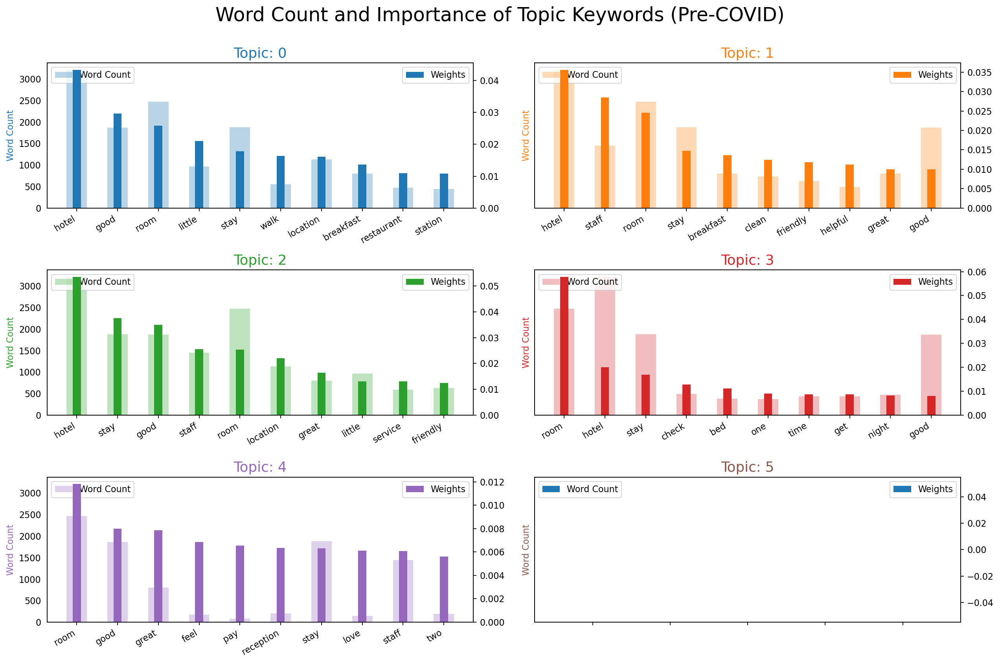

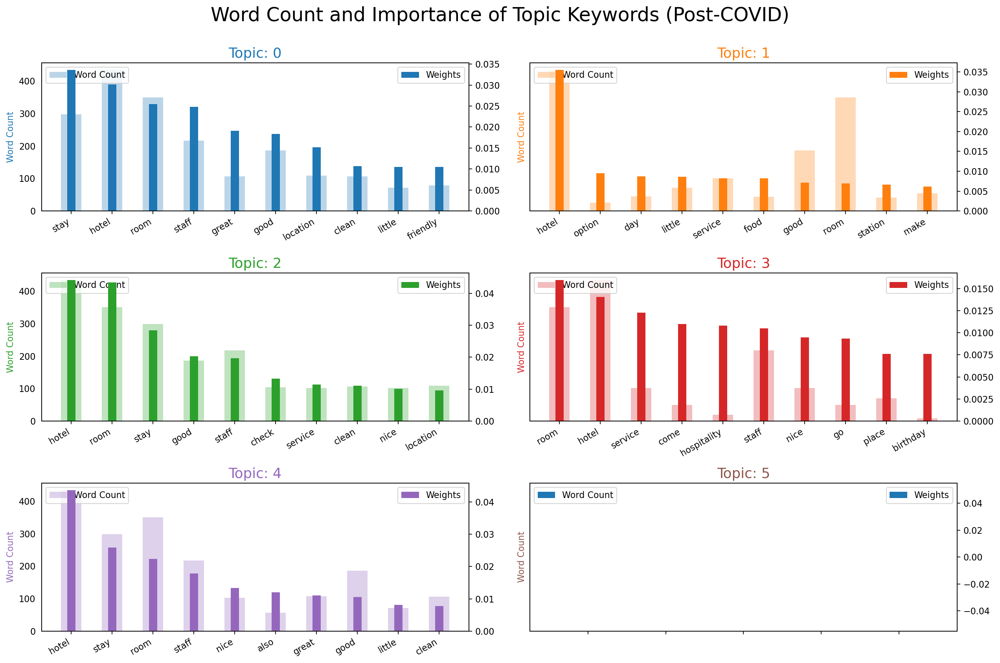

In [372]:
# Create a function to generate the plot
def plot_word_count_importance(topics, data_flat, title):
    out = []
    for i, topic in topics:
        for word, weight in topic:
            out.append([word, i, weight, data_flat.count(word)])

    df_plot = pd.DataFrame(out, columns=['word', 'topic_id', 'importance', 'word_count'])

    # Plot Word Count and Weights of Topic Keywords
    fig, axes = plt.subplots(3, 2, figsize=(16, 10), sharey=True, dpi=160)
    cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]

    for i, ax in enumerate(axes.flatten()):
        ax.bar(x='word', height='word_count', data=df_plot.loc[df_plot.topic_id == i, :], color=cols[i], width=0.5, alpha=0.3, label='Word Count')
        ax_twin = ax.twinx()
        ax_twin.bar(x='word', height='importance', data=df_plot.loc[df_plot.topic_id == i, :], color=cols[i], width=0.2, label='Weights')
        ax.set_ylabel('Word Count', color=cols[i])
        ax.set_title('Topic: ' + str(i), color=cols[i], fontsize=16)
        ax.tick_params(axis='y', left=False)
        ax.set_xticklabels(df_plot.loc[df_plot.topic_id == i, 'word'], rotation=30, horizontalalignment='right')
        ax.legend(loc='upper left')
        ax_twin.legend(loc='upper right')

    fig.tight_layout(w_pad=2)
    fig.suptitle(title, fontsize=22, y=1.05)
    plt.show()

# For Pre-COVID
plot_word_count_importance(topics_pre, data_flat_pre, 'Word Count and Importance of Topic Keywords (Pre-COVID)')

# For Post-COVID
plot_word_count_importance(topics_post, data_flat_post, 'Word Count and Importance of Topic Keywords (Post-COVID)')

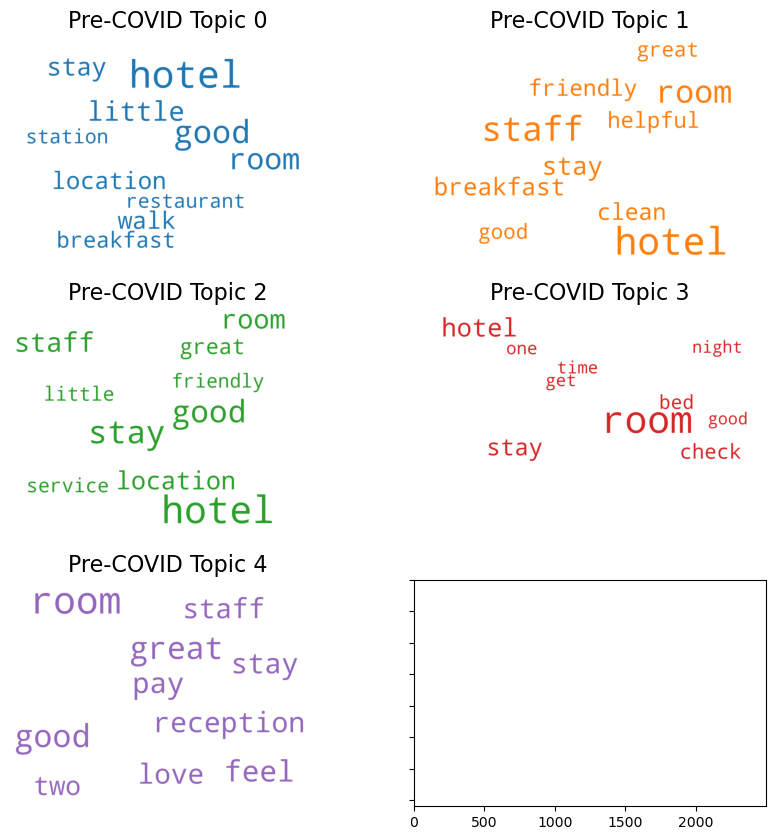

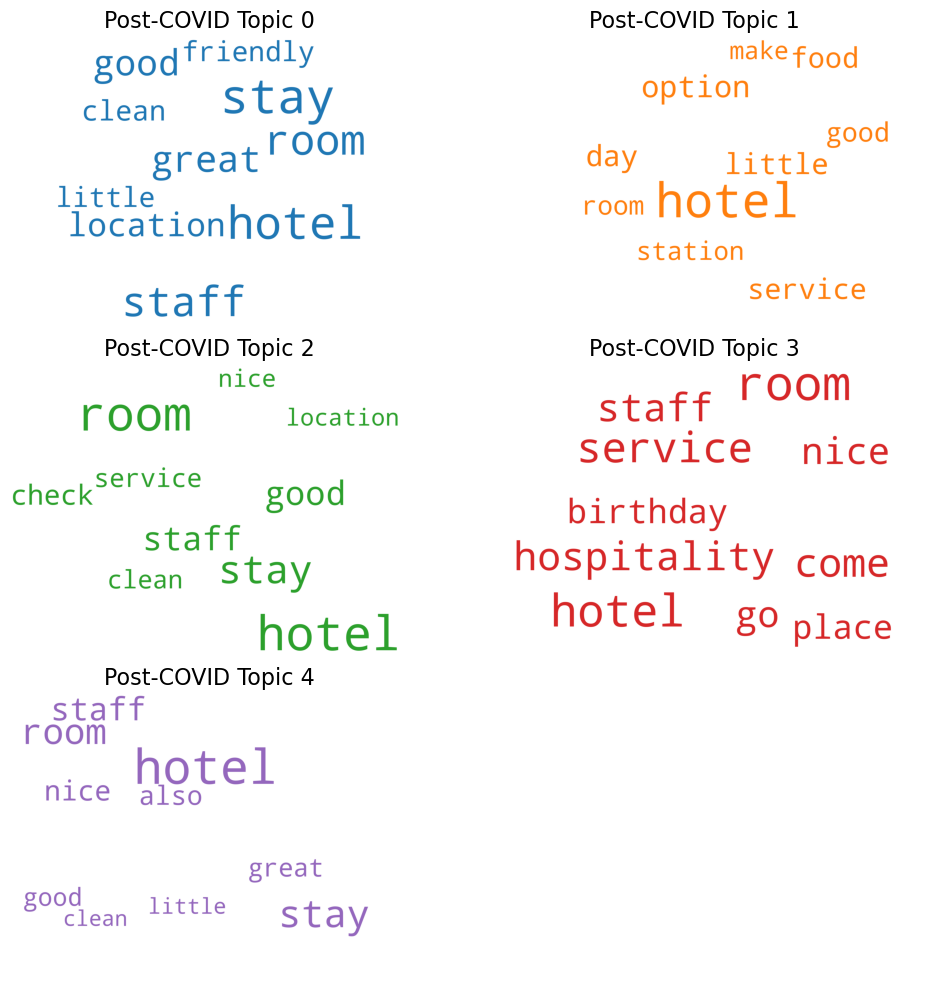

In [373]:
from wordcloud import WordCloud
import matplotlib.colors as mcolors

cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]

# Create WordClouds for each topic in the pre-COVID dataset
clouds_pre = []

for i in range(5):
    cloud = WordCloud(background_color='white',
                      width=2500,
                      height=1800,
                      max_words=10,
                      colormap='tab10',
                      color_func=lambda *args, **kwargs: cols[i],
                      prefer_horizontal=1.0)
    topic_words = dict(pre_ldamodel.show_topic(i, topn=10))
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    clouds_pre.append(cloud)

# Create WordClouds for each topic in the post-COVID dataset
clouds_post = []

for i in range(5):
    cloud = WordCloud(background_color='white',
                      width=2500,
                      height=1800,
                      max_words=10,
                      colormap='tab10',
                      color_func=lambda *args, **kwargs: cols[i],
                      prefer_horizontal=1.0)
    topic_words = dict(post_ldamodel.show_topic(i, topn=10))
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    clouds_post.append(cloud)

# Plot the WordClouds for pre-COVID topics
fig_pre, axes_pre = plt.subplots(3, 2, figsize=(10, 10), sharex=True, sharey=True)

for i, ax in enumerate(axes_pre.flatten()):
    fig_pre.add_subplot(ax)
    if i < len(clouds_pre):
        plt.gca().imshow(clouds_pre[i])
        plt.gca().set_title('Pre-COVID Topic ' + str(i), fontdict=dict(size=16))
        plt.gca().axis('off')

# Plot the WordClouds for post-COVID topics
fig_post, axes_post = plt.subplots(3, 2, figsize=(10, 10), sharex=True, sharey=True)

for i, ax in enumerate(axes_post.flatten()):
    fig_post.add_subplot(ax)
    if i < len(clouds_post):
        plt.gca().imshow(clouds_post[i])
        plt.gca().set_title('Post-COVID Topic ' + str(i), fontdict=dict(size=16))
        plt.gca().axis('off')

plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()

In [374]:
vis = pyLDAvis.gensim.prepare(topic_model=pre_ldamodel, corpus=pre_corpus, dictionary=pre_dict)
pyLDAvis.enable_notebook()
pyLDAvis.display(vis)

In [375]:
vis = pyLDAvis.gensim.prepare(topic_model=post_ldamodel, corpus=post_corpus, dictionary=post_dict)
pyLDAvis.enable_notebook()
pyLDAvis.display(vis)

### Bigrams

In [376]:
clean_precovid = df_precovid['cleaned_review'].apply(preprocess)
clean_precovid = clean_precovid.apply(lambda x: ' '.join(x))
clean_postcovid = df_postcovid['cleaned_review'].apply(preprocess)
clean_postcovid = clean_postcovid.apply(lambda x: ' '.join(x))

In [377]:
from nltk import ngrams
bigrams_precovid = []
bigrams_postcovid = []

for d in clean_precovid:
    tokens = word_tokenize(d)
    bigrams_precovid.append(["_".join(w) for w in ngrams(tokens, 2)])

for e in clean_postcovid:
    tokens = word_tokenize(e)
    bigrams_postcovid.append(['_'.join(w) for w in ngrams(tokens, 2)])


In [378]:
##Generate LDA dictionary and corpus
pre_dict = corpora.Dictionary(bigrams_precovid)
pre_corpus = [pre_dict.doc2bow(text) for text in bigrams_precovid]
## Check optimal number of topics
lda = gensim.models.ldamodel.LdaModel
pre_ldamodel = lda(pre_corpus, num_topics=5, id2word=pre_dict, passes=15)

In [379]:
##Generate LDA dictionary and corpus
post_dict = corpora.Dictionary(bigrams_postcovid)
post_corpus = [post_dict.doc2bow(text) for text in bigrams_postcovid]
## Check optimal number of topics
lda = gensim.models.ldamodel.LdaModel
post_ldamodel = lda(post_corpus, num_topics=5, id2word=post_dict, passes=15)

In [380]:
# For Pre-COVID
topics_pre = pre_ldamodel.show_topics(formatted=False)
data_flat_pre = [word for word_list in bigrams_precovid for word in word_list]

# For Post-COVID
topics_post = post_ldamodel.show_topics(formatted=False)
data_flat_post = [word for word_list in bigrams_postcovid for word in word_list]

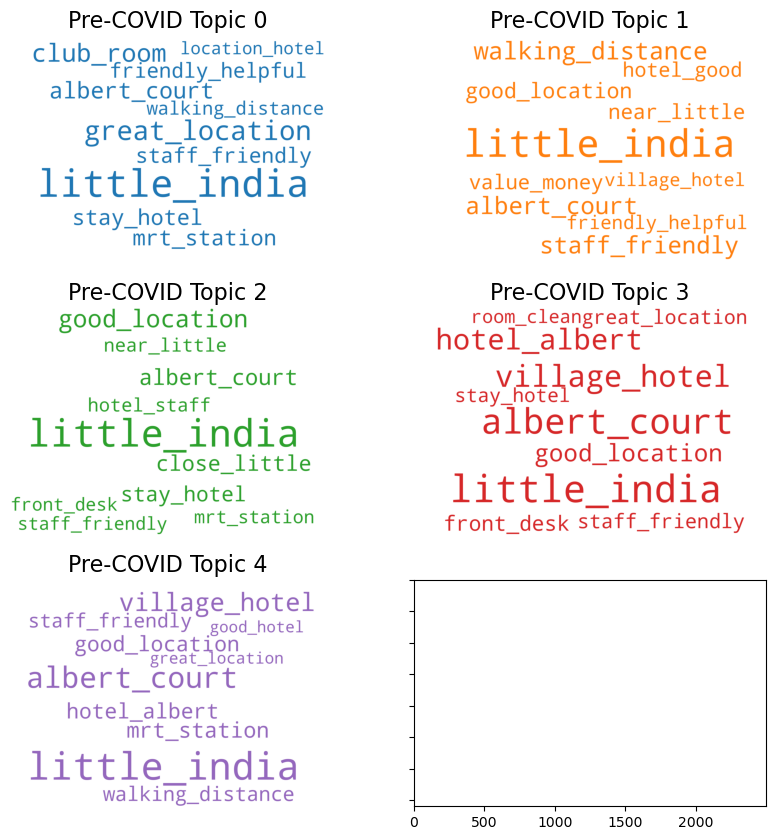

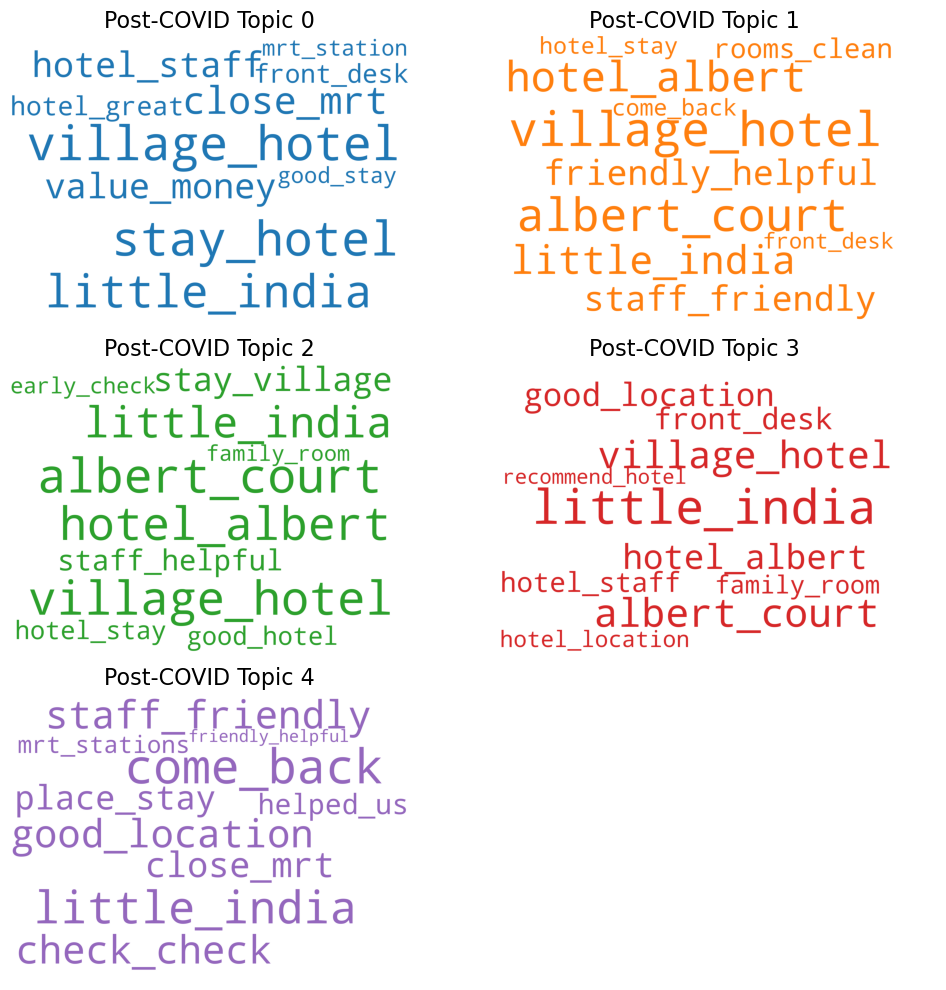

In [381]:
from wordcloud import WordCloud
import matplotlib.colors as mcolors

cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]

# Create WordClouds for each topic in the pre-COVID dataset
clouds_pre = []

for i in range(5):
    cloud = WordCloud(background_color='white',
                      width=2500,
                      height=1800,
                      max_words=10,
                      colormap='tab10',
                      color_func=lambda *args, **kwargs: cols[i],
                      prefer_horizontal=1.0)
    topic_words = dict(pre_ldamodel.show_topic(i, topn=10))
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    clouds_pre.append(cloud)

# Create WordClouds for each topic in the post-COVID dataset
clouds_post = []

for i in range(5):
    cloud = WordCloud(background_color='white',
                      width=2500,
                      height=1800,
                      max_words=10,
                      colormap='tab10',
                      color_func=lambda *args, **kwargs: cols[i],
                      prefer_horizontal=1.0)
    topic_words = dict(post_ldamodel.show_topic(i, topn=10))
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    clouds_post.append(cloud)

# Plot the WordClouds for pre-COVID topics
fig_pre, axes_pre = plt.subplots(3, 2, figsize=(10, 10), sharex=True, sharey=True)

for i, ax in enumerate(axes_pre.flatten()):
    fig_pre.add_subplot(ax)
    if i < len(clouds_pre):
        plt.gca().imshow(clouds_pre[i])
        plt.gca().set_title('Pre-COVID Topic ' + str(i), fontdict=dict(size=16))
        plt.gca().axis('off')

# Plot the WordClouds for post-COVID topics
fig_post, axes_post = plt.subplots(3, 2, figsize=(10, 10), sharex=True, sharey=True)

for i, ax in enumerate(axes_post.flatten()):
    fig_post.add_subplot(ax)
    if i < len(clouds_post):
        plt.gca().imshow(clouds_post[i])
        plt.gca().set_title('Post-COVID Topic ' + str(i), fontdict=dict(size=16))
        plt.gca().axis('off')

plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()

In [382]:
vis = pyLDAvis.gensim.prepare(topic_model=pre_ldamodel, corpus=pre_corpus, dictionary=pre_dict)
pyLDAvis.enable_notebook()
pyLDAvis.display(vis)

In [383]:
vis = pyLDAvis.gensim.prepare(topic_model=post_ldamodel, corpus=post_corpus, dictionary=post_dict)
pyLDAvis.enable_notebook()
pyLDAvis.display(vis)

## Holiday Inn Express Clarke Quay

In [384]:
df = pd.read_csv('../data/processed/cleaned_holiday-inn-express-clarke-quay.csv')
df.head()

,Unnamed: 0,traveller_username,review_title,review_text,travel_type,traveller_country_origin,traveller_total_contributions,traveller_total_helpful_contributions,rating,valid_rating,label,cleaned_review,combined_review,date,covid,year,stem_review,lem_review
0,0,BizLisTrotter,"City center, well kept rooms, quiet and friend...","Stayed 7 nights with family, we had booked two...",Trip type: Travelled with family,"Mumbai, India",55.0,17.0,4.0,True,Positive,city center well kept rooms quiet friendly hel...,"City center, well kept rooms, quiet and friend...",2023-05-01,PostCovid,2023,citi center well kept room quiet friendli help...,city center well keep room quiet friendly help...
1,1,Monique I,Good value for money,Really good value for money. The rooms are mos...,Trip type: Travelled solo,"Sydney, Australia",22.0,3.0,NaN,False,NaN,good value money really good value money rooms...,Good value for money Really good value for mon...,2023-06-01,PostCovid,2023,good valu money realli good valu money room mo...,good value money really good value money room ...
2,2,Robert T,Good for short stay,In many ways better than expected. Very nice r...,Trip type: Travelled as a couple,"London, United Kingdom",46.0,5.0,4.0,True,Positive,good short stay many ways better expected nice...,Good for short stay In many ways better than e...,2023-09-01,PostCovid,2023,good short stay mani way better expect nice ro...,good short stay many way well expect nice roof...
3,3,Mr P,"Just okay, crowded experience","Good location, near the River and restaurant a...",Trip type: Travelled as a couple,"Greater Adelaide, Australia",128.0,85.0,3.0,True,Neutral,okay crowded experience good location near riv...,"Just okay, crowded experience Good location, n...",2023-09-01,PostCovid,2023,okay crowd experi good locat near river restau...,okay crowded experience good location near riv...
4,4,FrangipaniLee,Disappointed pool closed,Location close to Clarke Quay. Easy walking. W...,Trip type: Travelled as a couple,"Sydney, Australia",103.0,65.0,5.0,True,Positive,disappointed pool closed location close clarke...,Disappointed pool closed Location close to Cla...,2023-09-01,PostCovid,2023,disappoint pool close locat close clark quay e...,disappoint pool close location close clarke qu...


In [385]:
##filter for year >= 2015
df_filtered = df[df['year'] >= 2015]

## Stemmed

In [386]:
df_filtered['stem_review'] = df_filtered['stem_review'].apply(remove_stopwords)
df_filtered['stem_review'] = df_filtered['stem_review'].apply(remove_non_english_words, valid_words=english_words)
df_filtered['tokens'] = df_filtered['stem_review'].apply(preprocess)

In [387]:
df_precovid = df_filtered[df_filtered['covid'] == 'PreCovid']
df_precovid.head()

,Unnamed: 0,traveller_username,review_title,review_text,travel_type,traveller_country_origin,traveller_total_contributions,traveller_total_helpful_contributions,rating,valid_rating,label,cleaned_review,combined_review,date,covid,year,stem_review,lem_review,tokens
169,169,Mikenru,Good hotel,"Good hotel in nice area. Rooms a small, but st...",NaN,"Moscow, Russia",25.0,44.0,5.0,True,Positive,good hotel good hotel nice area rooms small st...,Good hotel Good hotel in nice area. Rooms a sm...,2020-01-01,PreCovid,2020,good hotel good hotel nice area room small sti...,good hotel good hotel nice area room small sti...,"[good, hotel, good, hotel, nice, area, room, s..."
170,170,Traveler,"Small Rooms, Good Location, Bugs",The hotel room was very small barley had enoug...,NaN,"San Diego, California",13.0,36.0,2.0,True,Negative,small rooms good location bugs hotel room smal...,"Small Rooms, Good Location, Bugs The hotel roo...",2019-12-01,PreCovid,2019,small room good bug hotel room small barley en...,small room good location bug hotel room small ...,"[small, room, good, bug, hotel, room, small, b..."
172,172,Asia_suitcase,Good place & location,I stayed at many places around Singapore and r...,NaN,"Shanghai, China",240.0,68.0,5.0,True,Positive,good place location stayed many places around ...,Good place & location I stayed at many places ...,2019-12-01,PreCovid,2019,good place stay mani place around recent clark...,good place location stay many place around sin...,"[good, place, stay, mani, place, around, recen..."
174,174,Lord MacDuff,Small / compact rooms but staff friendly / gre...,Yes the rooms are small but rooms in Singapore...,NaN,"Scotland, United Kingdom",710.0,395.0,3.0,True,Neutral,small compact rooms staff friendly great locat...,Small / compact rooms but staff friendly / gre...,2020-01-01,PreCovid,2020,small compact room staff great clark quay ye r...,small compact room staff friendly great locati...,"[small, compact, room, staff, great, clark, qu..."
179,179,Annechad,"Great Hotel, Great Location",Our third visit to this Holiday Inn. It is in...,NaN,"Leeds, United Kingdom",519.0,360.0,5.0,True,Positive,great hotel great location third visit holiday...,"Great Hotel, Great Location Our third visit to...",2019-12-01,PreCovid,2019,great hotel great third visit holiday inn grea...,great hotel great location third visit holiday...,"[great, hotel, great, third, visit, holiday, i..."


In [388]:
df_postcovid = df_filtered[df_filtered['covid'] == 'PostCovid']
df_postcovid.head()

,Unnamed: 0,traveller_username,review_title,review_text,travel_type,traveller_country_origin,traveller_total_contributions,traveller_total_helpful_contributions,rating,valid_rating,label,cleaned_review,combined_review,date,covid,year,stem_review,lem_review,tokens
0,0,BizLisTrotter,"City center, well kept rooms, quiet and friend...","Stayed 7 nights with family, we had booked two...",Trip type: Travelled with family,"Mumbai, India",55.0,17.0,4.0,True,Positive,city center well kept rooms quiet friendly hel...,"City center, well kept rooms, quiet and friend...",2023-05-01,PostCovid,2023,center well kept room quiet help us left behin...,city center well keep room quiet friendly help...,"[center, well, kept, room, quiet, help, us, le..."
1,1,Monique I,Good value for money,Really good value for money. The rooms are mos...,Trip type: Travelled solo,"Sydney, Australia",22.0,3.0,NaN,False,NaN,good value money really good value money rooms...,Good value for money Really good value for mon...,2023-06-01,PostCovid,2023,good money good money room clean small side fi...,good value money really good value money room ...,"[good, money, good, money, room, clean, small,..."
2,2,Robert T,Good for short stay,In many ways better than expected. Very nice r...,Trip type: Travelled as a couple,"London, United Kingdom",46.0,5.0,4.0,True,Positive,good short stay many ways better expected nice...,Good for short stay In many ways better than e...,2023-09-01,PostCovid,2023,good short stay mani way better expect nice ro...,good short stay many way well expect nice roof...,"[good, short, stay, mani, way, better, expect,..."
3,3,Mr P,"Just okay, crowded experience","Good location, near the River and restaurant a...",Trip type: Travelled as a couple,"Greater Adelaide, Australia",128.0,85.0,3.0,True,Neutral,okay crowded experience good location near riv...,"Just okay, crowded experience Good location, n...",2023-09-01,PostCovid,2023,crowd good near river restaur area suit younge...,okay crowded experience good location near riv...,"[crowd, good, near, river, restaur, area, suit..."
4,4,FrangipaniLee,Disappointed pool closed,Location close to Clarke Quay. Easy walking. W...,Trip type: Travelled as a couple,"Sydney, Australia",103.0,65.0,5.0,True,Positive,disappointed pool closed location close clarke...,Disappointed pool closed Location close to Cla...,2023-09-01,PostCovid,2023,disappoint pool close close clark quay walk st...,disappoint pool close location close clarke qu...,"[disappoint, pool, close, close, clark, quay, ..."


### Unigrams

In [389]:
##Generate LDA dictionary and corpus
pre_dict = corpora.Dictionary(df_precovid['tokens'])
pre_corpus = [pre_dict.doc2bow(text) for text in df_precovid['tokens']]

In [390]:
## Use 5 topics as baseline
lda = gensim.models.ldamodel.LdaModel
pre_ldamodel = lda(pre_corpus, num_topics=5, id2word=pre_dict, passes=15)

In [391]:
##Generate LDA dictionary and corpus
post_dict = corpora.Dictionary(df_postcovid['tokens'])
post_corpus = [post_dict.doc2bow(text) for text in df_postcovid['tokens']]

In [392]:
## Check optimal number of topics
lda = gensim.models.ldamodel.LdaModel
post_ldamodel = lda(post_corpus, num_topics=5, id2word=post_dict, passes=15)

In [393]:
# For Pre-COVID
topics_pre = pre_ldamodel.show_topics(formatted=False)
data_flat_pre = [word for word_list in df_precovid['tokens'] for word in word_list]

# For Post-COVID
topics_post = post_ldamodel.show_topics(formatted=False)
data_flat_post = [word for word_list in df_postcovid['tokens'] for word in word_list]

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_18508\2307337869.py:21: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(df_plot.loc[df_plot.topic_id == i, 'word'], rotation=30, horizontalalignment='right')


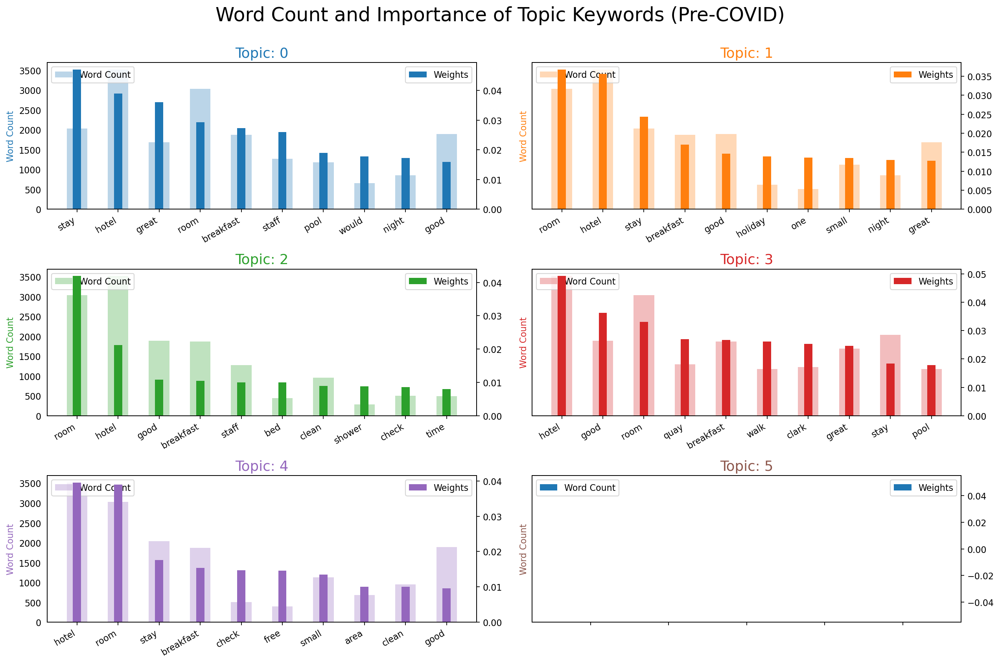

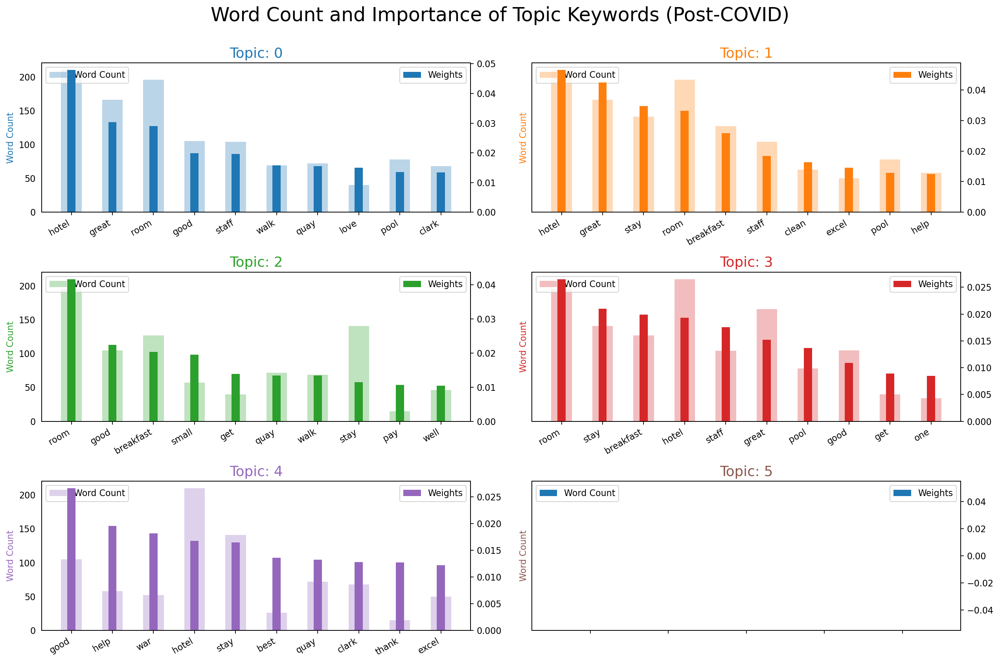

In [394]:
# Create a function to generate the plot
def plot_word_count_importance(topics, data_flat, title):
    out = []
    for i, topic in topics:
        for word, weight in topic:
            out.append([word, i, weight, data_flat.count(word)])

    df_plot = pd.DataFrame(out, columns=['word', 'topic_id', 'importance', 'word_count'])

    # Plot Word Count and Weights of Topic Keywords
    fig, axes = plt.subplots(3, 2, figsize=(16, 10), sharey=True, dpi=160)
    cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]

    for i, ax in enumerate(axes.flatten()):
        ax.bar(x='word', height='word_count', data=df_plot.loc[df_plot.topic_id == i, :], color=cols[i], width=0.5, alpha=0.3, label='Word Count')
        ax_twin = ax.twinx()
        ax_twin.bar(x='word', height='importance', data=df_plot.loc[df_plot.topic_id == i, :], color=cols[i], width=0.2, label='Weights')
        ax.set_ylabel('Word Count', color=cols[i])
        ax.set_title('Topic: ' + str(i), color=cols[i], fontsize=16)
        ax.tick_params(axis='y', left=False)
        ax.set_xticklabels(df_plot.loc[df_plot.topic_id == i, 'word'], rotation=30, horizontalalignment='right')
        ax.legend(loc='upper left')
        ax_twin.legend(loc='upper right')

    fig.tight_layout(w_pad=2)
    fig.suptitle(title, fontsize=22, y=1.05)
    plt.show()

# For Pre-COVID
plot_word_count_importance(topics_pre, data_flat_pre, 'Word Count and Importance of Topic Keywords (Pre-COVID)')

# For Post-COVID
plot_word_count_importance(topics_post, data_flat_post, 'Word Count and Importance of Topic Keywords (Post-COVID)')

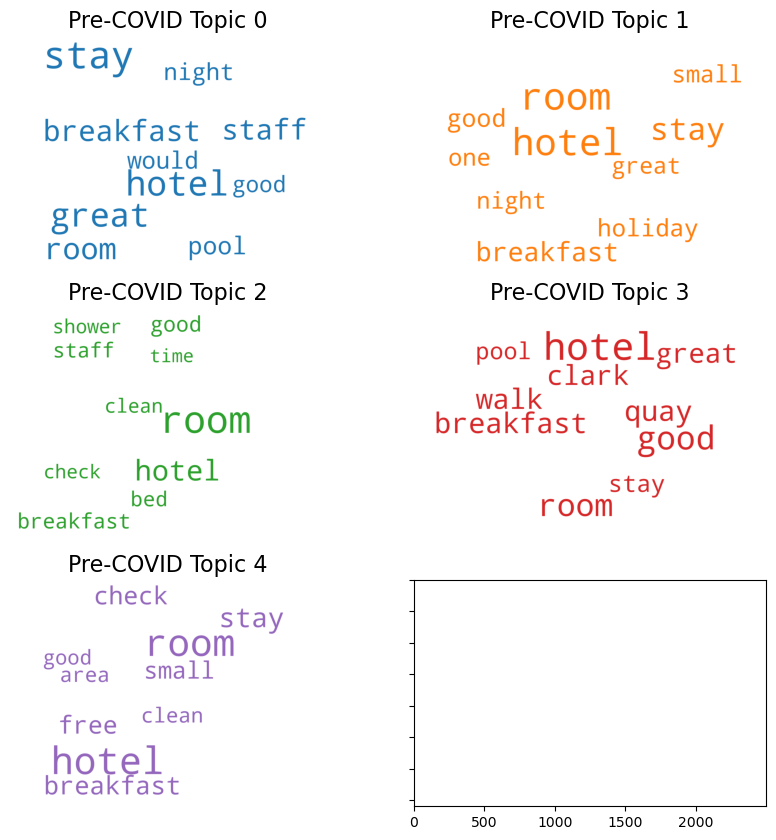

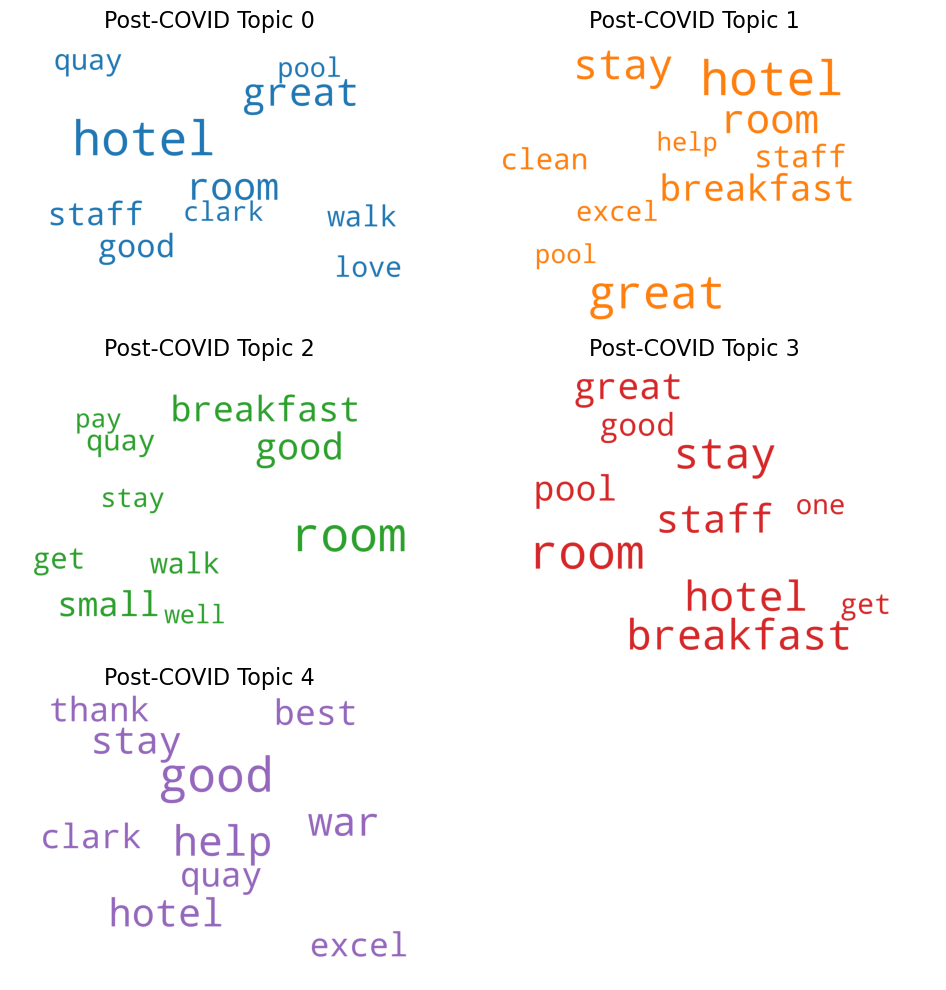

In [395]:
from wordcloud import WordCloud
import matplotlib.colors as mcolors

cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]

# Create WordClouds for each topic in the pre-COVID dataset
clouds_pre = []

for i in range(5):
    cloud = WordCloud(background_color='white',
                      width=2500,
                      height=1800,
                      max_words=10,
                      colormap='tab10',
                      color_func=lambda *args, **kwargs: cols[i],
                      prefer_horizontal=1.0)
    topic_words = dict(pre_ldamodel.show_topic(i, topn=10))
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    clouds_pre.append(cloud)

# Create WordClouds for each topic in the post-COVID dataset
clouds_post = []

for i in range(5):
    cloud = WordCloud(background_color='white',
                      width=2500,
                      height=1800,
                      max_words=10,
                      colormap='tab10',
                      color_func=lambda *args, **kwargs: cols[i],
                      prefer_horizontal=1.0)
    topic_words = dict(post_ldamodel.show_topic(i, topn=10))
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    clouds_post.append(cloud)

# Plot the WordClouds for pre-COVID topics
fig_pre, axes_pre = plt.subplots(3, 2, figsize=(10, 10), sharex=True, sharey=True)

for i, ax in enumerate(axes_pre.flatten()):
    fig_pre.add_subplot(ax)
    if i < len(clouds_pre):
        plt.gca().imshow(clouds_pre[i])
        plt.gca().set_title('Pre-COVID Topic ' + str(i), fontdict=dict(size=16))
        plt.gca().axis('off')

# Plot the WordClouds for post-COVID topics
fig_post, axes_post = plt.subplots(3, 2, figsize=(10, 10), sharex=True, sharey=True)

for i, ax in enumerate(axes_post.flatten()):
    fig_post.add_subplot(ax)
    if i < len(clouds_post):
        plt.gca().imshow(clouds_post[i])
        plt.gca().set_title('Post-COVID Topic ' + str(i), fontdict=dict(size=16))
        plt.gca().axis('off')

plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()

In [396]:
vis = pyLDAvis.gensim.prepare(topic_model=pre_ldamodel, corpus=pre_corpus, dictionary=pre_dict)
pyLDAvis.enable_notebook()
pyLDAvis.display(vis)

In [397]:
vis = pyLDAvis.gensim.prepare(topic_model=post_ldamodel, corpus=post_corpus, dictionary=post_dict)
pyLDAvis.enable_notebook()
pyLDAvis.display(vis)

### Bigrams

In [398]:
clean_precovid = df_precovid['cleaned_review'].apply(preprocess)
clean_precovid = clean_precovid.apply(lambda x: ' '.join(x))
clean_postcovid = df_postcovid['cleaned_review'].apply(preprocess)
clean_postcovid = clean_postcovid.apply(lambda x: ' '.join(x))

In [399]:
from nltk import ngrams
bigrams_precovid = []
bigrams_postcovid = []

for d in clean_precovid:
    tokens = word_tokenize(d)
    bigrams_precovid.append(["_".join(w) for w in ngrams(tokens, 2)])

for e in clean_postcovid:
    tokens = word_tokenize(e)
    bigrams_postcovid.append(['_'.join(w) for w in ngrams(tokens, 2)])


In [400]:
##Generate LDA dictionary and corpus
pre_dict = corpora.Dictionary(bigrams_precovid)
pre_corpus = [pre_dict.doc2bow(text) for text in bigrams_precovid]
## Check optimal number of topics
lda = gensim.models.ldamodel.LdaModel
pre_ldamodel = lda(pre_corpus, num_topics=5, id2word=pre_dict, passes=15)

In [401]:
##Generate LDA dictionary and corpus
post_dict = corpora.Dictionary(bigrams_postcovid)
post_corpus = [post_dict.doc2bow(text) for text in bigrams_postcovid]
## Check optimal number of topics
lda = gensim.models.ldamodel.LdaModel
post_ldamodel = lda(post_corpus, num_topics=5, id2word=post_dict, passes=15)

In [402]:
# For Pre-COVID
topics_pre = pre_ldamodel.show_topics(formatted=False)
data_flat_pre = [word for word_list in bigrams_precovid for word in word_list]

# For Post-COVID
topics_post = post_ldamodel.show_topics(formatted=False)
data_flat_post = [word for word_list in bigrams_postcovid for word in word_list]

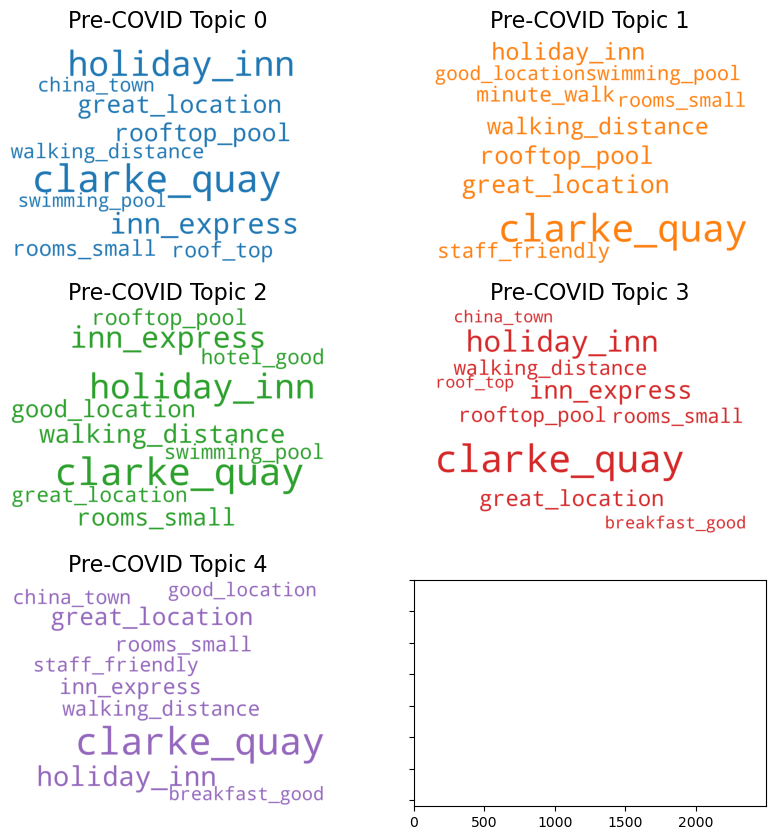

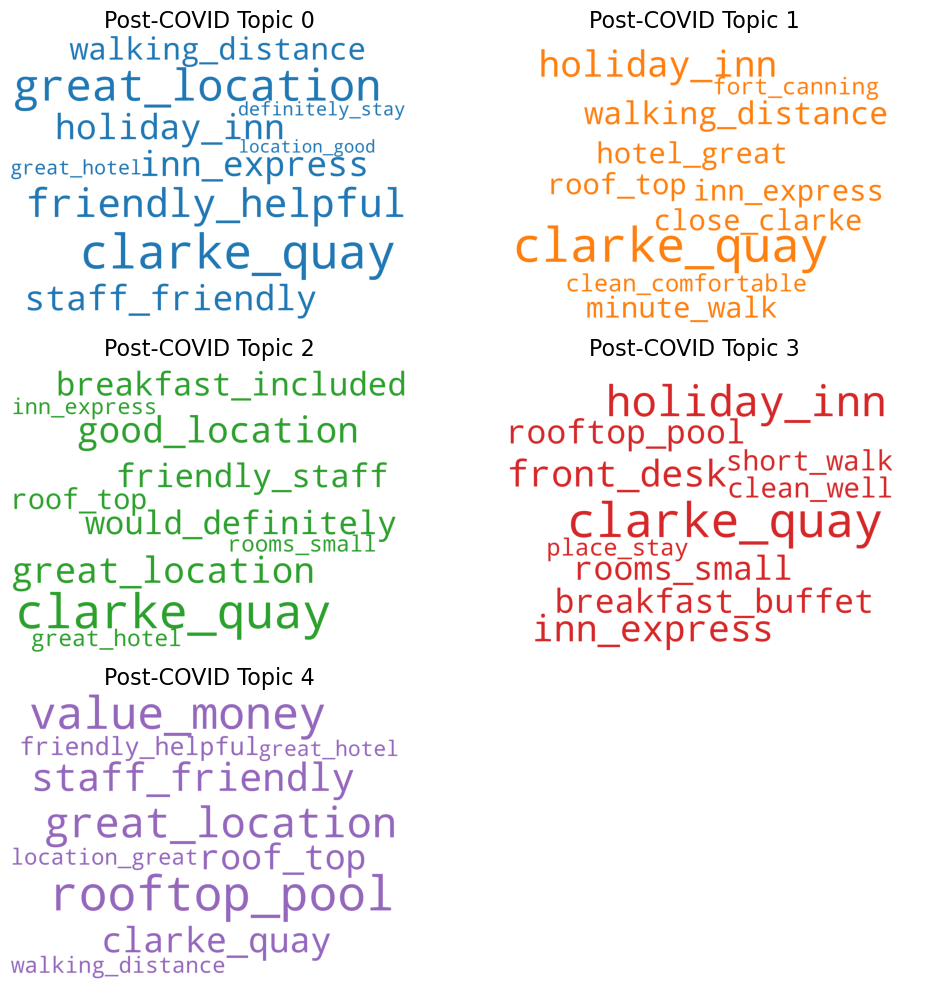

In [403]:
from wordcloud import WordCloud
import matplotlib.colors as mcolors

cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]

# Create WordClouds for each topic in the pre-COVID dataset
clouds_pre = []

for i in range(5):
    cloud = WordCloud(background_color='white',
                      width=2500,
                      height=1800,
                      max_words=10,
                      colormap='tab10',
                      color_func=lambda *args, **kwargs: cols[i],
                      prefer_horizontal=1.0)
    topic_words = dict(pre_ldamodel.show_topic(i, topn=10))
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    clouds_pre.append(cloud)

# Create WordClouds for each topic in the post-COVID dataset
clouds_post = []

for i in range(5):
    cloud = WordCloud(background_color='white',
                      width=2500,
                      height=1800,
                      max_words=10,
                      colormap='tab10',
                      color_func=lambda *args, **kwargs: cols[i],
                      prefer_horizontal=1.0)
    topic_words = dict(post_ldamodel.show_topic(i, topn=10))
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    clouds_post.append(cloud)

# Plot the WordClouds for pre-COVID topics
fig_pre, axes_pre = plt.subplots(3, 2, figsize=(10, 10), sharex=True, sharey=True)

for i, ax in enumerate(axes_pre.flatten()):
    fig_pre.add_subplot(ax)
    if i < len(clouds_pre):
        plt.gca().imshow(clouds_pre[i])
        plt.gca().set_title('Pre-COVID Topic ' + str(i), fontdict=dict(size=16))
        plt.gca().axis('off')

# Plot the WordClouds for post-COVID topics
fig_post, axes_post = plt.subplots(3, 2, figsize=(10, 10), sharex=True, sharey=True)

for i, ax in enumerate(axes_post.flatten()):
    fig_post.add_subplot(ax)
    if i < len(clouds_post):
        plt.gca().imshow(clouds_post[i])
        plt.gca().set_title('Post-COVID Topic ' + str(i), fontdict=dict(size=16))
        plt.gca().axis('off')

plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()

In [404]:
vis = pyLDAvis.gensim.prepare(topic_model=pre_ldamodel, corpus=pre_corpus, dictionary=pre_dict)
pyLDAvis.enable_notebook()
pyLDAvis.display(vis)

In [405]:
vis = pyLDAvis.gensim.prepare(topic_model=post_ldamodel, corpus=post_corpus, dictionary=post_dict)
pyLDAvis.enable_notebook()
pyLDAvis.display(vis)

## Lemmatized

In [406]:
df_filtered['lem_review'] = df_filtered['lem_review'].apply(remove_stopwords)
df_filtered['lem_review'] = df_filtered['lem_review'].apply(remove_non_english_words, valid_words=english_words)
df_filtered['tokens'] = df_filtered['lem_review'].apply(preprocess)

In [407]:
df_precovid = df_filtered[df_filtered['covid'] == 'PreCovid']
df_precovid.head()

,Unnamed: 0,traveller_username,review_title,review_text,travel_type,traveller_country_origin,traveller_total_contributions,traveller_total_helpful_contributions,rating,valid_rating,label,cleaned_review,combined_review,date,covid,year,stem_review,lem_review,tokens
169,169,Mikenru,Good hotel,"Good hotel in nice area. Rooms a small, but st...",NaN,"Moscow, Russia",25.0,44.0,5.0,True,Positive,good hotel good hotel nice area rooms small st...,Good hotel Good hotel in nice area. Rooms a sm...,2020-01-01,PreCovid,2020,good hotel good hotel nice area room small sti...,good hotel good hotel nice area room small sti...,"[good, hotel, good, hotel, nice, area, room, s..."
170,170,Traveler,"Small Rooms, Good Location, Bugs",The hotel room was very small barley had enoug...,NaN,"San Diego, California",13.0,36.0,2.0,True,Negative,small rooms good location bugs hotel room smal...,"Small Rooms, Good Location, Bugs The hotel roo...",2019-12-01,PreCovid,2019,small room good bug hotel room small barley en...,small room good location bug hotel room small ...,"[small, room, good, location, bug, hotel, room..."
172,172,Asia_suitcase,Good place & location,I stayed at many places around Singapore and r...,NaN,"Shanghai, China",240.0,68.0,5.0,True,Positive,good place location stayed many places around ...,Good place & location I stayed at many places ...,2019-12-01,PreCovid,2019,good place stay mani place around recent clark...,good place location stay many place around rec...,"[good, place, location, stay, many, place, aro..."
174,174,Lord MacDuff,Small / compact rooms but staff friendly / gre...,Yes the rooms are small but rooms in Singapore...,NaN,"Scotland, United Kingdom",710.0,395.0,3.0,True,Neutral,small compact rooms staff friendly great locat...,Small / compact rooms but staff friendly / gre...,2020-01-01,PreCovid,2020,small compact room staff great clark quay ye r...,small compact room staff friendly great locati...,"[small, compact, room, staff, friendly, great,..."
179,179,Annechad,"Great Hotel, Great Location",Our third visit to this Holiday Inn. It is in...,NaN,"Leeds, United Kingdom",519.0,360.0,5.0,True,Positive,great hotel great location third visit holiday...,"Great Hotel, Great Location Our third visit to...",2019-12-01,PreCovid,2019,great hotel great third visit holiday inn grea...,great hotel great location third visit holiday...,"[great, hotel, great, location, third, visit, ..."


In [408]:
df_postcovid = df_filtered[df_filtered['covid'] == 'PostCovid']
df_postcovid.head()

,Unnamed: 0,traveller_username,review_title,review_text,travel_type,traveller_country_origin,traveller_total_contributions,traveller_total_helpful_contributions,rating,valid_rating,label,cleaned_review,combined_review,date,covid,year,stem_review,lem_review,tokens
0,0,BizLisTrotter,"City center, well kept rooms, quiet and friend...","Stayed 7 nights with family, we had booked two...",Trip type: Travelled with family,"Mumbai, India",55.0,17.0,4.0,True,Positive,city center well kept rooms quiet friendly hel...,"City center, well kept rooms, quiet and friend...",2023-05-01,PostCovid,2023,center well kept room quiet help us left behin...,city center well keep room quiet friendly help...,"[city, center, well, keep, room, quiet, friend..."
1,1,Monique I,Good value for money,Really good value for money. The rooms are mos...,Trip type: Travelled solo,"Sydney, Australia",22.0,3.0,NaN,False,NaN,good value money really good value money rooms...,Good value for money Really good value for mon...,2023-06-01,PostCovid,2023,good money good money room clean small side fi...,good value money really good value money room ...,"[good, value, money, really, good, value, mone..."
2,2,Robert T,Good for short stay,In many ways better than expected. Very nice r...,Trip type: Travelled as a couple,"London, United Kingdom",46.0,5.0,4.0,True,Positive,good short stay many ways better expected nice...,Good for short stay In many ways better than e...,2023-09-01,PostCovid,2023,good short stay mani way better expect nice ro...,good short stay many way well expect nice roof...,"[good, short, stay, many, way, well, expect, n..."
3,3,Mr P,"Just okay, crowded experience","Good location, near the River and restaurant a...",Trip type: Travelled as a couple,"Greater Adelaide, Australia",128.0,85.0,3.0,True,Neutral,okay crowded experience good location near riv...,"Just okay, crowded experience Good location, n...",2023-09-01,PostCovid,2023,crowd good near river restaur area suit younge...,crowded experience good location near river re...,"[crowded, experience, good, location, near, ri..."
4,4,FrangipaniLee,Disappointed pool closed,Location close to Clarke Quay. Easy walking. W...,Trip type: Travelled as a couple,"Sydney, Australia",103.0,65.0,5.0,True,Positive,disappointed pool closed location close clarke...,Disappointed pool closed Location close to Cla...,2023-09-01,PostCovid,2023,disappoint pool close close clark quay walk st...,disappoint pool close location close quay easy...,"[disappoint, pool, close, location, close, qua..."


### Unigrams

In [409]:
##Generate LDA dictionary and corpus
pre_dict = corpora.Dictionary(df_precovid['tokens'])
pre_corpus = [pre_dict.doc2bow(text) for text in df_precovid['tokens']]

In [410]:
## Use 5 topics as baseline
lda = gensim.models.ldamodel.LdaModel
pre_ldamodel = lda(pre_corpus, num_topics=5, id2word=pre_dict, passes=15)

In [411]:
##Generate LDA dictionary and corpus
post_dict = corpora.Dictionary(df_postcovid['tokens'])
post_corpus = [post_dict.doc2bow(text) for text in df_postcovid['tokens']]

In [412]:
## Check optimal number of topics
lda = gensim.models.ldamodel.LdaModel
post_ldamodel = lda(post_corpus, num_topics=5, id2word=post_dict, passes=15)

In [413]:
# For Pre-COVID
topics_pre = pre_ldamodel.show_topics(formatted=False)
data_flat_pre = [word for word_list in df_precovid['tokens'] for word in word_list]

# For Post-COVID
topics_post = post_ldamodel.show_topics(formatted=False)
data_flat_post = [word for word_list in df_postcovid['tokens'] for word in word_list]

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_18508\2307337869.py:21: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(df_plot.loc[df_plot.topic_id == i, 'word'], rotation=30, horizontalalignment='right')


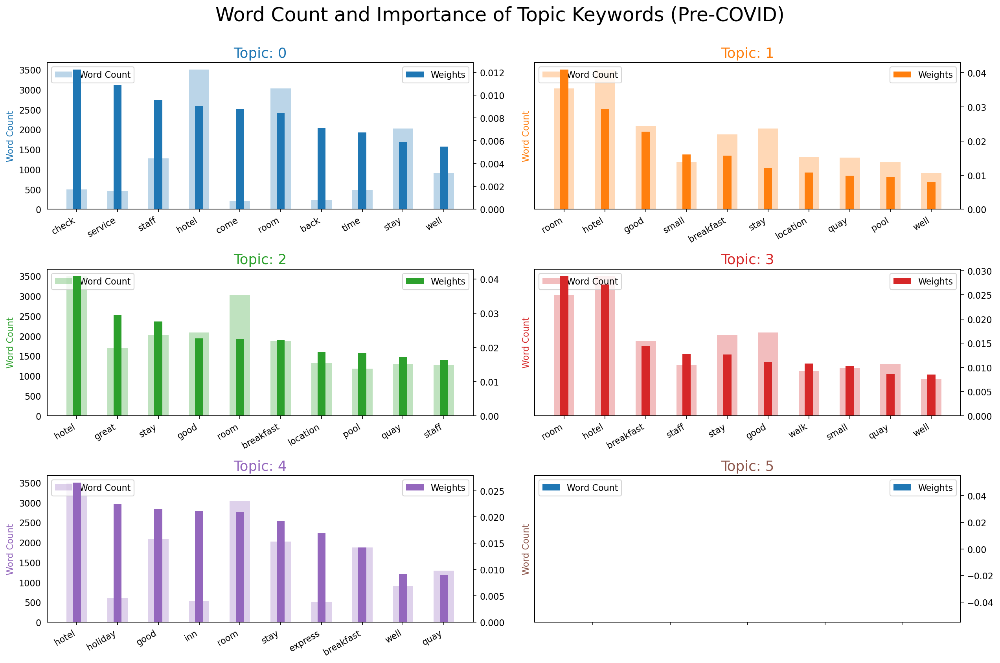

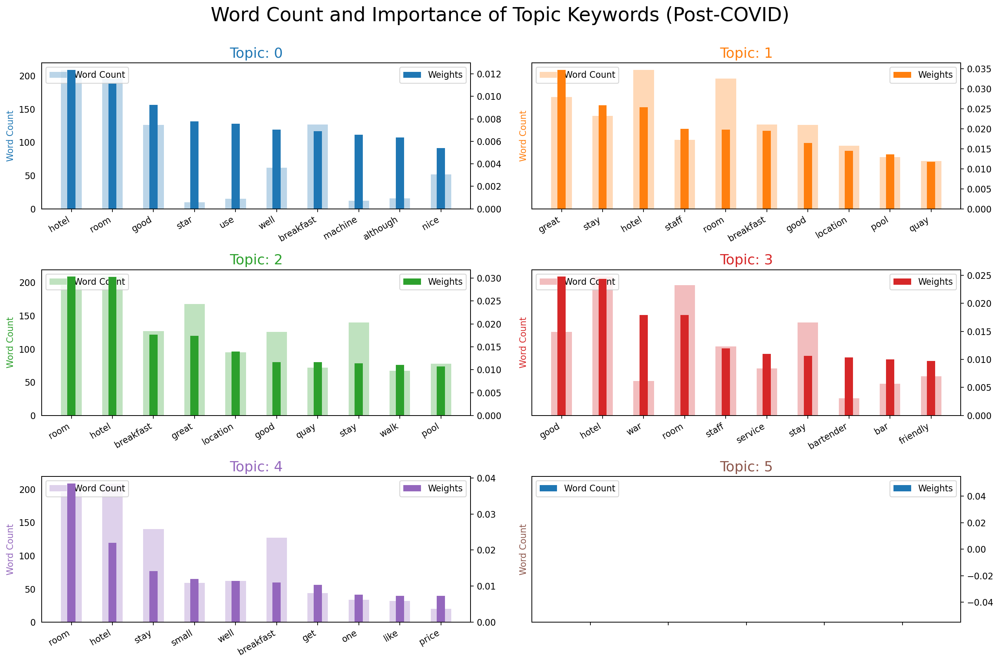

In [414]:
# Create a function to generate the plot
def plot_word_count_importance(topics, data_flat, title):
    out = []
    for i, topic in topics:
        for word, weight in topic:
            out.append([word, i, weight, data_flat.count(word)])

    df_plot = pd.DataFrame(out, columns=['word', 'topic_id', 'importance', 'word_count'])

    # Plot Word Count and Weights of Topic Keywords
    fig, axes = plt.subplots(3, 2, figsize=(16, 10), sharey=True, dpi=160)
    cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]

    for i, ax in enumerate(axes.flatten()):
        ax.bar(x='word', height='word_count', data=df_plot.loc[df_plot.topic_id == i, :], color=cols[i], width=0.5, alpha=0.3, label='Word Count')
        ax_twin = ax.twinx()
        ax_twin.bar(x='word', height='importance', data=df_plot.loc[df_plot.topic_id == i, :], color=cols[i], width=0.2, label='Weights')
        ax.set_ylabel('Word Count', color=cols[i])
        ax.set_title('Topic: ' + str(i), color=cols[i], fontsize=16)
        ax.tick_params(axis='y', left=False)
        ax.set_xticklabels(df_plot.loc[df_plot.topic_id == i, 'word'], rotation=30, horizontalalignment='right')
        ax.legend(loc='upper left')
        ax_twin.legend(loc='upper right')

    fig.tight_layout(w_pad=2)
    fig.suptitle(title, fontsize=22, y=1.05)
    plt.show()

# For Pre-COVID
plot_word_count_importance(topics_pre, data_flat_pre, 'Word Count and Importance of Topic Keywords (Pre-COVID)')

# For Post-COVID
plot_word_count_importance(topics_post, data_flat_post, 'Word Count and Importance of Topic Keywords (Post-COVID)')

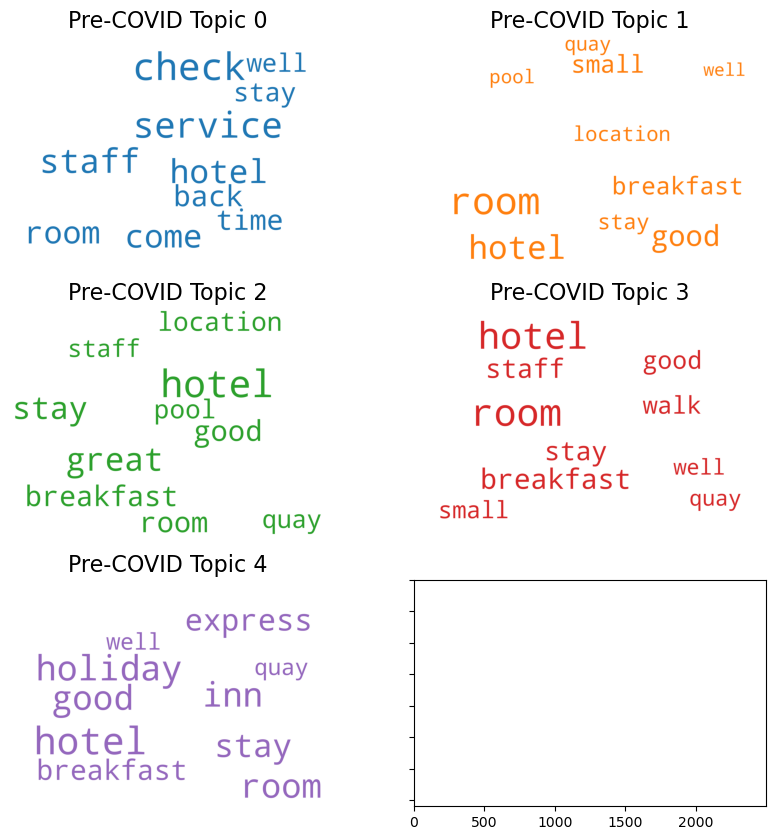

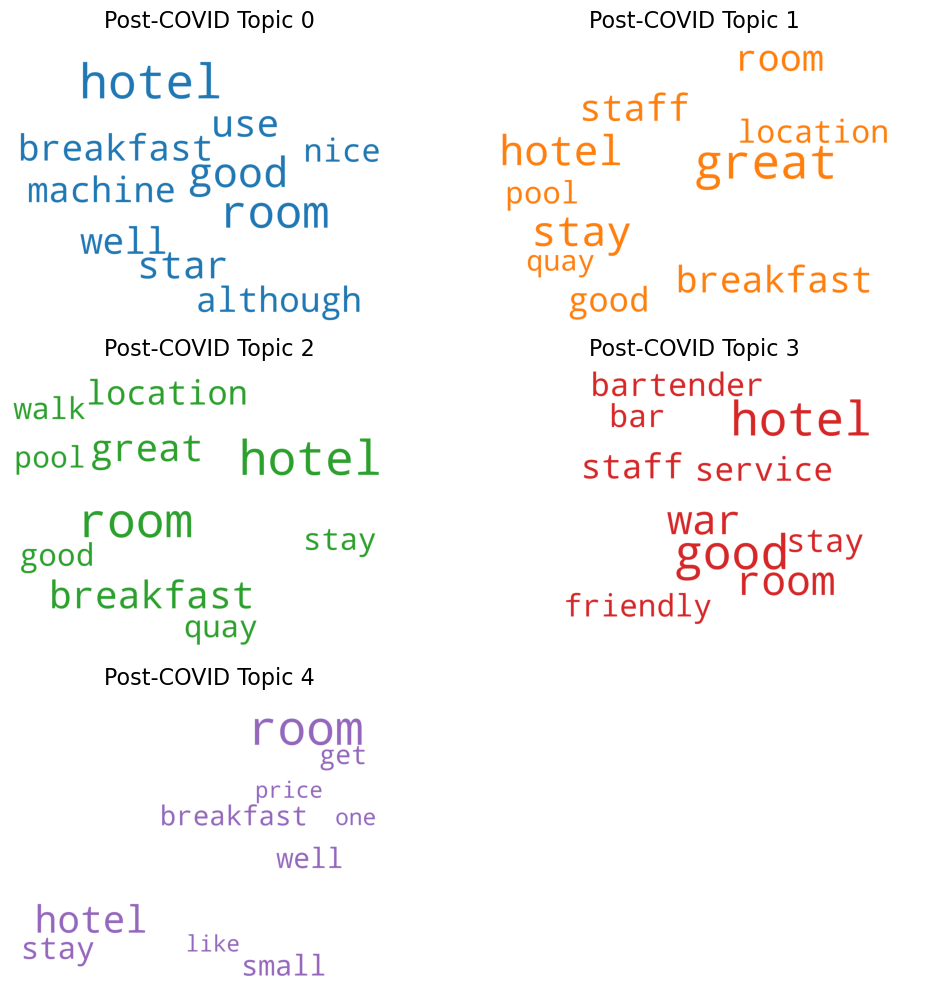

In [415]:
from wordcloud import WordCloud
import matplotlib.colors as mcolors

cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]

# Create WordClouds for each topic in the pre-COVID dataset
clouds_pre = []

for i in range(5):
    cloud = WordCloud(background_color='white',
                      width=2500,
                      height=1800,
                      max_words=10,
                      colormap='tab10',
                      color_func=lambda *args, **kwargs: cols[i],
                      prefer_horizontal=1.0)
    topic_words = dict(pre_ldamodel.show_topic(i, topn=10))
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    clouds_pre.append(cloud)

# Create WordClouds for each topic in the post-COVID dataset
clouds_post = []

for i in range(5):
    cloud = WordCloud(background_color='white',
                      width=2500,
                      height=1800,
                      max_words=10,
                      colormap='tab10',
                      color_func=lambda *args, **kwargs: cols[i],
                      prefer_horizontal=1.0)
    topic_words = dict(post_ldamodel.show_topic(i, topn=10))
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    clouds_post.append(cloud)

# Plot the WordClouds for pre-COVID topics
fig_pre, axes_pre = plt.subplots(3, 2, figsize=(10, 10), sharex=True, sharey=True)

for i, ax in enumerate(axes_pre.flatten()):
    fig_pre.add_subplot(ax)
    if i < len(clouds_pre):
        plt.gca().imshow(clouds_pre[i])
        plt.gca().set_title('Pre-COVID Topic ' + str(i), fontdict=dict(size=16))
        plt.gca().axis('off')

# Plot the WordClouds for post-COVID topics
fig_post, axes_post = plt.subplots(3, 2, figsize=(10, 10), sharex=True, sharey=True)

for i, ax in enumerate(axes_post.flatten()):
    fig_post.add_subplot(ax)
    if i < len(clouds_post):
        plt.gca().imshow(clouds_post[i])
        plt.gca().set_title('Post-COVID Topic ' + str(i), fontdict=dict(size=16))
        plt.gca().axis('off')

plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()

In [416]:
vis = pyLDAvis.gensim.prepare(topic_model=pre_ldamodel, corpus=pre_corpus, dictionary=pre_dict)
pyLDAvis.enable_notebook()
pyLDAvis.display(vis)

In [417]:
vis = pyLDAvis.gensim.prepare(topic_model=post_ldamodel, corpus=post_corpus, dictionary=post_dict)
pyLDAvis.enable_notebook()
pyLDAvis.display(vis)

### Bigrams

In [418]:
clean_precovid = df_precovid['cleaned_review'].apply(preprocess)
clean_precovid = clean_precovid.apply(lambda x: ' '.join(x))
clean_postcovid = df_postcovid['cleaned_review'].apply(preprocess)
clean_postcovid = clean_postcovid.apply(lambda x: ' '.join(x))

In [419]:
from nltk import ngrams
bigrams_precovid = []
bigrams_postcovid = []

for d in clean_precovid:
    tokens = word_tokenize(d)
    bigrams_precovid.append(["_".join(w) for w in ngrams(tokens, 2)])

for e in clean_postcovid:
    tokens = word_tokenize(e)
    bigrams_postcovid.append(['_'.join(w) for w in ngrams(tokens, 2)])


In [420]:
##Generate LDA dictionary and corpus
pre_dict = corpora.Dictionary(bigrams_precovid)
pre_corpus = [pre_dict.doc2bow(text) for text in bigrams_precovid]
## Check optimal number of topics
lda = gensim.models.ldamodel.LdaModel
pre_ldamodel = lda(pre_corpus, num_topics=5, id2word=pre_dict, passes=15)

In [421]:
##Generate LDA dictionary and corpus
post_dict = corpora.Dictionary(bigrams_postcovid)
post_corpus = [post_dict.doc2bow(text) for text in bigrams_postcovid]
## Check optimal number of topics
lda = gensim.models.ldamodel.LdaModel
post_ldamodel = lda(post_corpus, num_topics=5, id2word=post_dict, passes=15)

In [422]:
# For Pre-COVID
topics_pre = pre_ldamodel.show_topics(formatted=False)
data_flat_pre = [word for word_list in bigrams_precovid for word in word_list]

# For Post-COVID
topics_post = post_ldamodel.show_topics(formatted=False)
data_flat_post = [word for word_list in bigrams_postcovid for word in word_list]

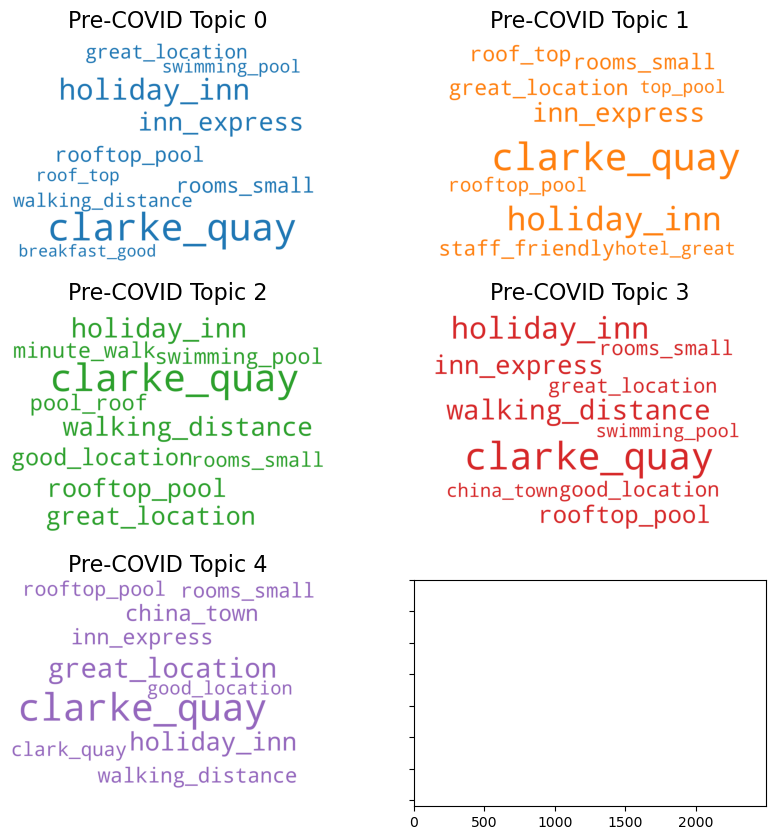

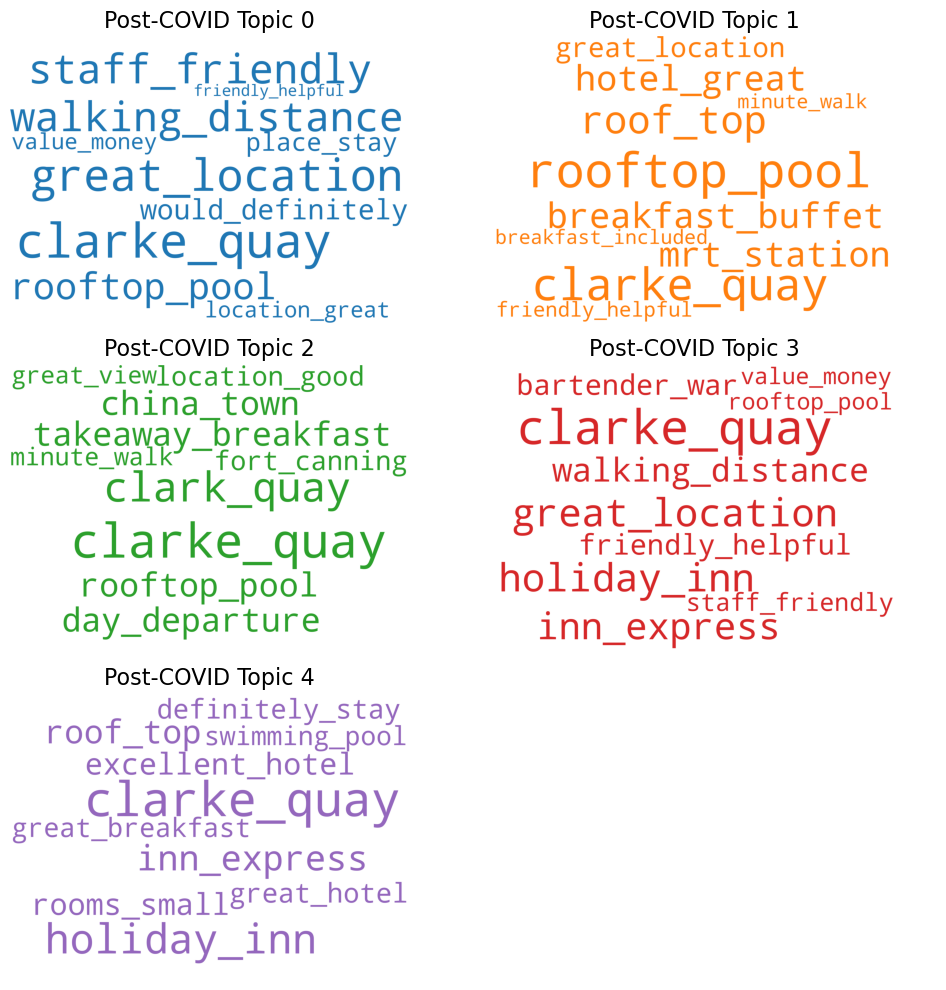

In [423]:
from wordcloud import WordCloud
import matplotlib.colors as mcolors

cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]

# Create WordClouds for each topic in the pre-COVID dataset
clouds_pre = []

for i in range(5):
    cloud = WordCloud(background_color='white',
                      width=2500,
                      height=1800,
                      max_words=10,
                      colormap='tab10',
                      color_func=lambda *args, **kwargs: cols[i],
                      prefer_horizontal=1.0)
    topic_words = dict(pre_ldamodel.show_topic(i, topn=10))
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    clouds_pre.append(cloud)

# Create WordClouds for each topic in the post-COVID dataset
clouds_post = []

for i in range(5):
    cloud = WordCloud(background_color='white',
                      width=2500,
                      height=1800,
                      max_words=10,
                      colormap='tab10',
                      color_func=lambda *args, **kwargs: cols[i],
                      prefer_horizontal=1.0)
    topic_words = dict(post_ldamodel.show_topic(i, topn=10))
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    clouds_post.append(cloud)

# Plot the WordClouds for pre-COVID topics
fig_pre, axes_pre = plt.subplots(3, 2, figsize=(10, 10), sharex=True, sharey=True)

for i, ax in enumerate(axes_pre.flatten()):
    fig_pre.add_subplot(ax)
    if i < len(clouds_pre):
        plt.gca().imshow(clouds_pre[i])
        plt.gca().set_title('Pre-COVID Topic ' + str(i), fontdict=dict(size=16))
        plt.gca().axis('off')

# Plot the WordClouds for post-COVID topics
fig_post, axes_post = plt.subplots(3, 2, figsize=(10, 10), sharex=True, sharey=True)

for i, ax in enumerate(axes_post.flatten()):
    fig_post.add_subplot(ax)
    if i < len(clouds_post):
        plt.gca().imshow(clouds_post[i])
        plt.gca().set_title('Post-COVID Topic ' + str(i), fontdict=dict(size=16))
        plt.gca().axis('off')

plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()

In [424]:
vis = pyLDAvis.gensim.prepare(topic_model=pre_ldamodel, corpus=pre_corpus, dictionary=pre_dict)
pyLDAvis.enable_notebook()
pyLDAvis.display(vis)

In [425]:
vis = pyLDAvis.gensim.prepare(topic_model=post_ldamodel, corpus=post_corpus, dictionary=post_dict)
pyLDAvis.enable_notebook()
pyLDAvis.display(vis)